# ⚠️ Advertencia de Contenido ⚠️

Este proyecto tiene como objetivo la detección de violencia de género en audios mediante modelos de transcripción y clasificación de lenguaje natural.

Para entrenar y evaluar el modelo en un entorno lo más cercano posible a la realidad, se han utilizado palabras y expresiones provenientes del dialecto cordobés, incluyendo:

✔️ Malas palabras

✔️ Lenguaje vulgar y ordinario

✔️ Expresiones violentas

El uso de este lenguaje es exclusivamente con fines académicos e investigativos, y no refleja en absoluto las opiniones o valores del autor del proyecto. Se recomienda discreción al explorar los datos o realizar pruebas con el modelo.

✔️ Importante: Si eres sensible a este tipo de contenido, considera tomar las precauciones necesarias antes de interactuar con el dataset o las transcripciones generadas.



# Instalacion de las librerias

In [ ]:
pip install transformers

In [ ]:
!pip install noisereduce

In [ ]:
!pip install pyspellchecker

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 25.7 MB/s eta 0:00:00


In [ ]:
pip install git+https://github.com/openai/whisper.git

  Cloning https://github.com/openai/whisper.git to /tmp/pip-req-build-ls7t1oz_
  Running command git clone --filter=blob:none --quiet https://github.com/openai/whisper.git /tmp/pip-req-build-ls7t1oz_
  Resolved https://github.com/openai/whisper.git to commit 173ff7dd1d9fb1c4fddea0d41d704cfefeb8908c
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.5/209.5 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.4 MB/s eta 0:00:00
  Created wheel for openai-whisper: filename=openai_whisper-20240930-py3-none-any.whl size=803557 sha256=4b415fe77ef8087bd4b458da07d3bb1fe1105221a6ef3922e28eba01f61c7e67
  Stored in directory: /tmp/pip-ephem-wheel-cache-qdw9945l/wheels/8b/6c/d0/622666868c179f156cf595c8b6f06f88bc5d80c4b31dccaa03
Successfully built openai-whisper


In [ ]:
pip install pydub

# Importacion de las librerias

In [ ]:
import whisper
import torch
import pandas as pd
import librosa
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, cross_validate
import seaborn as sns
from sklearn.metrics import accuracy_score
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from nltk.tokenize import regexp_tokenize
import nltk
from nltk import word_tokenize
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords
import itertools
from spellchecker import SpellChecker
import re
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
nltk.download('punkt')
nltk.download('stopwords')
from sklearn.ensemble import RandomForestClassifier
import joblib
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import Normalizer
from torch.utils.data import DataLoader, Dataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification, AdamW
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import learning_curve

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# Analisis de audio

## Verificacion del tipo de audio

In [ ]:
def verificar_tipo_audio(ruta_audio):
    # Cargar solo la información del archivo sin la señal completa
    y, sr = librosa.load(ruta_audio, sr=None, mono=False)  # mono=False para cargar el audio con todos sus canales

    # Verificar si el archivo tiene un canal (mono) o dos canales (estéreo)
    if len(y.shape) == 1:
        tipo = 'mono'
    elif len(y.shape) == 2:
        tipo = 'estéreo'
    else:
        tipo = 'desconocido'

    return tipo

# Directorio que contiene los archivos de audio y subcarpetas
directorio_audio = '/content/drive/MyDrive/PLN Palacios Lorenzo'

# Iterar sobre los archivos de la carpeta y subcarpetas
for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.wav') or file.endswith('.opus'):  # Extensiones de audio soportadas
            ruta_audio = os.path.join(root, file)
            tipo_audio = verificar_tipo_audio(ruta_audio)
            print(f"El archivo {file} es {tipo_audio}.")

El archivo Audio de WhatsApp 2024-09-28 a las 19.44.45_794804b9.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.42.01_b0842299.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.41.50_a42b47a8.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.42.46_23bb57c8.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.43.00_ede74938.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.43.26_3e99c2c0.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.43.41_74741d58.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.44.16_2f90fd89.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.44.38_8d58e7f5.wav.opus es mono.
El archivo Audio de WhatsApp 2024-09-28 a las 19.44.51_01550447.wav.opus es mono.
El archivo Audio de WhatsApp 2024-10-08 a las olga 2.opus es mono.
El archivo Audio de WhatsApp 2024-10-08 a las olga 3.opus es mono.
El archivo Audio de WhatsApp 2024-10-06 a las 

## Intensidad

Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-09-27 a las 12.47.58_5c269ca3.wav.opus (Categoría: violento)


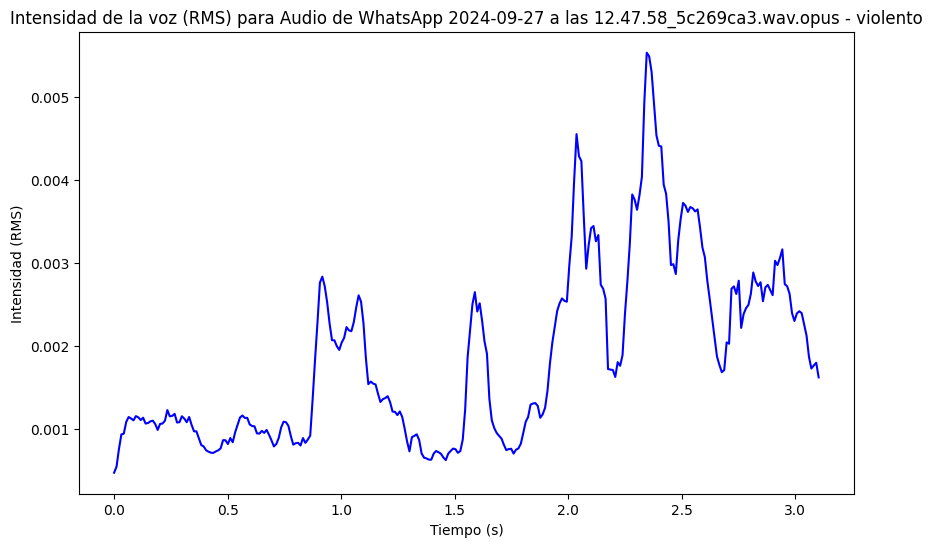

Intensidad promedio para Audio de WhatsApp 2024-09-27 a las 12.47.58_5c269ca3.wav.opus (violento): 0.0018703335663303733
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-07 a las 19.47.16_0cad6ee7.wav.opus (Categoría: violento)


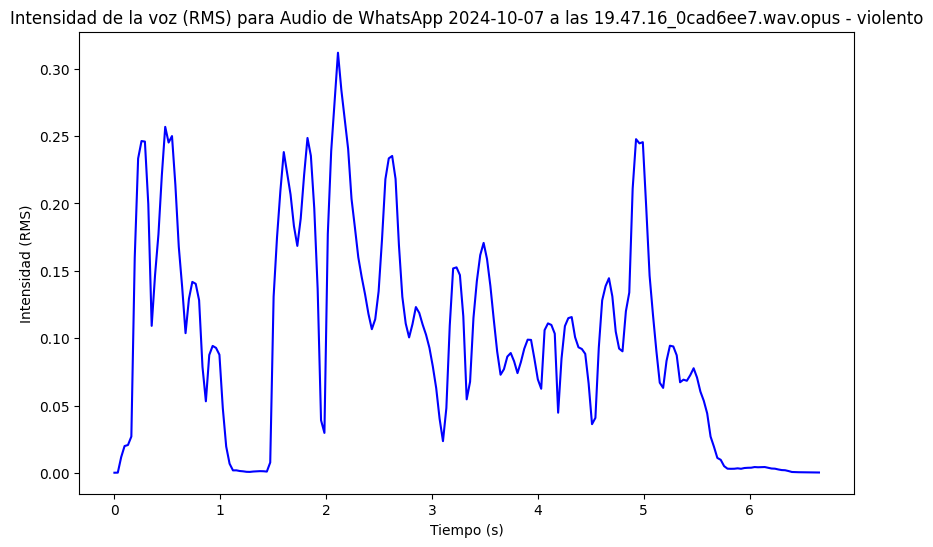

Intensidad promedio para Audio de WhatsApp 2024-10-07 a las 19.47.16_0cad6ee7.wav.opus (violento): 0.10047708451747894
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-07 a las 19.47.27_954ef691.wav.opus (Categoría: violento)


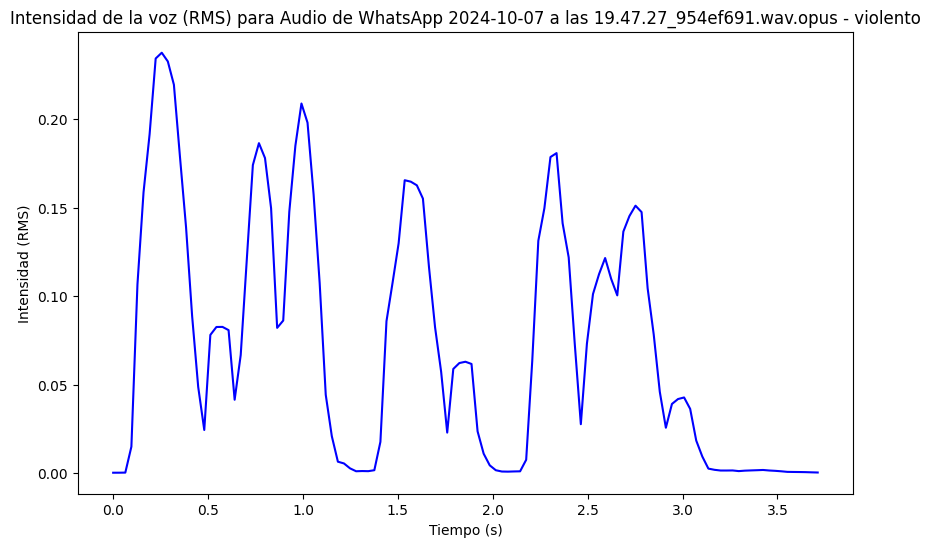

Intensidad promedio para Audio de WhatsApp 2024-10-07 a las 19.47.27_954ef691.wav.opus (violento): 0.07406214624643326
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-03 a las 12.41.29_6cca9dd1.wav.opus (Categoría: violento)


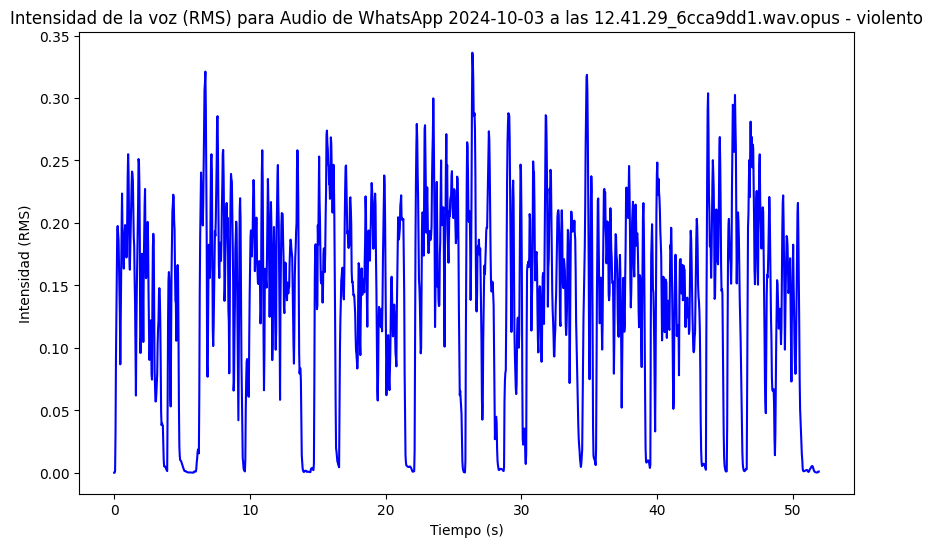

Intensidad promedio para Audio de WhatsApp 2024-10-03 a las 12.41.29_6cca9dd1.wav.opus (violento): 0.14033390581607819
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 1.opus (Categoría: violento)


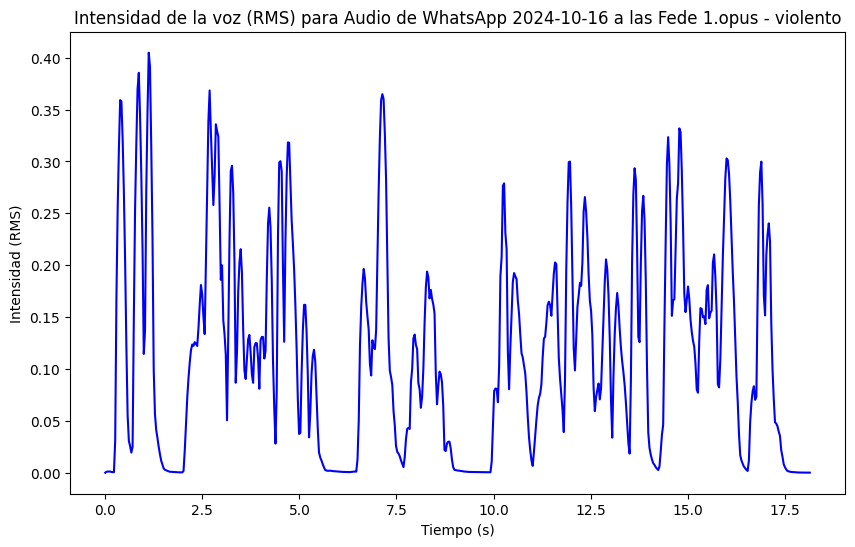

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 1.opus (violento): 0.1178337037563324
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 2.opus (Categoría: violento)


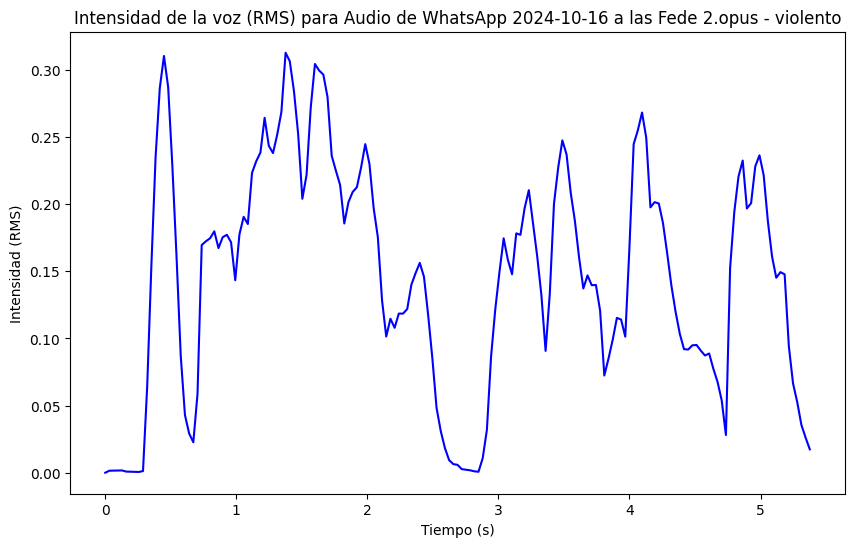

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 2.opus (violento): 0.14650119841098785
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 3.opus (Categoría: violento)


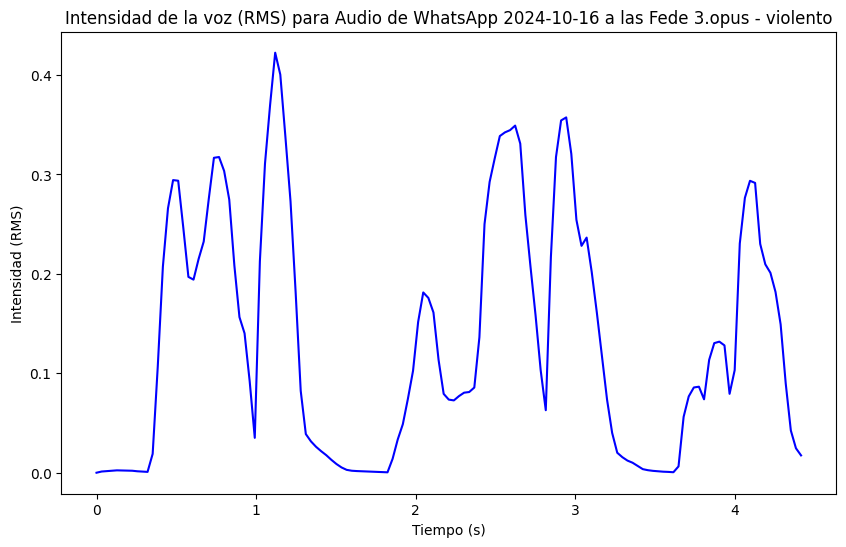

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 3.opus (violento): 0.1334100067615509
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 4.opus (Categoría: violento)


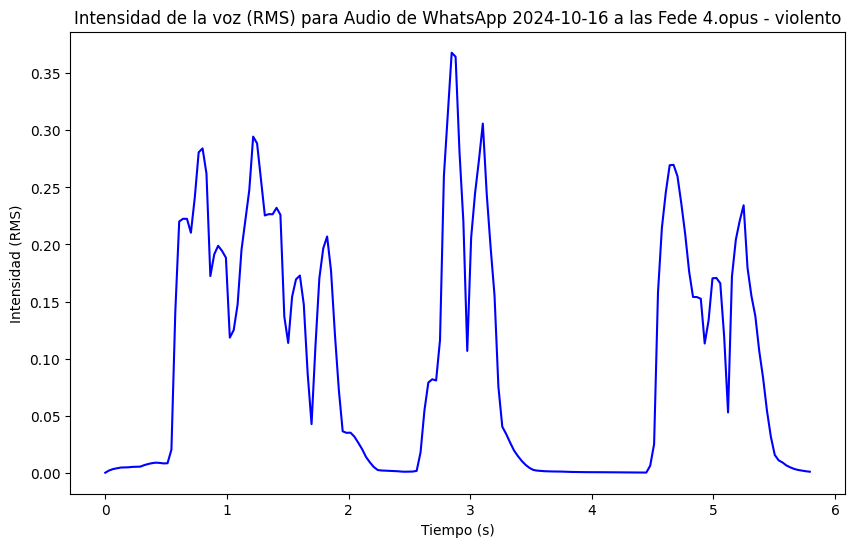

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 4.opus (violento): 0.09781940281391144
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 5.opus (Categoría: violento)


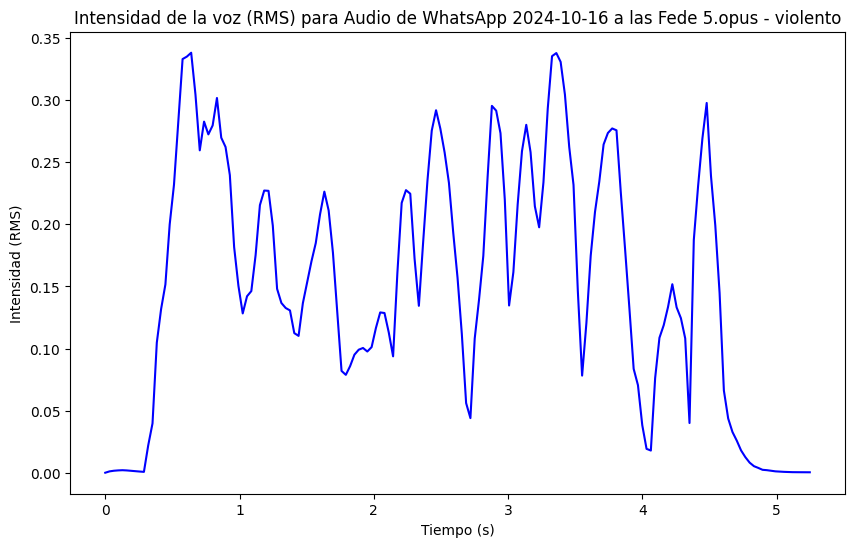

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 5.opus (violento): 0.15152138471603394
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 6.opus (Categoría: violento)


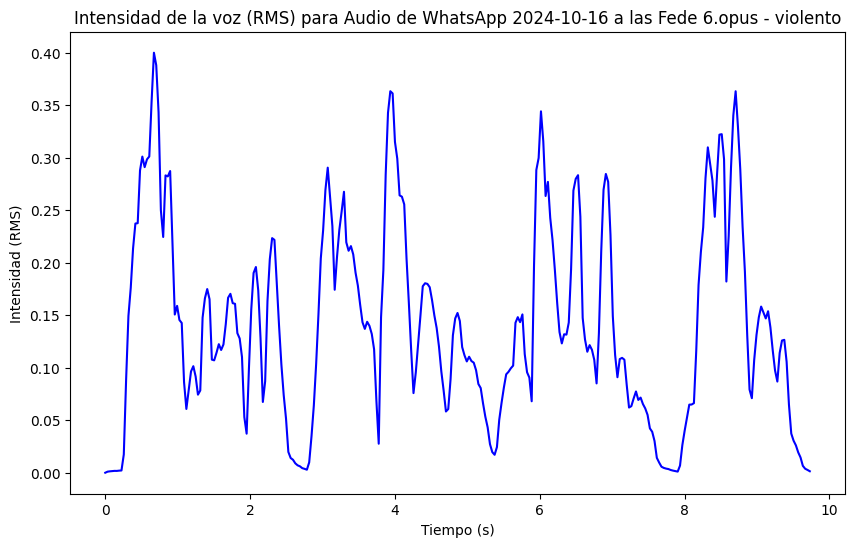

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 6.opus (violento): 0.14196664094924927
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 7.opus (Categoría: violento)


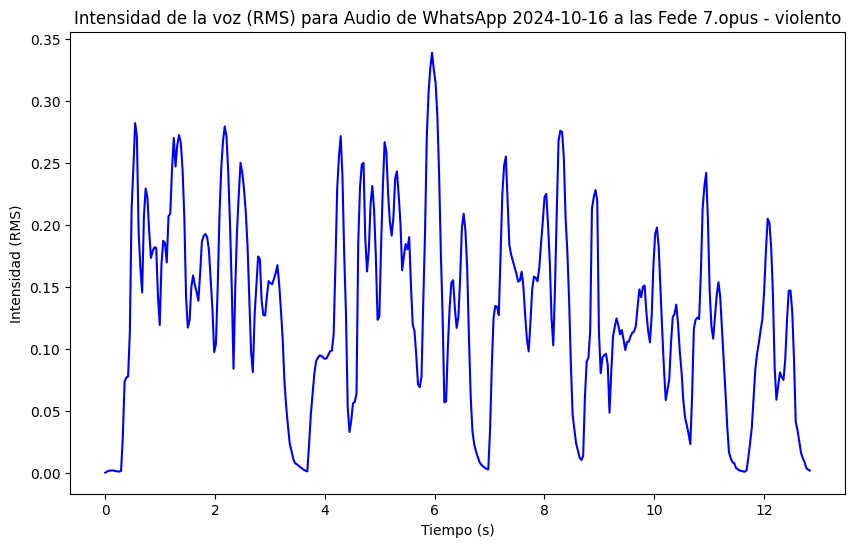

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 7.opus (violento): 0.13090024888515472
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 8.opus (Categoría: violento)


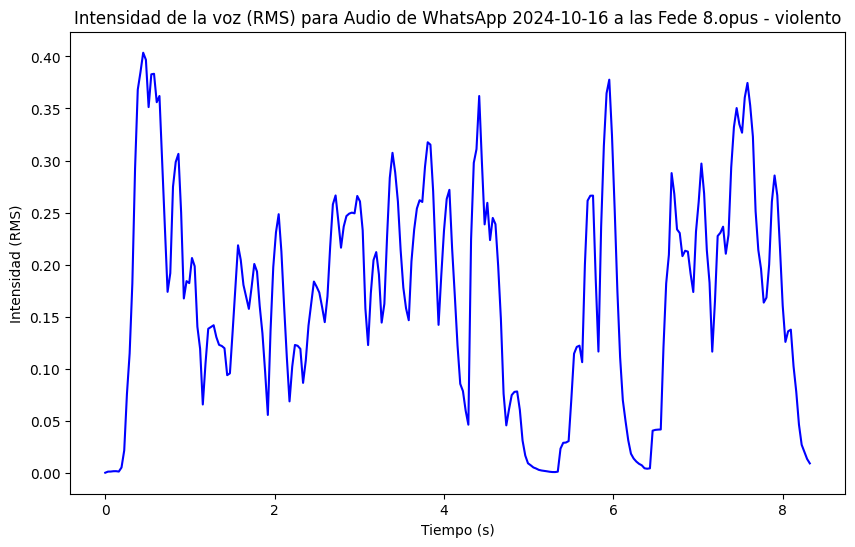

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 8.opus (violento): 0.17205710709095
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 9.opus (Categoría: violento)


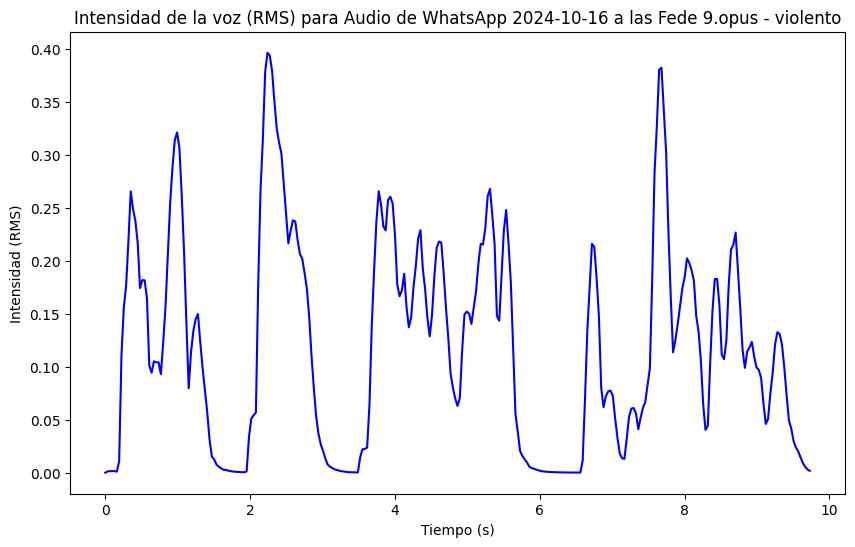

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 9.opus (violento): 0.12020774185657501
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 10.opus (Categoría: violento)


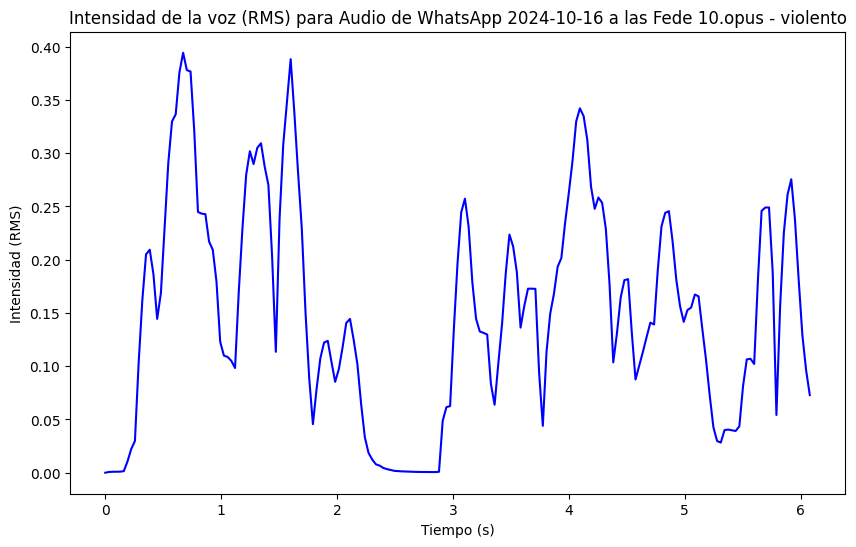

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 10.opus (violento): 0.15179260075092316
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 11.opus (Categoría: violento)


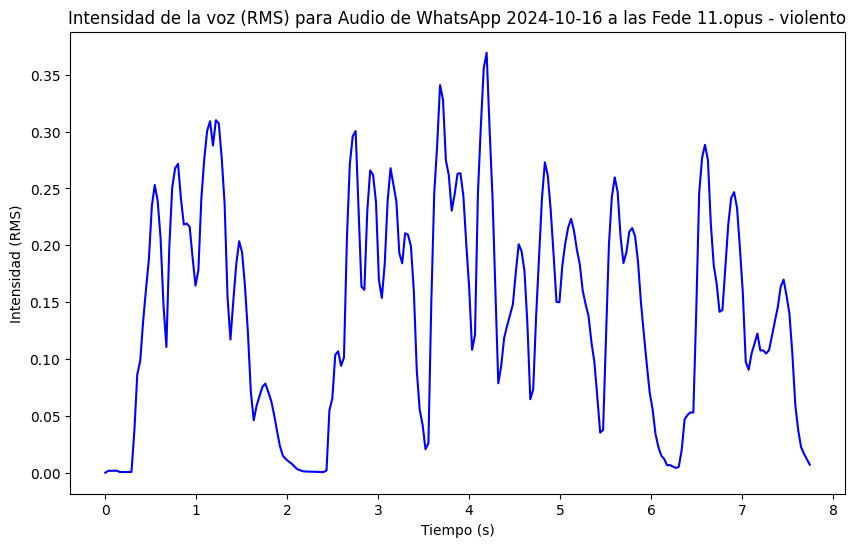

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 11.opus (violento): 0.14606699347496033
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 12.opus (Categoría: violento)


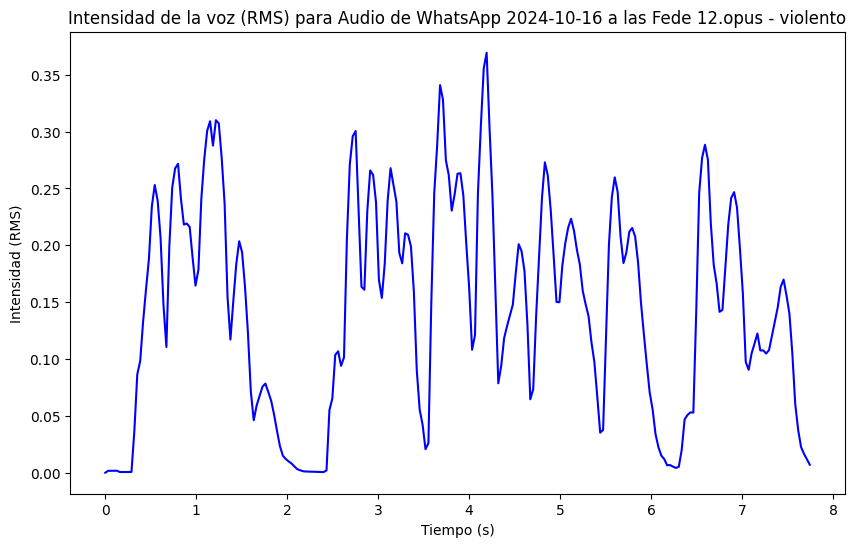

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 12.opus (violento): 0.14606699347496033
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 13.opus (Categoría: violento)


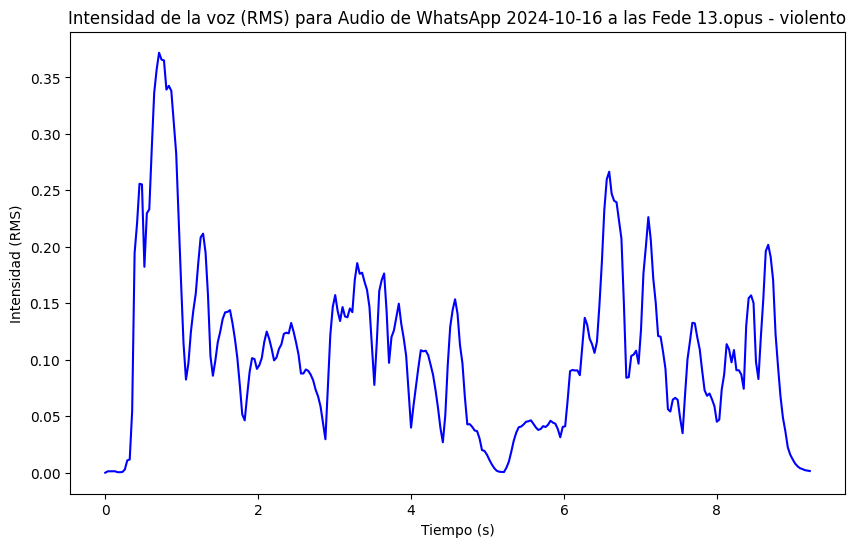

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 13.opus (violento): 0.10774877667427063
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las 14.opus (Categoría: violento)


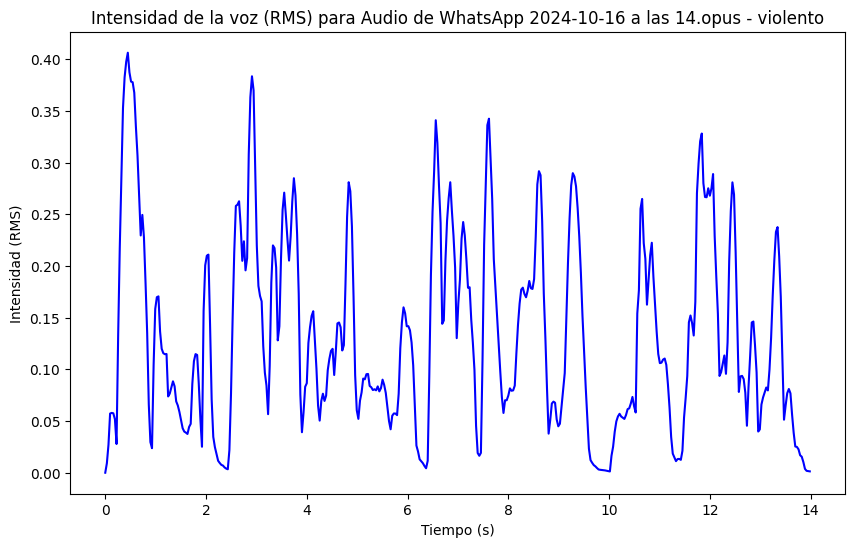

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las 14.opus (violento): 0.1332760453224182
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las 15.opus (Categoría: violento)


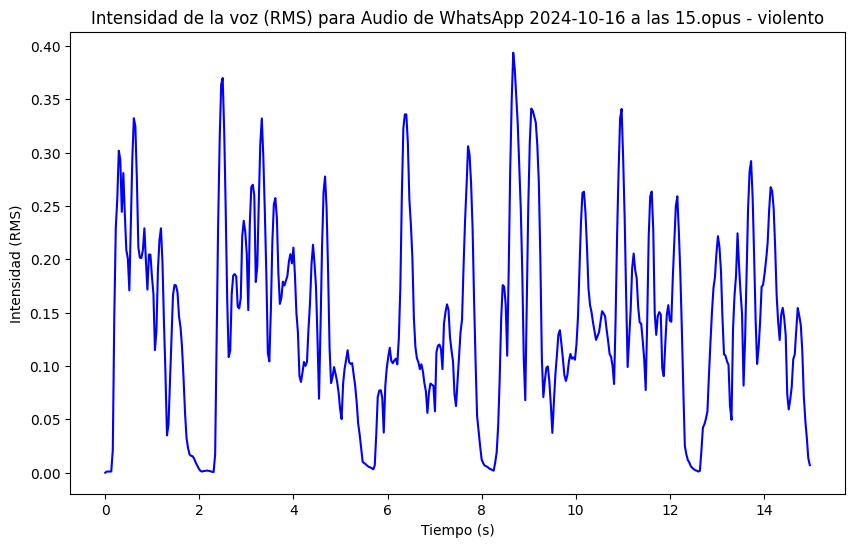

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las 15.opus (violento): 0.1432679146528244
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 16.opus (Categoría: violento)


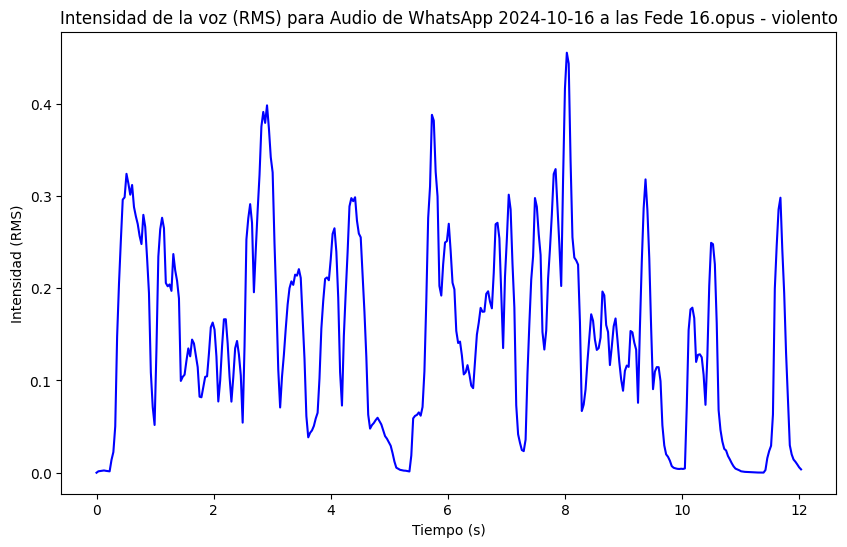

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 16.opus (violento): 0.14778901636600494
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 17.opus (Categoría: violento)


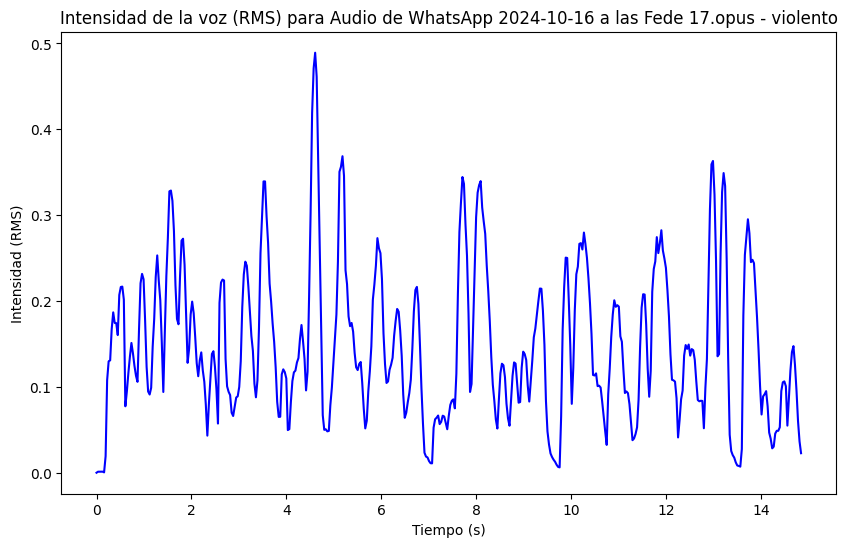

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 17.opus (violento): 0.14919635653495789
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 18.opus (Categoría: violento)


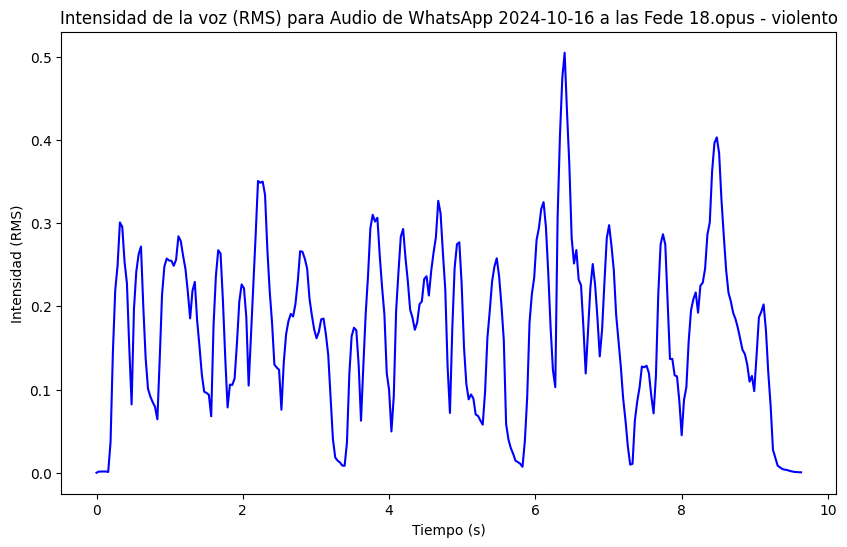

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 18.opus (violento): 0.17411430180072784
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 20.opus (Categoría: violento)


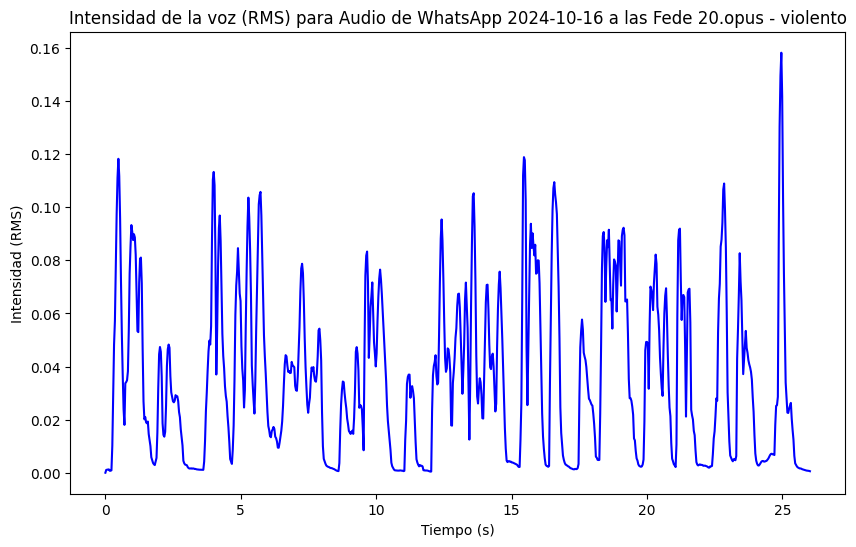

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 20.opus (violento): 0.03610997274518013
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 21.opus (Categoría: violento)


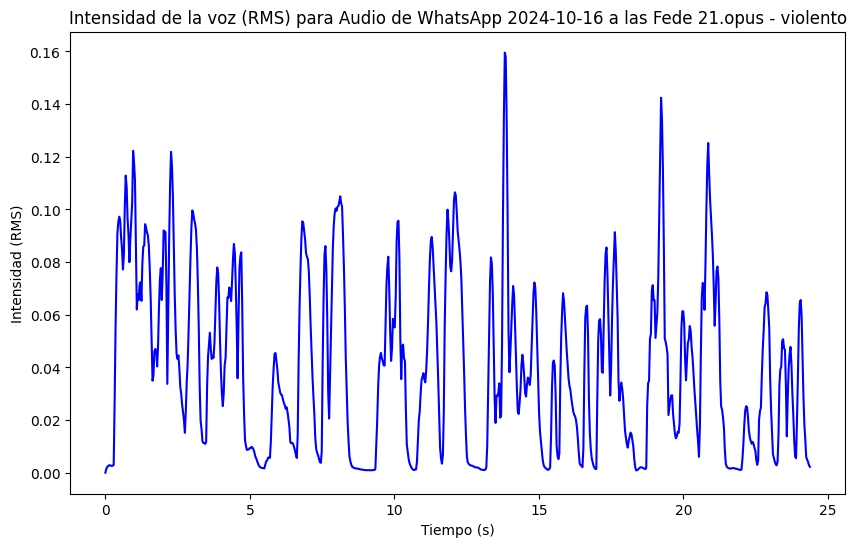

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 21.opus (violento): 0.04085727408528328
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 22.opus (Categoría: violento)


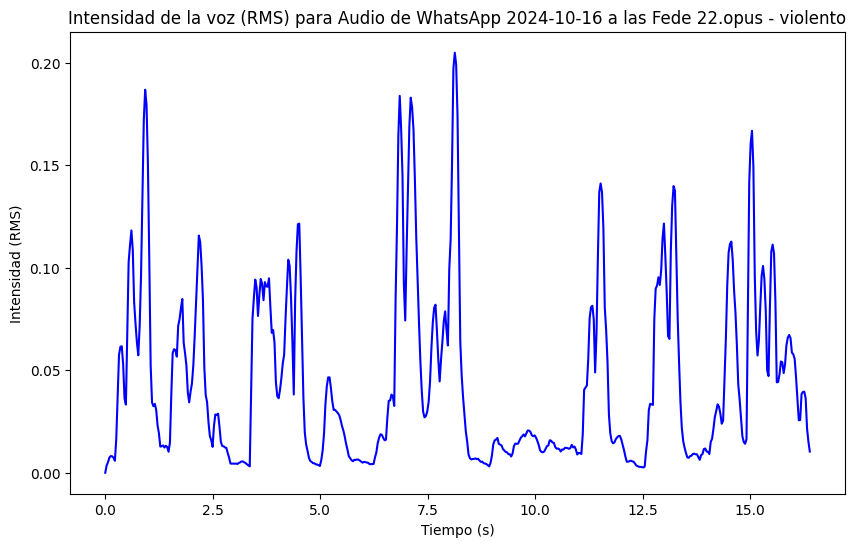

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 22.opus (violento): 0.04523630067706108
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 23.opus (Categoría: violento)


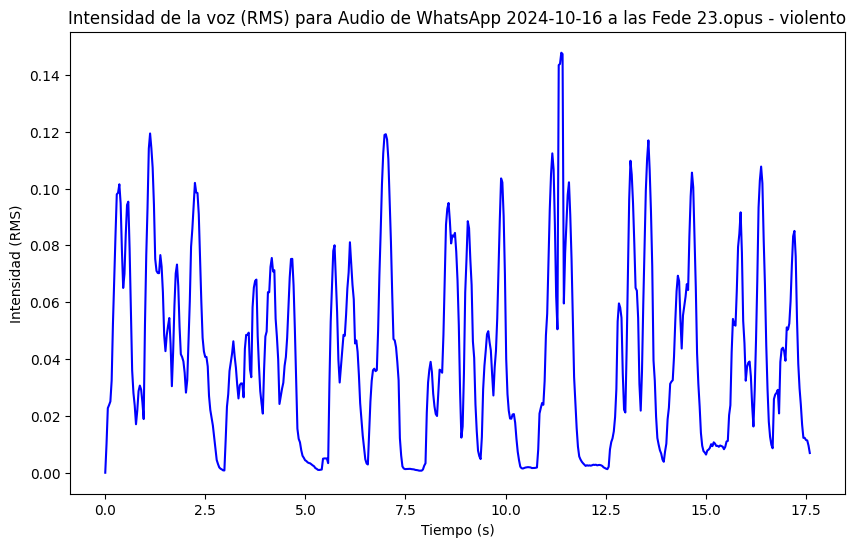

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 23.opus (violento): 0.04171302169561386
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 24.opus (Categoría: violento)


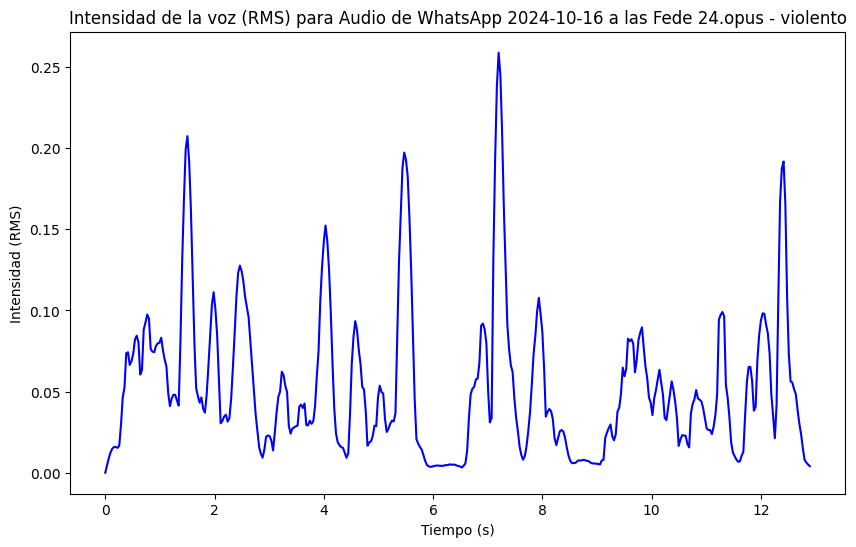

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 24.opus (violento): 0.053657349199056625
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 25.opus (Categoría: violento)


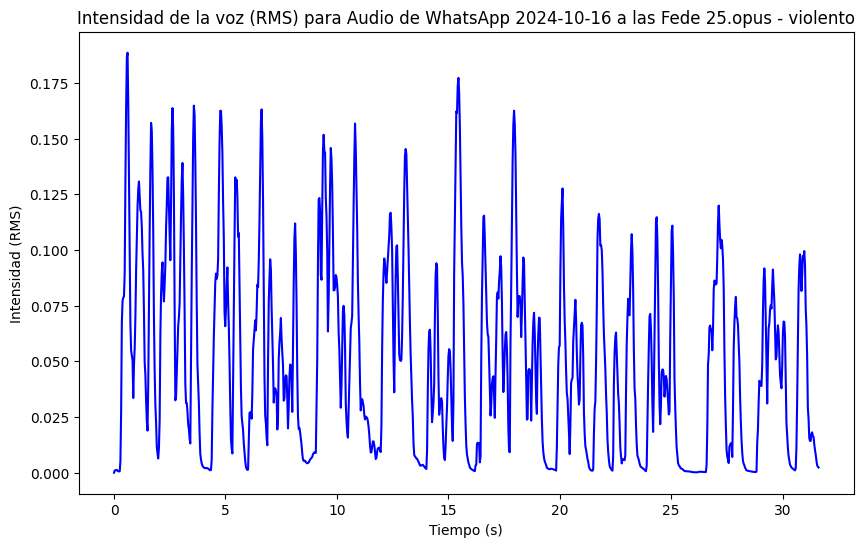

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 25.opus (violento): 0.05135400965809822
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 26.opus (Categoría: violento)


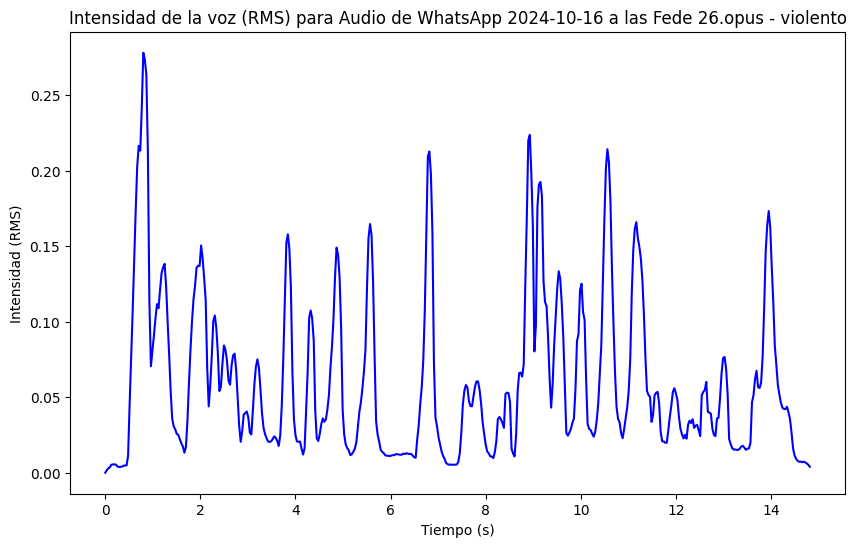

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 26.opus (violento): 0.06128646060824394
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 27.opus (Categoría: violento)


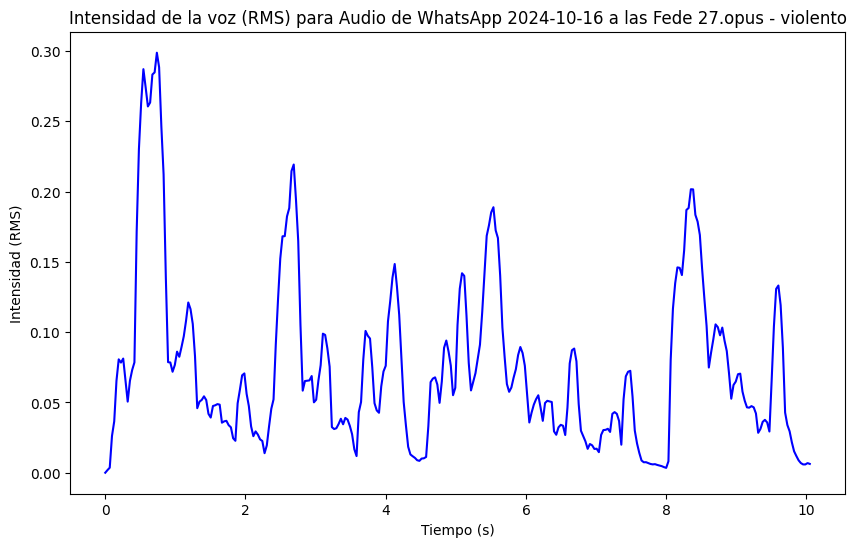

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 27.opus (violento): 0.07506327331066132
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 28.opus (Categoría: violento)


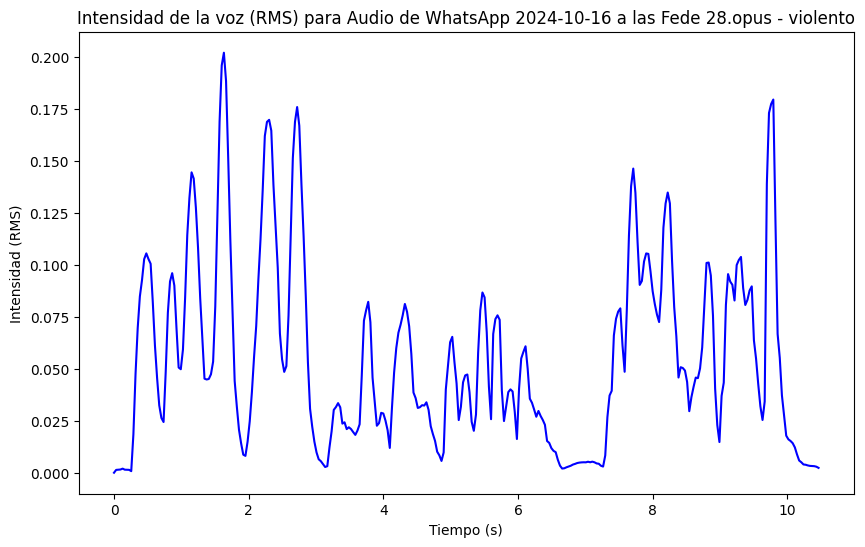

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 28.opus (violento): 0.05593448132276535
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 29.opus (Categoría: violento)


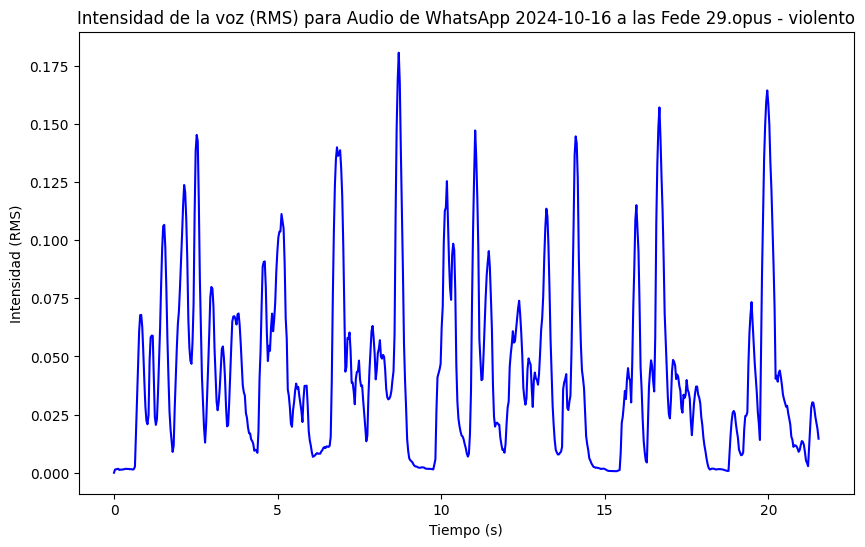

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 29.opus (violento): 0.04318682849407196
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 30.opus (Categoría: violento)


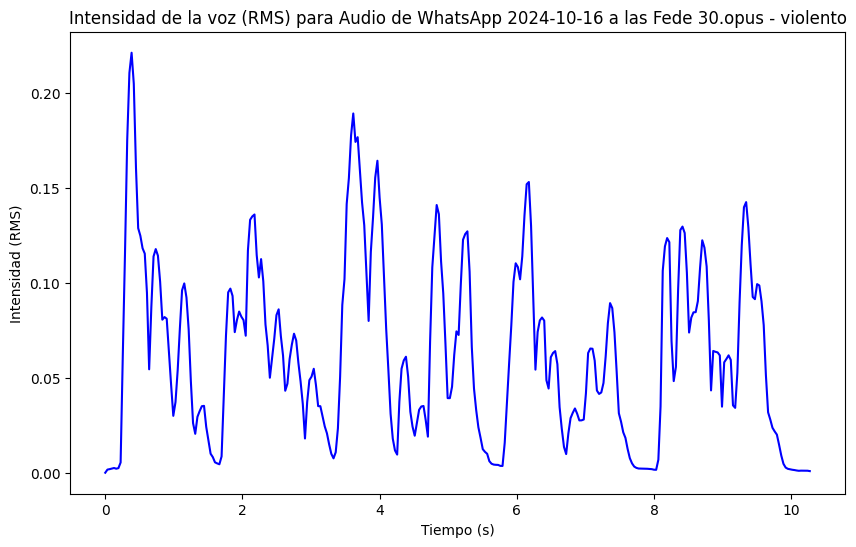

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 30.opus (violento): 0.06334642320871353
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 31.opus (Categoría: violento)


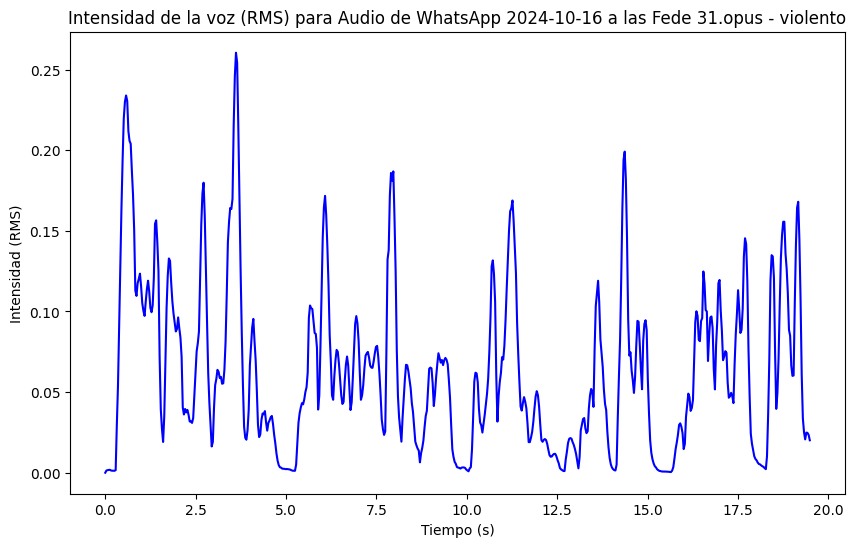

Intensidad promedio para Audio de WhatsApp 2024-10-16 a las Fede 31.opus (violento): 0.06388452649116516
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo32.opus (Categoría: violento)


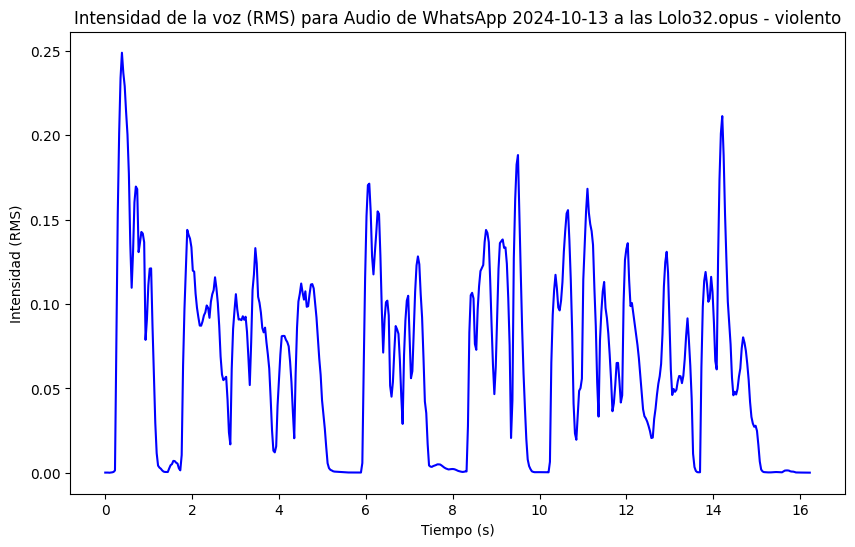

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo32.opus (violento): 0.06645308434963226
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo33.opus (Categoría: violento)


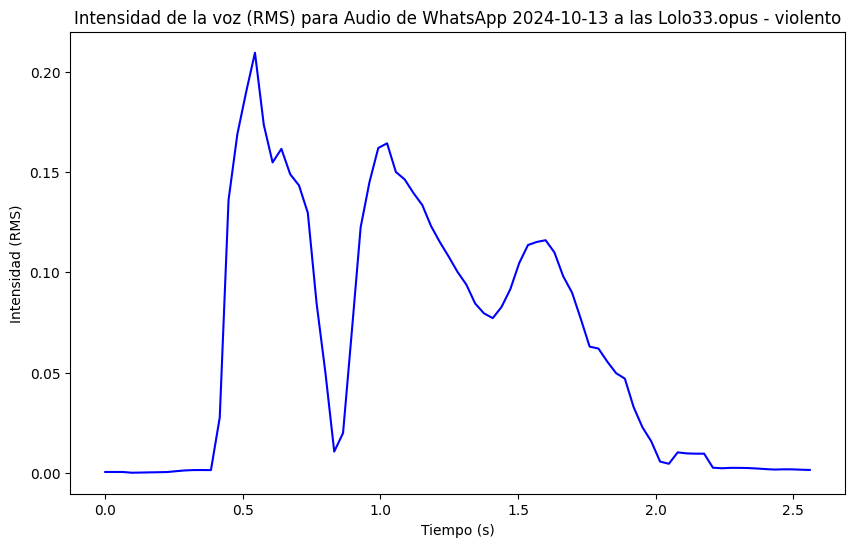

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo33.opus (violento): 0.06487482786178589
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 34.opus (Categoría: violento)


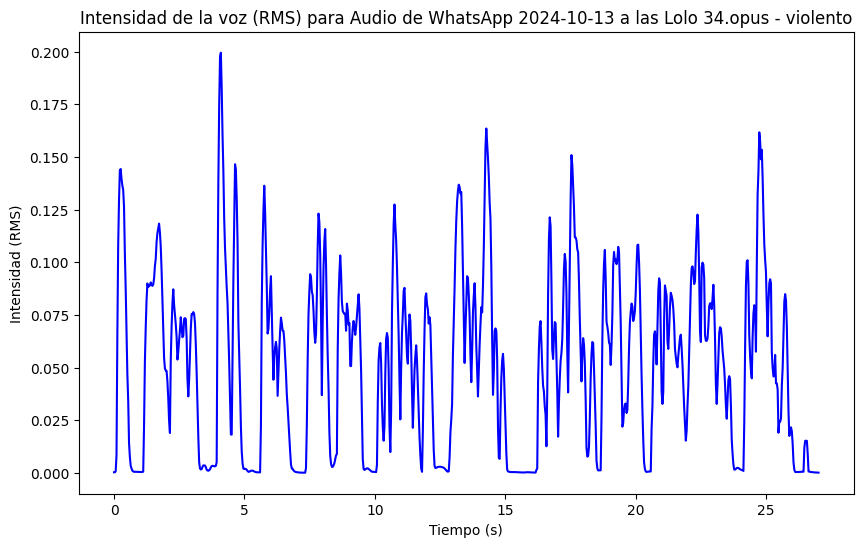

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 34.opus (violento): 0.05214666947722435
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 35.opus (Categoría: violento)


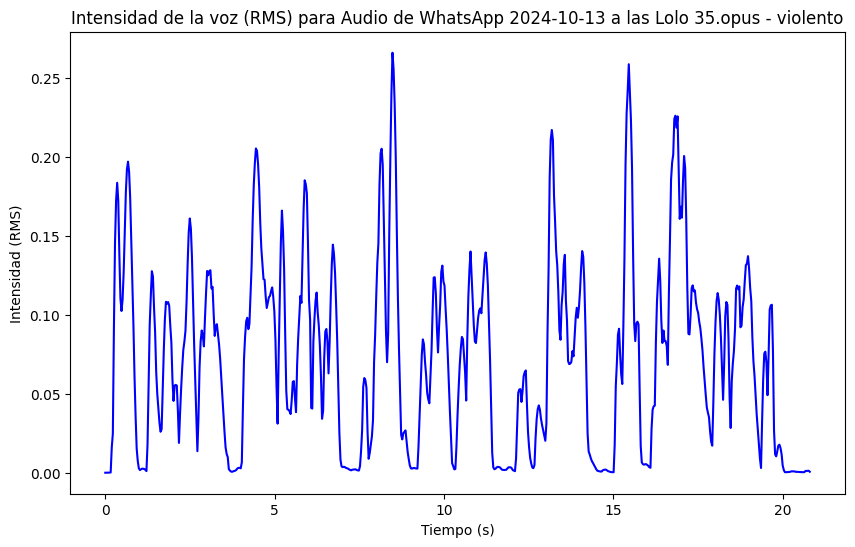

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 35.opus (violento): 0.07328397780656815
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 36.opus (Categoría: violento)


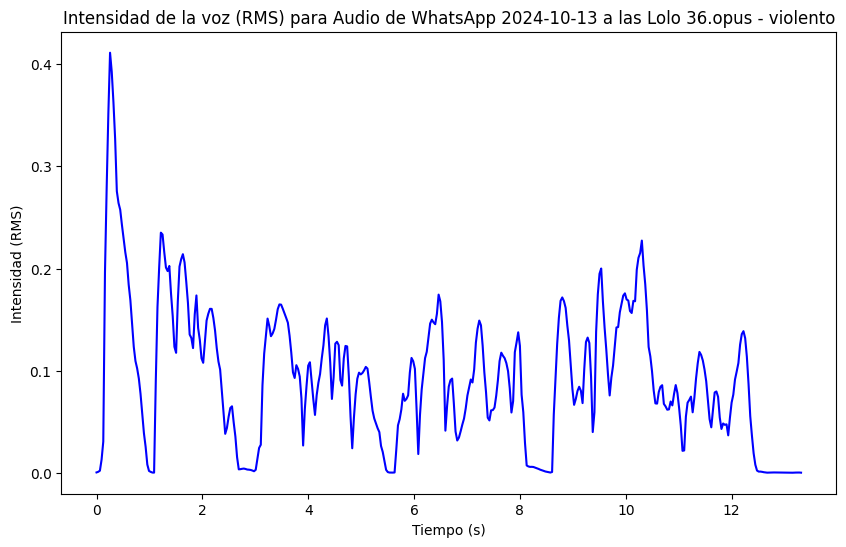

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 36.opus (violento): 0.09341109544038773
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 37.opus (Categoría: violento)


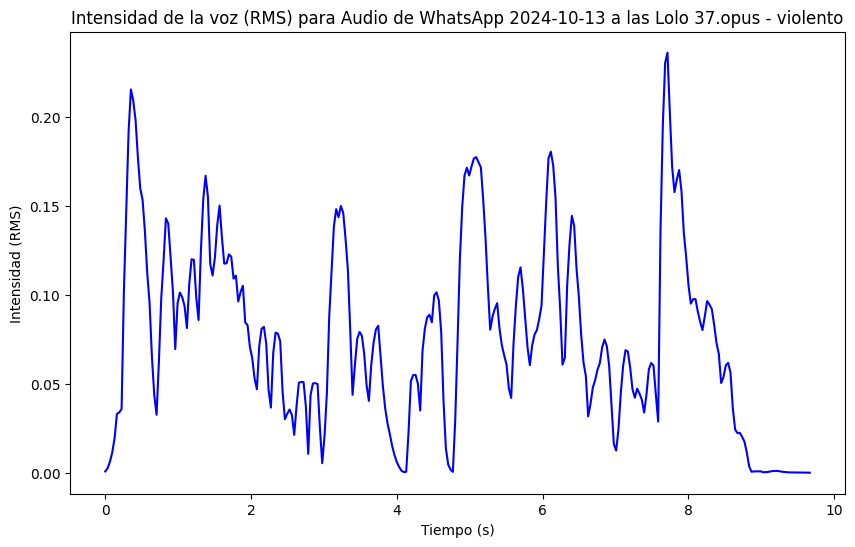

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 37.opus (violento): 0.07640497386455536
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 38.opus (Categoría: violento)


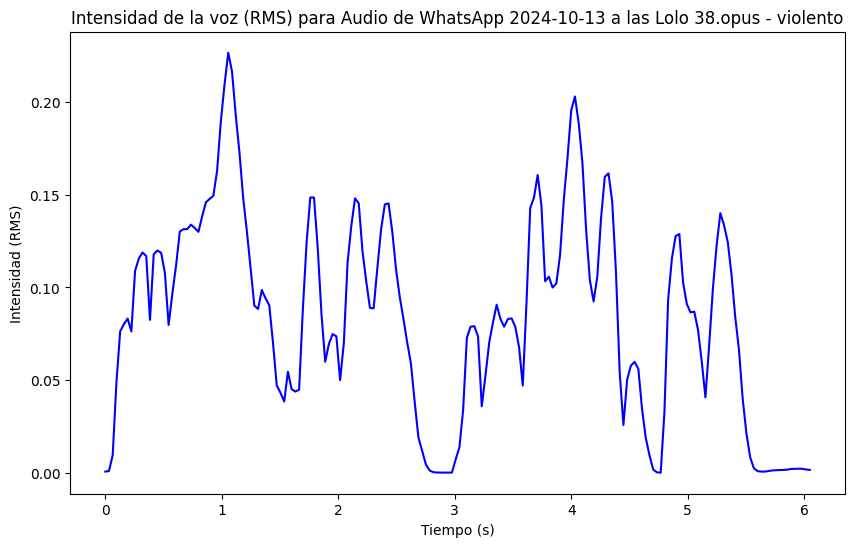

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 38.opus (violento): 0.08404257148504257
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 39.opus (Categoría: violento)


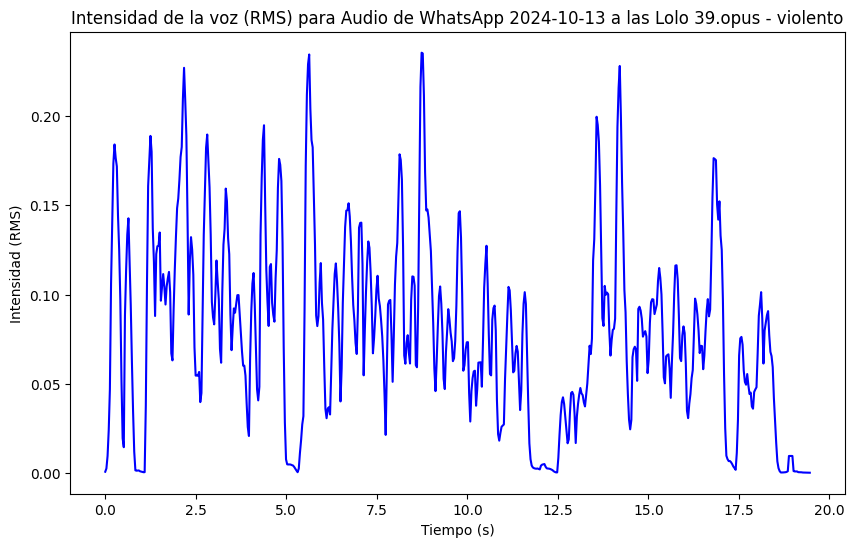

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 39.opus (violento): 0.07948029041290283
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 40.opus (Categoría: violento)


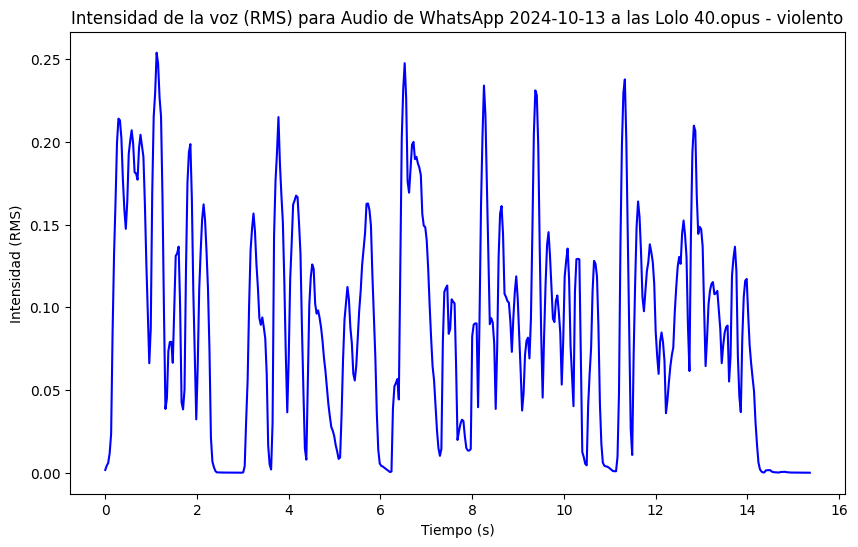

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 40.opus (violento): 0.08906985074281693
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 41.opus (Categoría: violento)


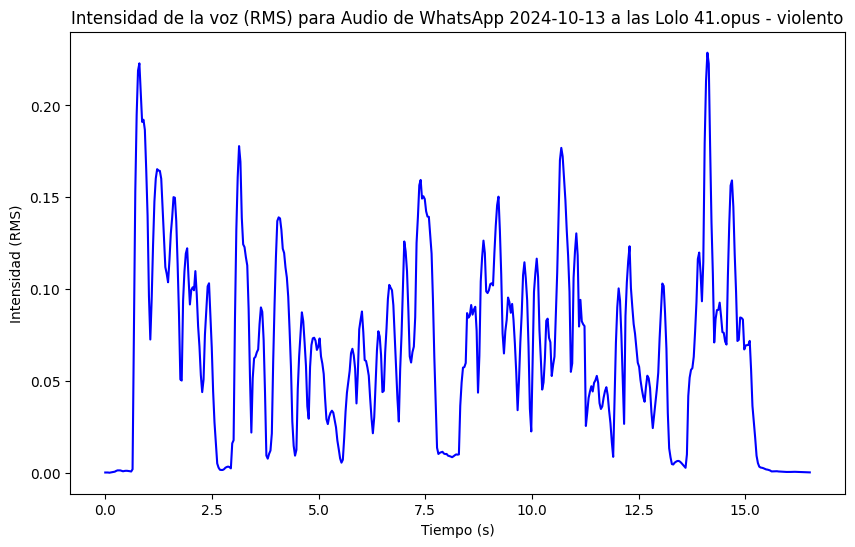

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 41.opus (violento): 0.06773712486028671
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 42.opus (Categoría: violento)


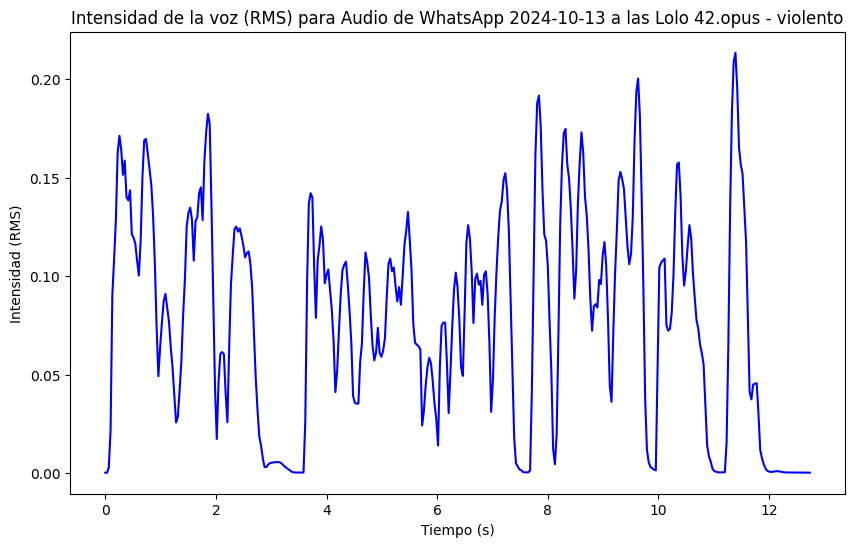

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 42.opus (violento): 0.07841520756483078
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 43.opus (Categoría: violento)


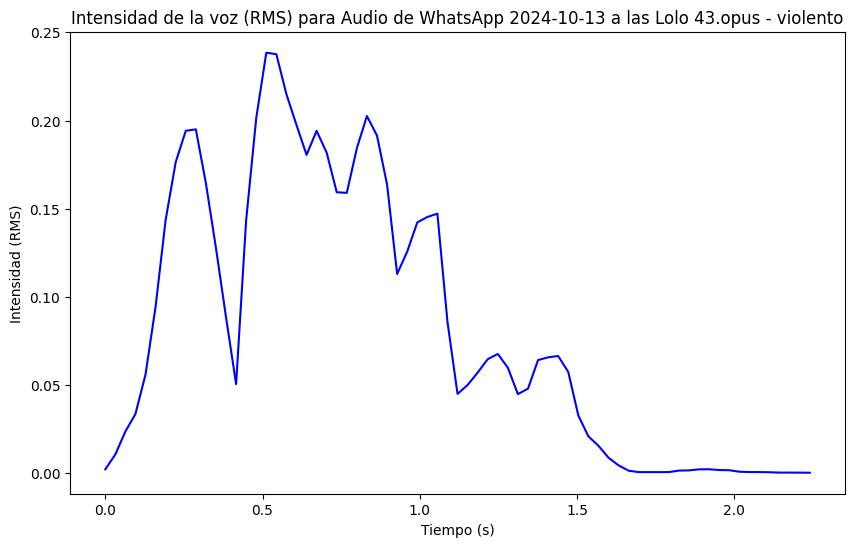

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 43.opus (violento): 0.08112522959709167
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-13 a las Lolo 44.opus (Categoría: violento)


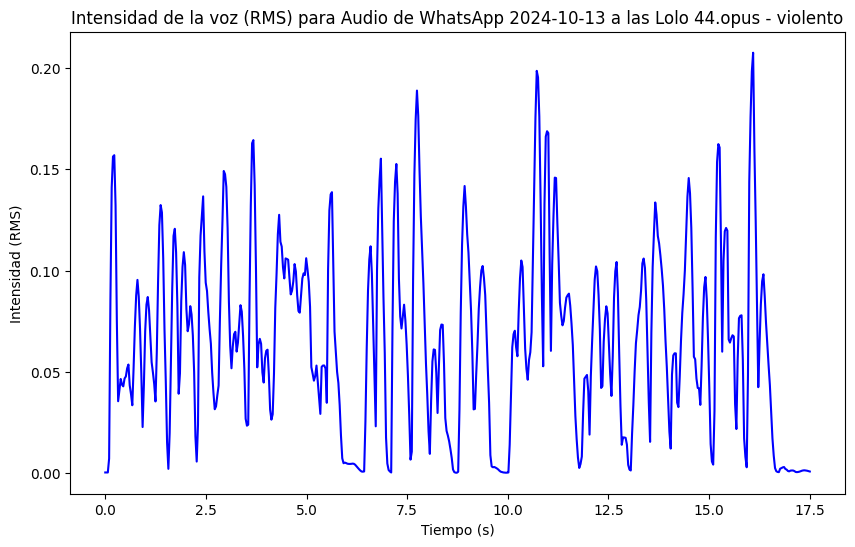

Intensidad promedio para Audio de WhatsApp 2024-10-13 a las Lolo 44.opus (violento): 0.06606350839138031
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las Lolo 45.opus (Categoría: violento)


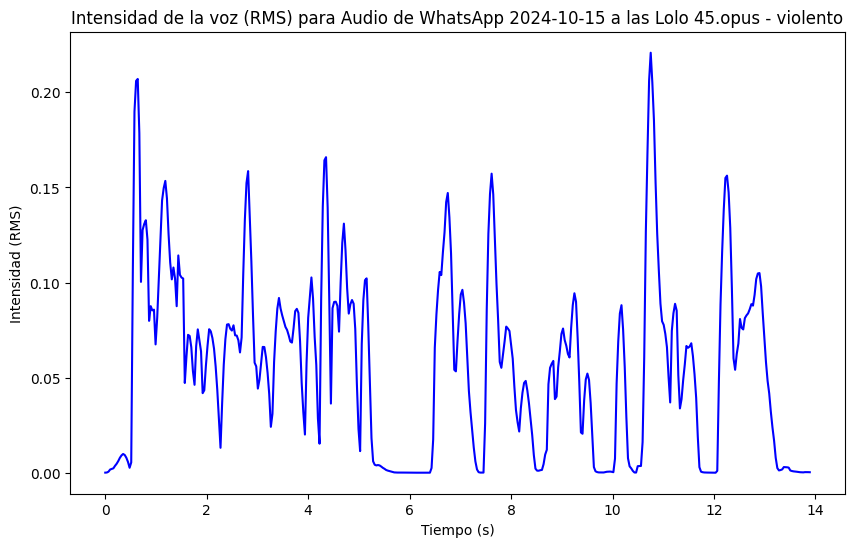

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las Lolo 45.opus (violento): 0.05718608200550079
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las Lolo 44.opus (Categoría: violento)


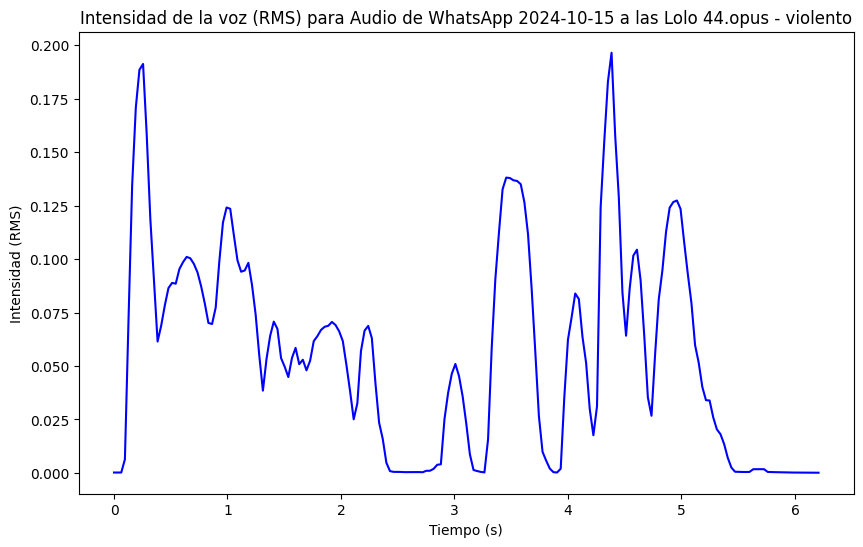

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las Lolo 44.opus (violento): 0.05634378269314766
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las Lolo 46.opus (Categoría: violento)


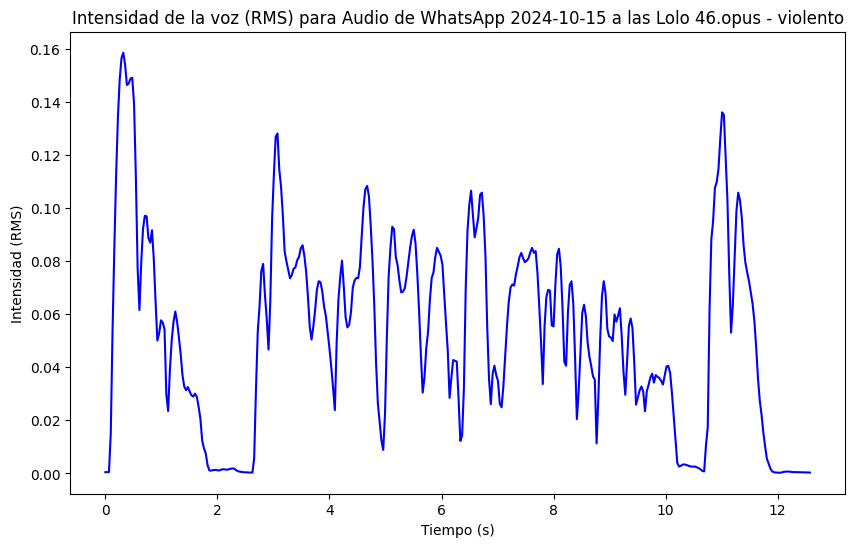

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las Lolo 46.opus (violento): 0.05293788015842438
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las Lolo 47.opus (Categoría: violento)


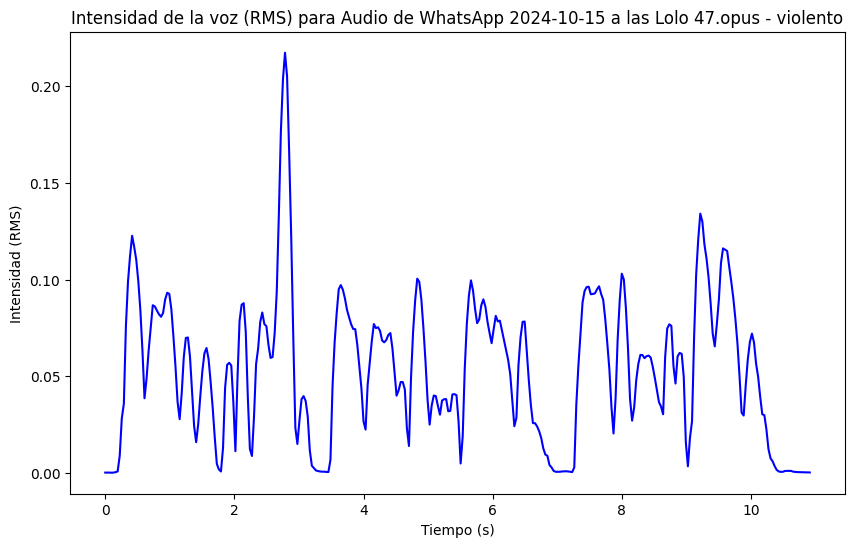

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las Lolo 47.opus (violento): 0.054056134074926376
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las Lolo 48.opus (Categoría: violento)


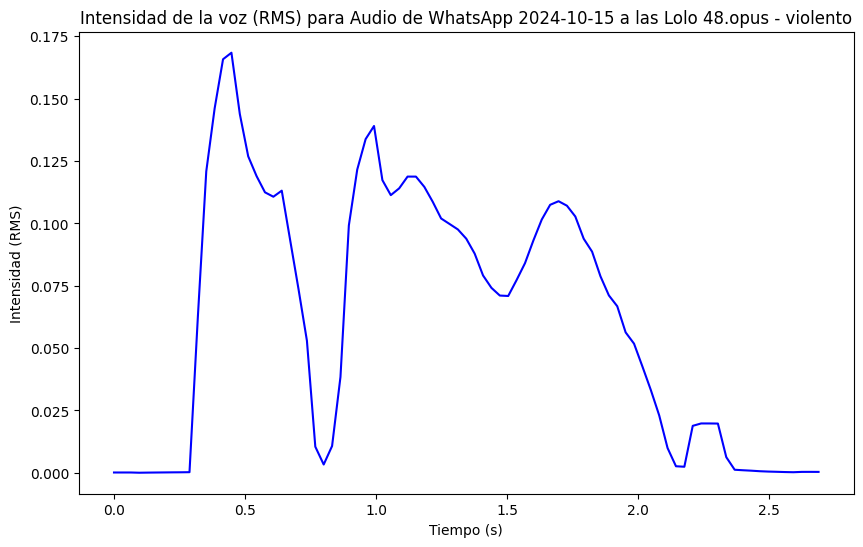

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las Lolo 48.opus (violento): 0.06168347969651222
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las Lolo 49.opus (Categoría: violento)


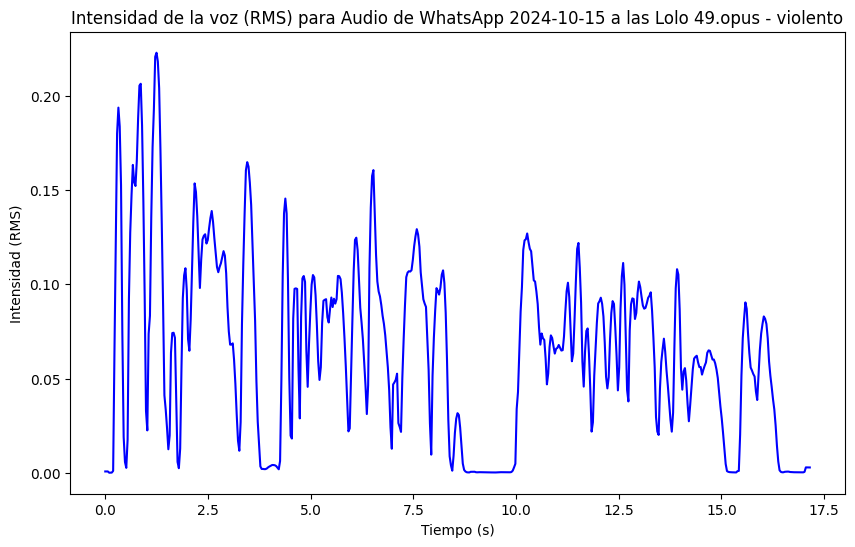

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las Lolo 49.opus (violento): 0.0655907467007637
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las Lolo 50.opus (Categoría: violento)


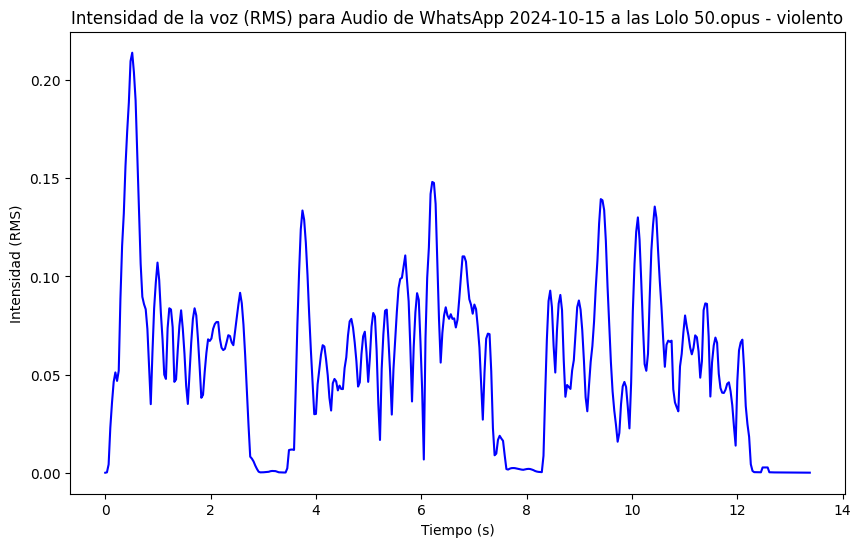

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las Lolo 50.opus (violento): 0.05614429712295532
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las  Lolo 51.opus (Categoría: violento)


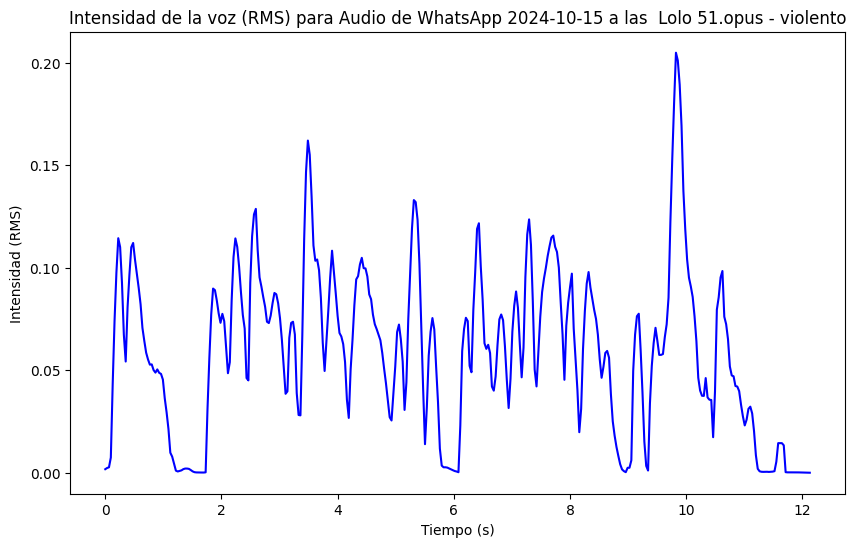

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las  Lolo 51.opus (violento): 0.059139203280210495
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las  Lolo 52.opus (Categoría: violento)


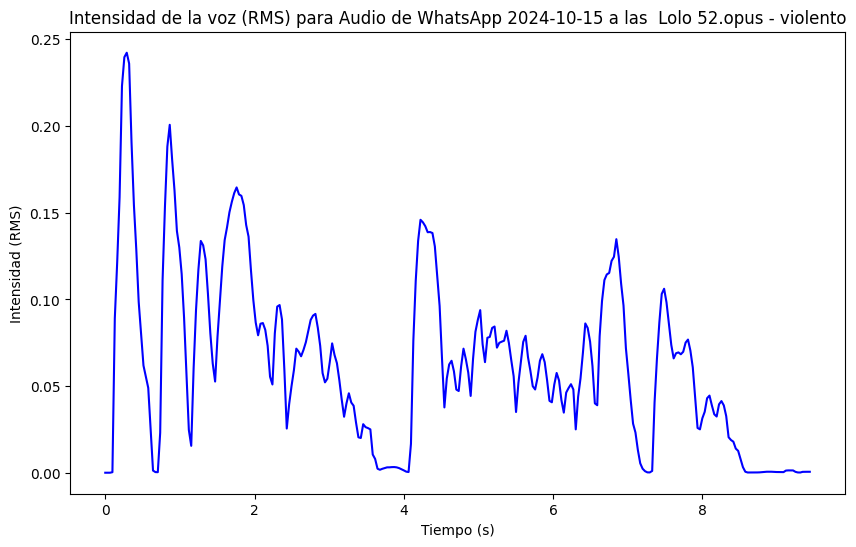

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las  Lolo 52.opus (violento): 0.06367811560630798
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-15 a las  Lolo 53.opus (Categoría: violento)


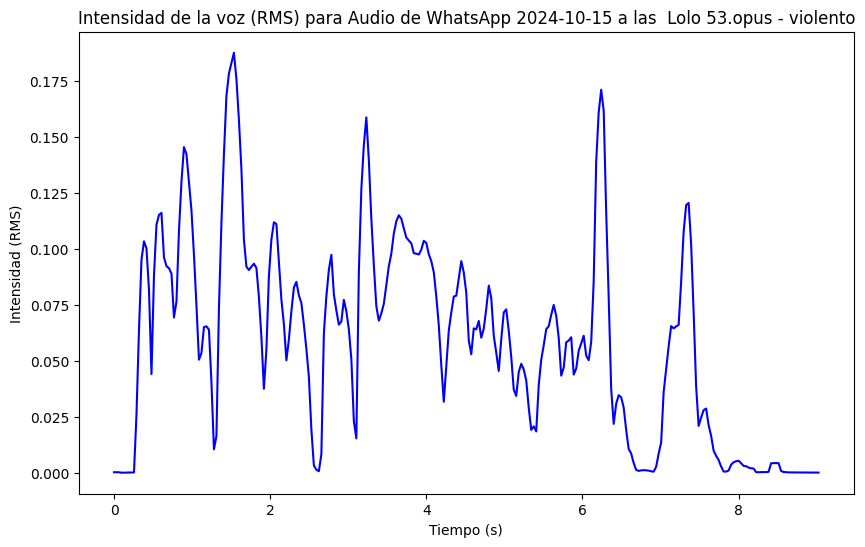

Intensidad promedio para Audio de WhatsApp 2024-10-15 a las  Lolo 53.opus (violento): 0.0588393472135067
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.06.18_dafdb8d4.waptt.opus (Categoría: violento)


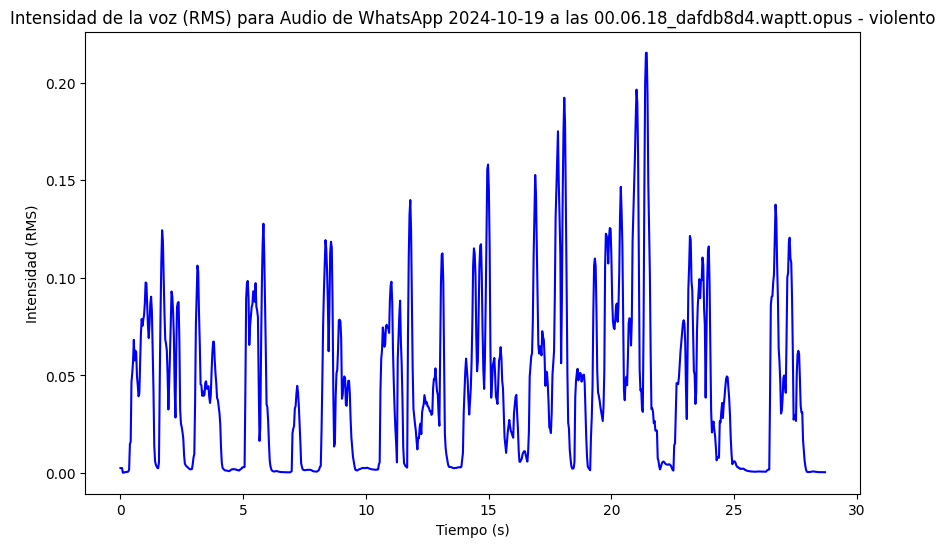

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.06.18_dafdb8d4.waptt.opus (violento): 0.04407691955566406
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.07.09_7e06638f.waptt.opus (Categoría: violento)


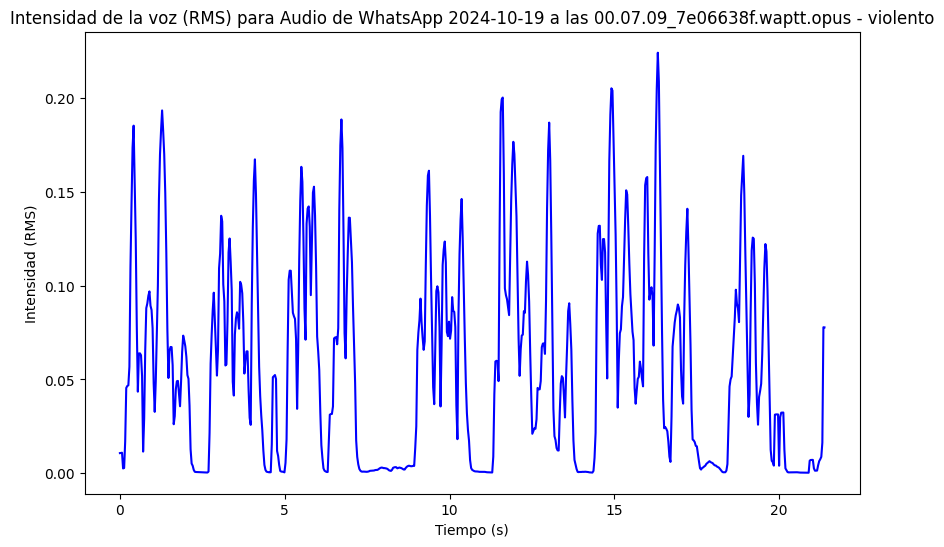

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.07.09_7e06638f.waptt.opus (violento): 0.05815419927239418
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.08.07_e7f234ab.waptt.opus (Categoría: violento)


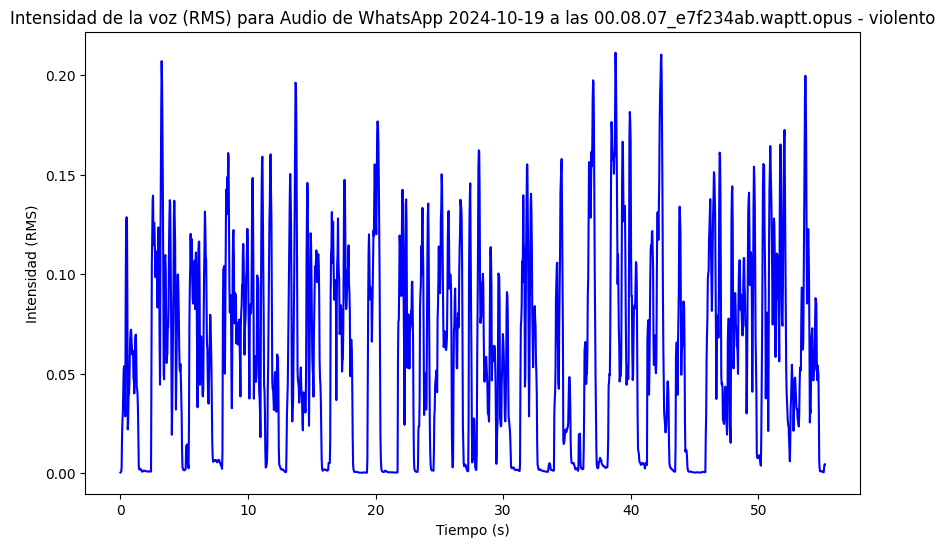

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.08.07_e7f234ab.waptt.opus (violento): 0.06071850284934044
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.08.26_83a17d95.waptt.opus (Categoría: violento)


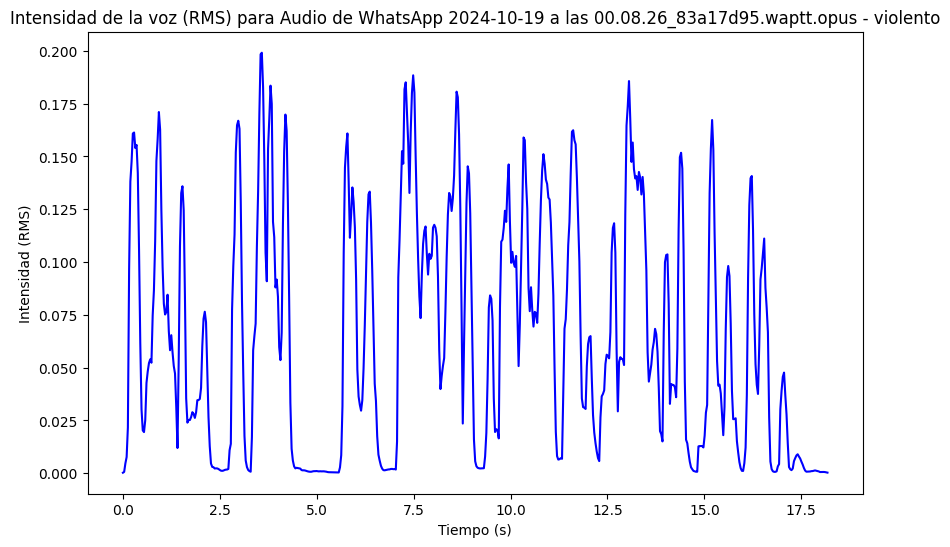

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.08.26_83a17d95.waptt.opus (violento): 0.06536858528852463
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.16.43_cc817032.waptt.opus (Categoría: violento)


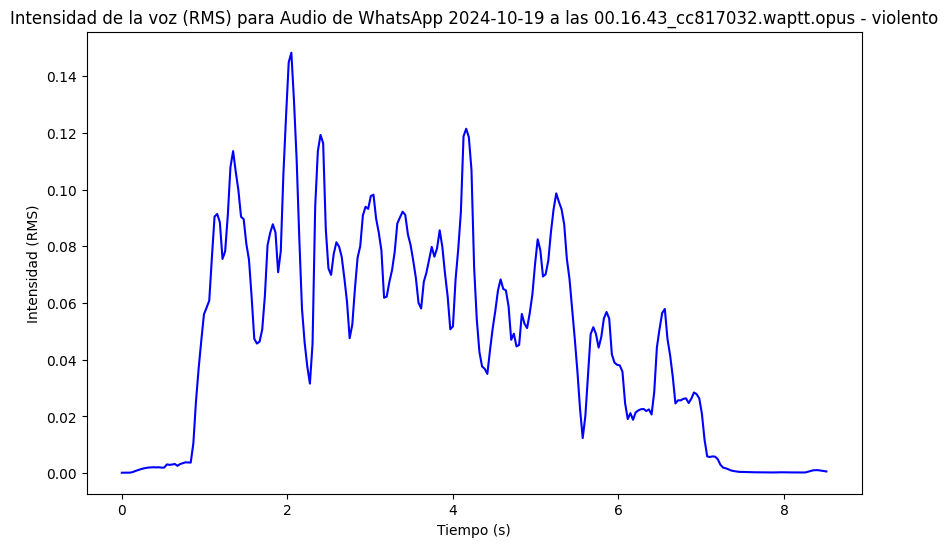

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.16.43_cc817032.waptt.opus (violento): 0.04706347733736038
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.18.35_aaa2f426.waptt.opus (Categoría: violento)


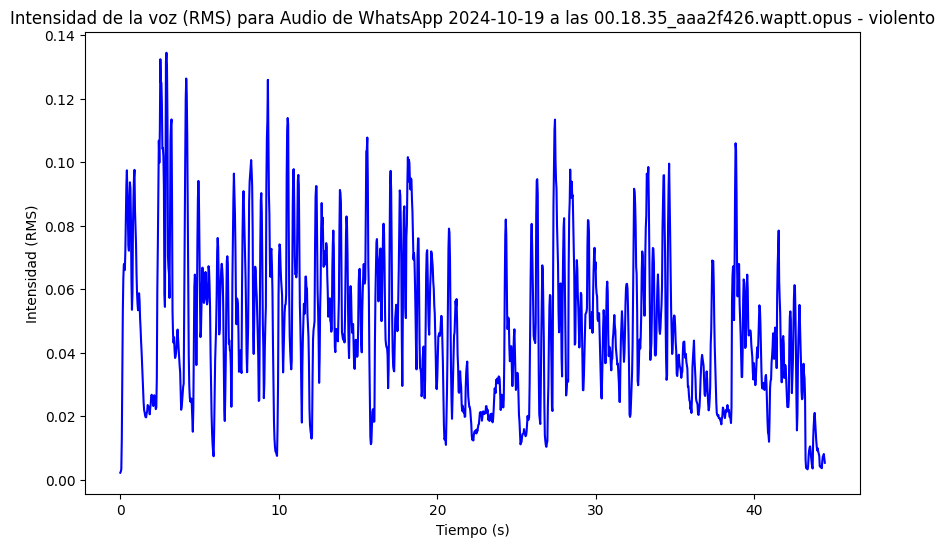

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.18.35_aaa2f426.waptt.opus (violento): 0.048270028084516525
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.24.55_f599f194.waptt.opus (Categoría: violento)


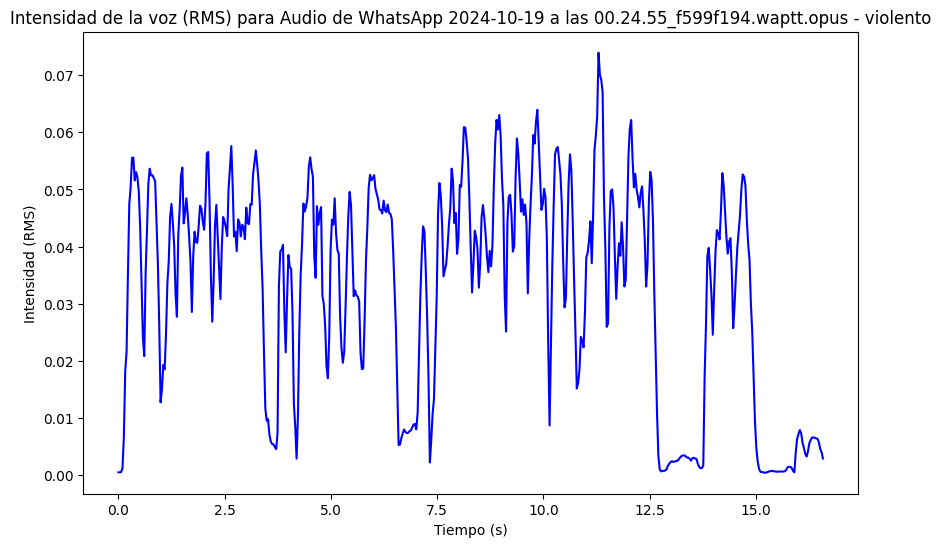

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.24.55_f599f194.waptt.opus (violento): 0.03280380368232727
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.25.14_388d763b.waptt.opus (Categoría: violento)


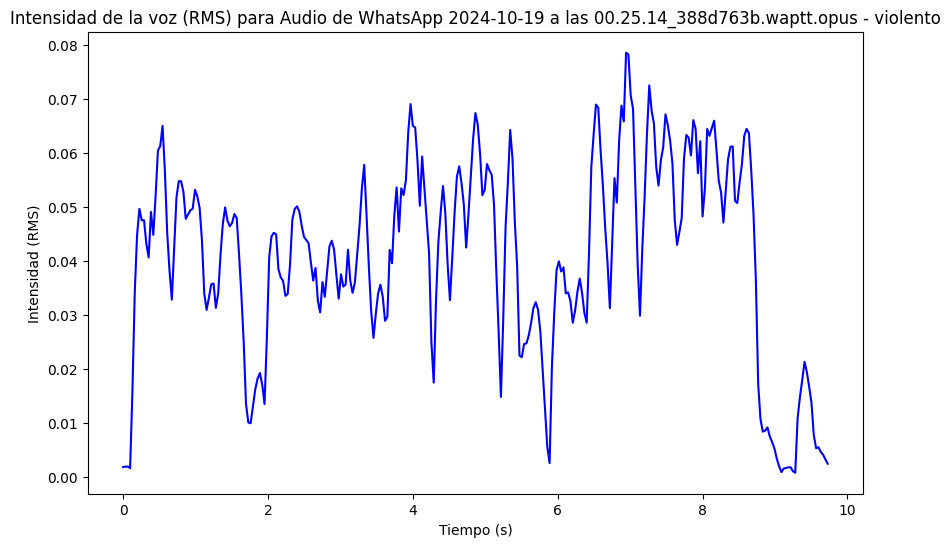

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.25.14_388d763b.waptt.opus (violento): 0.040724169462919235
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.25.21_6b03f590.waptt.opus (Categoría: violento)


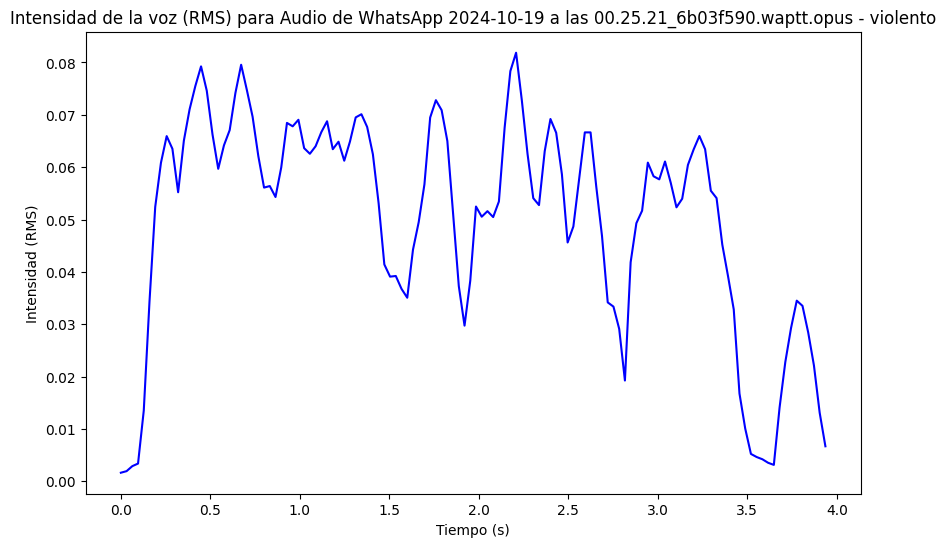

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.25.21_6b03f590.waptt.opus (violento): 0.05012688413262367
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 00.25.40_1f34d7b9.waptt.opus (Categoría: violento)


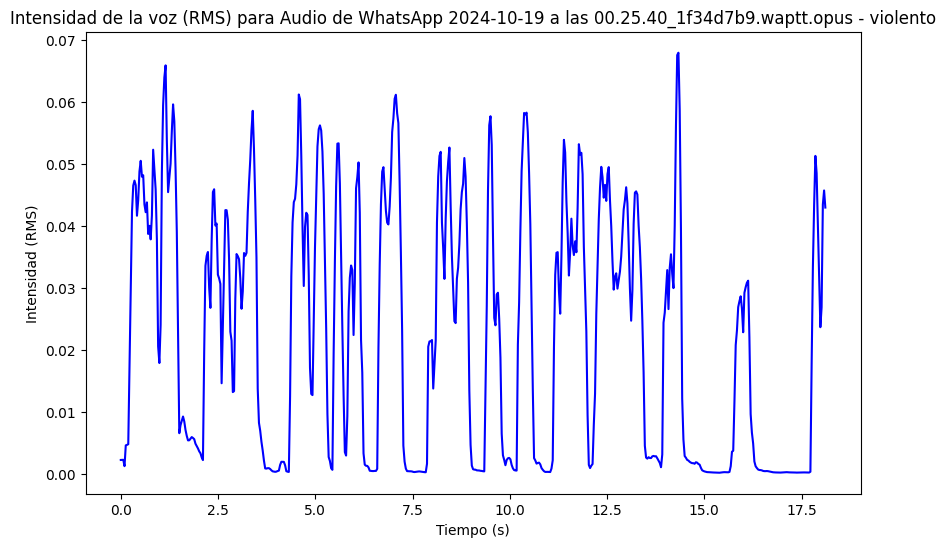

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 00.25.40_1f34d7b9.waptt.opus (violento): 0.02235732413828373
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.32_a9d168ee.opus (Categoría: violento)


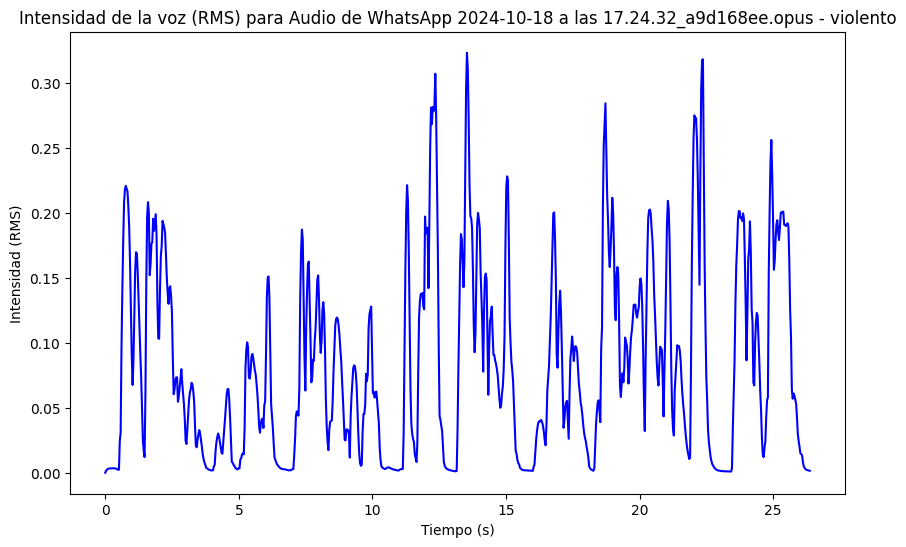

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.32_a9d168ee.opus (violento): 0.0845794826745987
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.32_2e489d5b.opus (Categoría: violento)


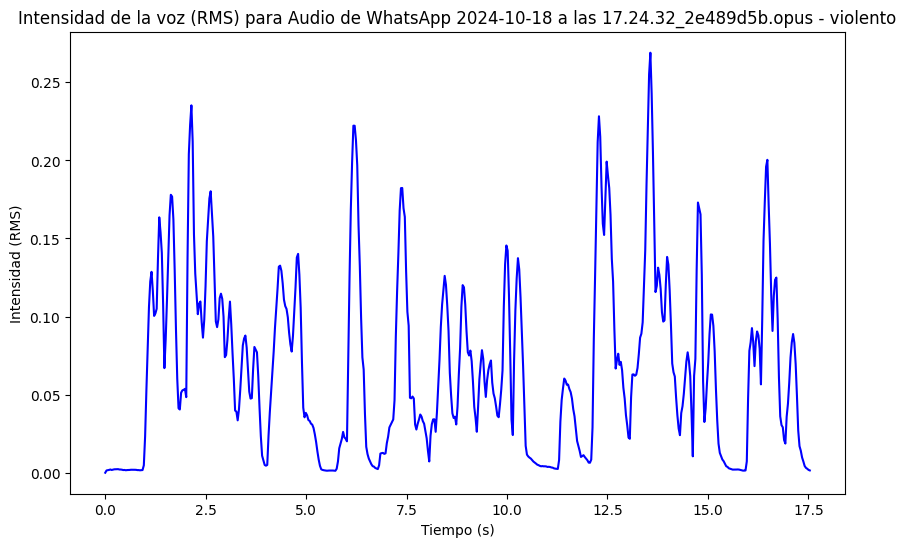

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.32_2e489d5b.opus (violento): 0.06706640124320984
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.33_2e078b27.opus (Categoría: violento)


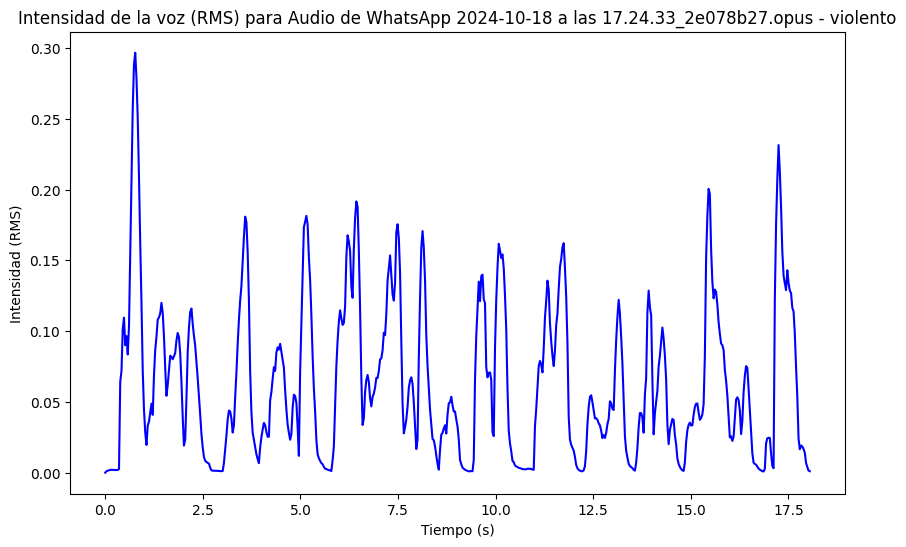

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.33_2e078b27.opus (violento): 0.06441454589366913
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.33_1e2fdfb5.opus (Categoría: violento)


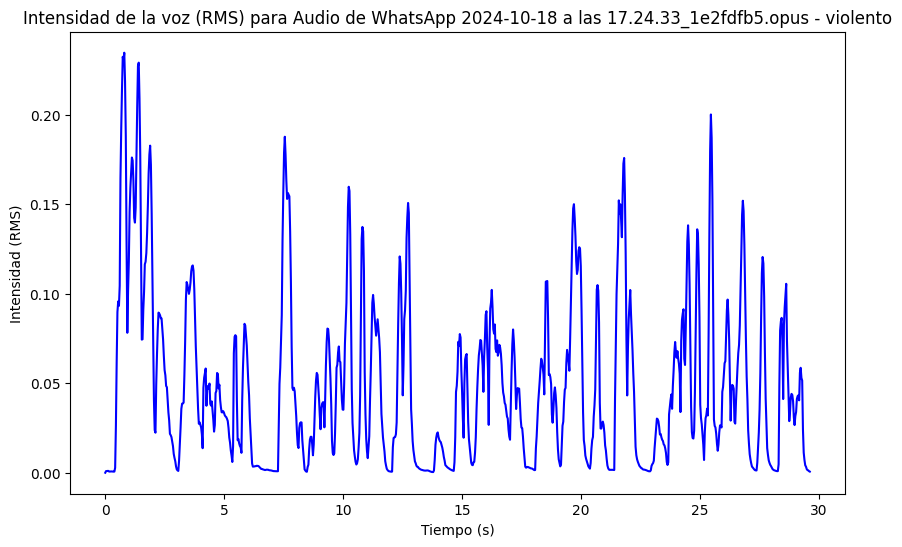

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.33_1e2fdfb5.opus (violento): 0.04990488663315773
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.33_b0c66749.opus (Categoría: violento)


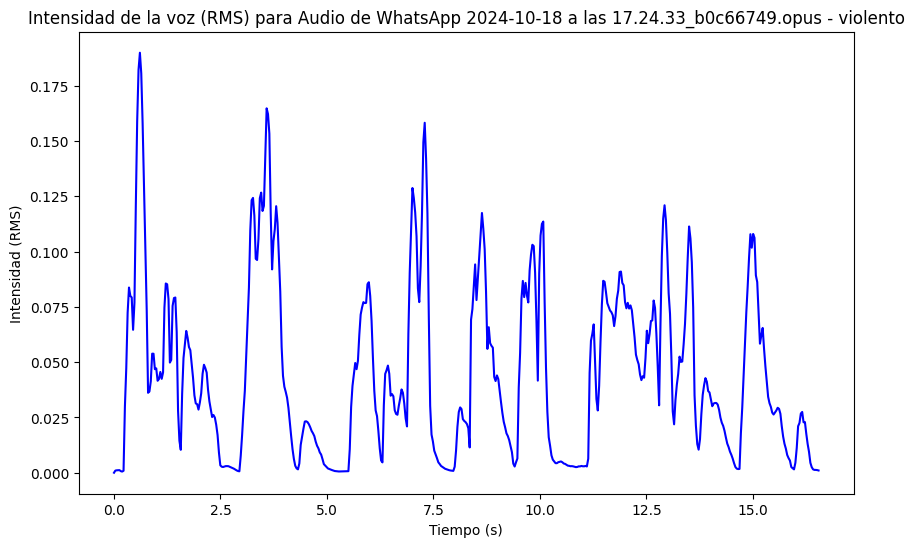

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.33_b0c66749.opus (violento): 0.04523928090929985
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.33_41a9b2cf.opus (Categoría: violento)


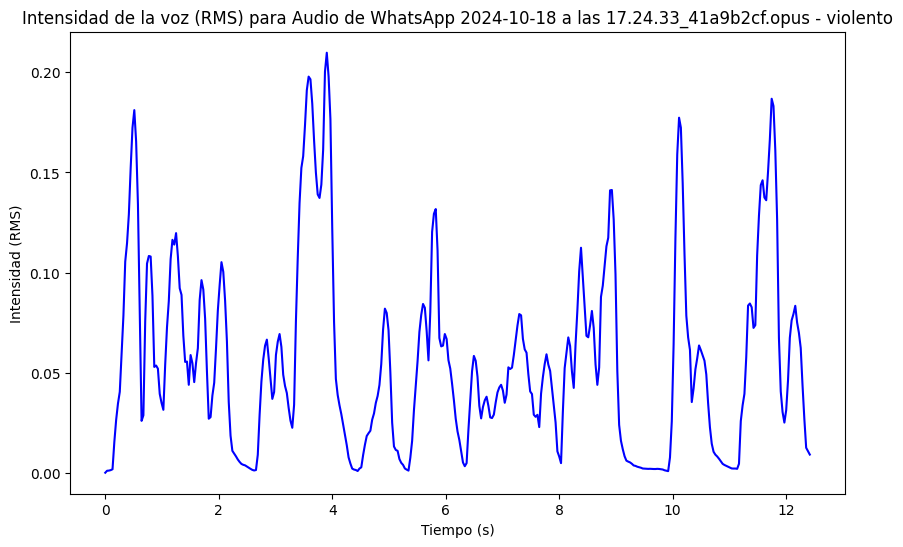

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.33_41a9b2cf.opus (violento): 0.05647119879722595
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.34_50fbfd7a.opus (Categoría: violento)


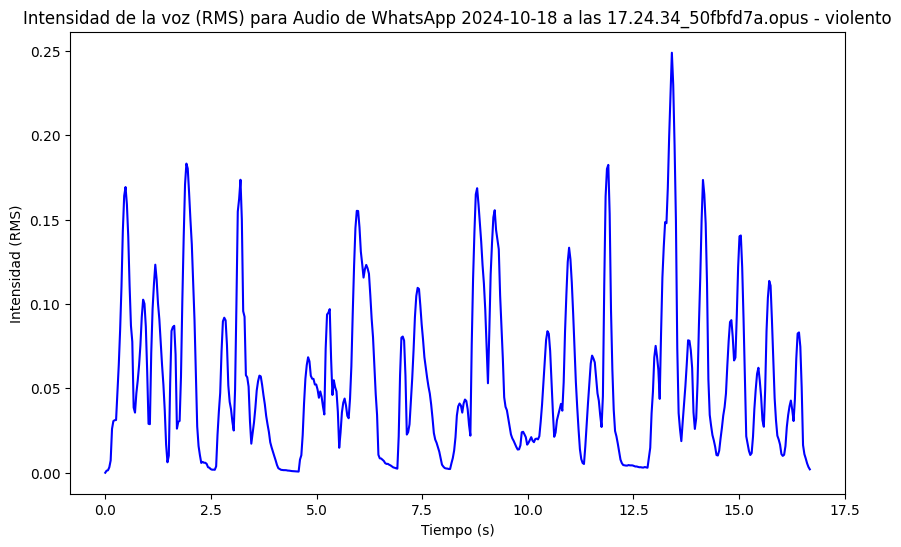

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.34_50fbfd7a.opus (violento): 0.05595231428742409
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.34_fc8feda0.opus (Categoría: violento)


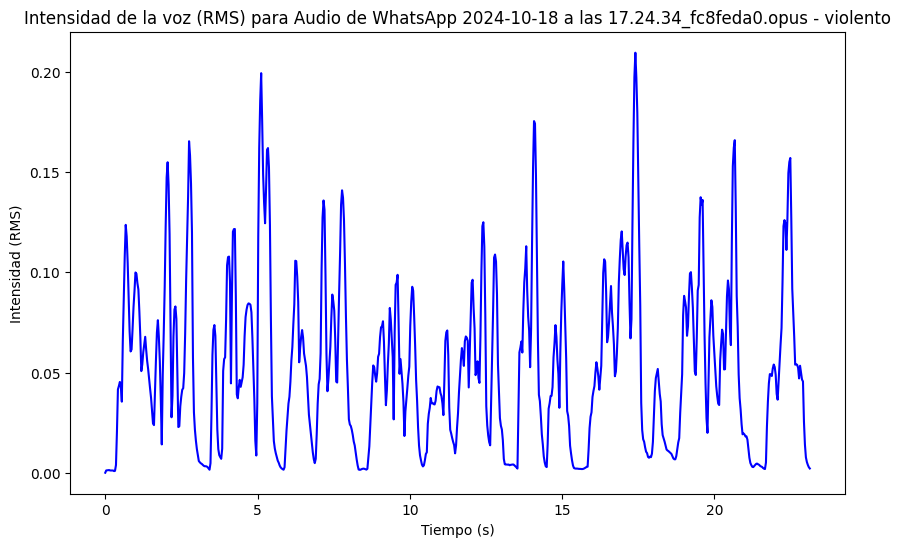

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.34_fc8feda0.opus (violento): 0.05385606363415718
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.34_8e37d9ef.opus (Categoría: violento)


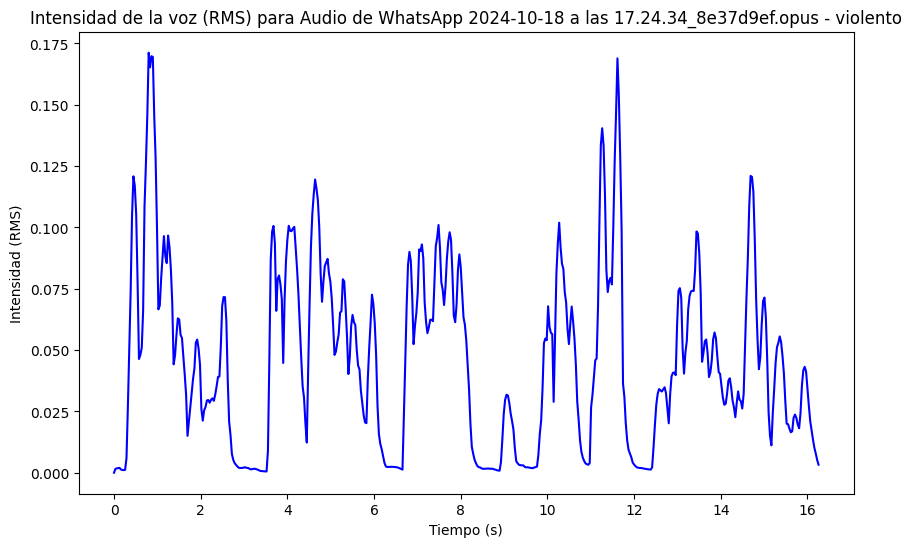

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.34_8e37d9ef.opus (violento): 0.0465056411921978
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.34_37d5a975.opus (Categoría: violento)


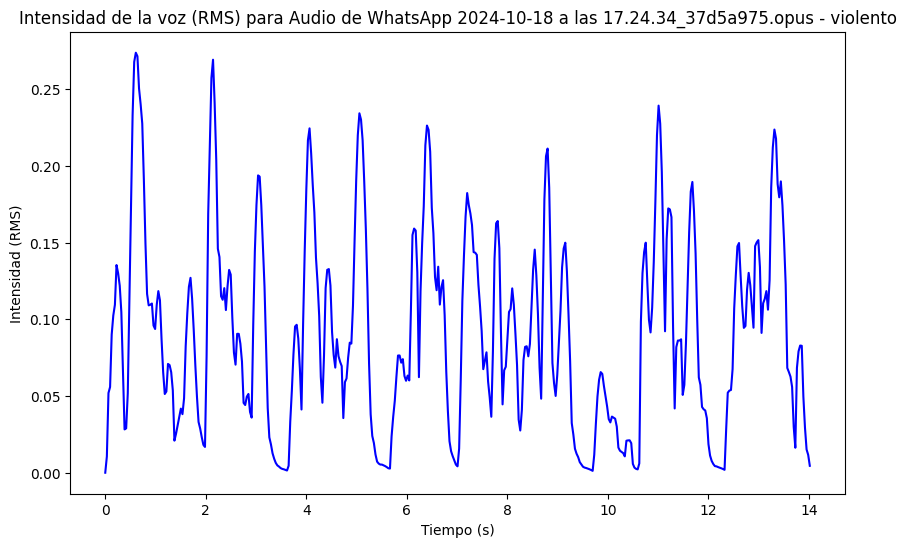

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.34_37d5a975.opus (violento): 0.0914832204580307
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.35_8bdda1ae.opus (Categoría: violento)


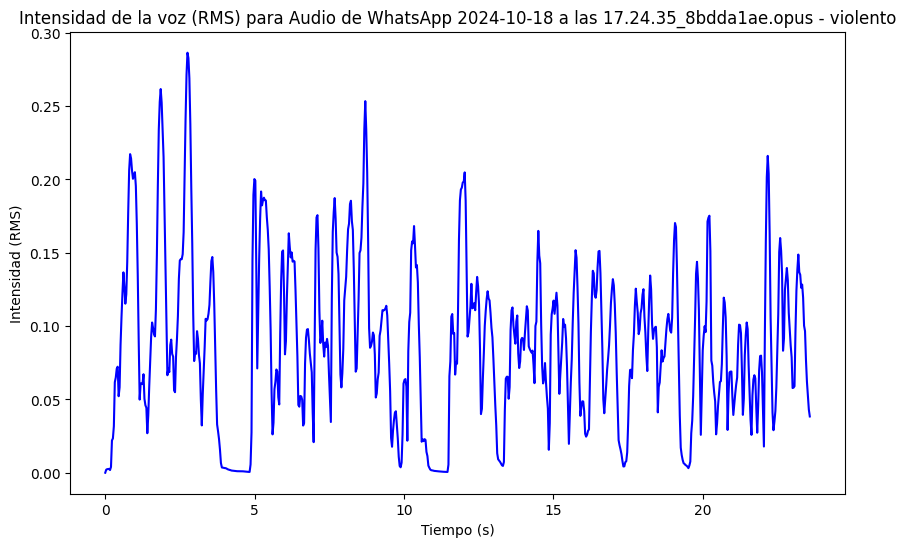

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.35_8bdda1ae.opus (violento): 0.08837509900331497
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.35_110ff227.opus (Categoría: violento)


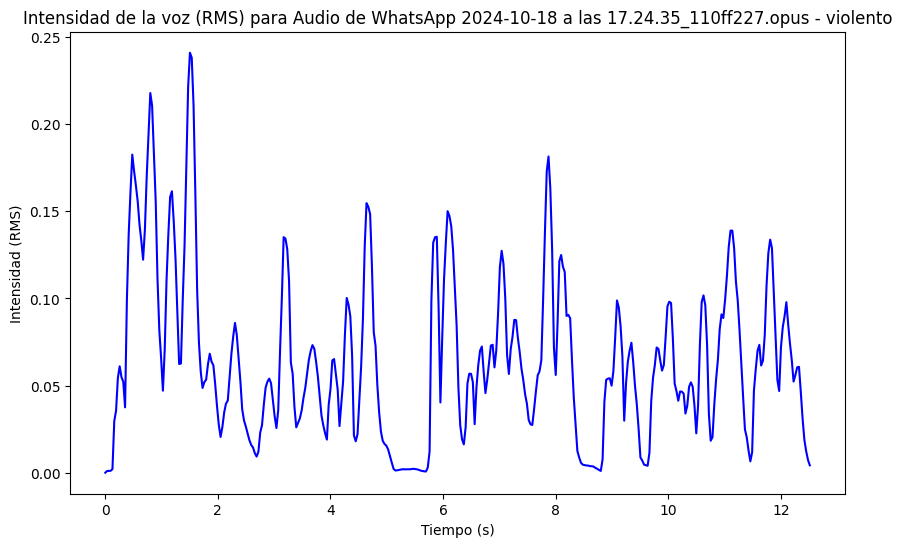

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.35_110ff227.opus (violento): 0.06517130881547928
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-18 a las 17.24.35_6764fb57.opus (Categoría: violento)


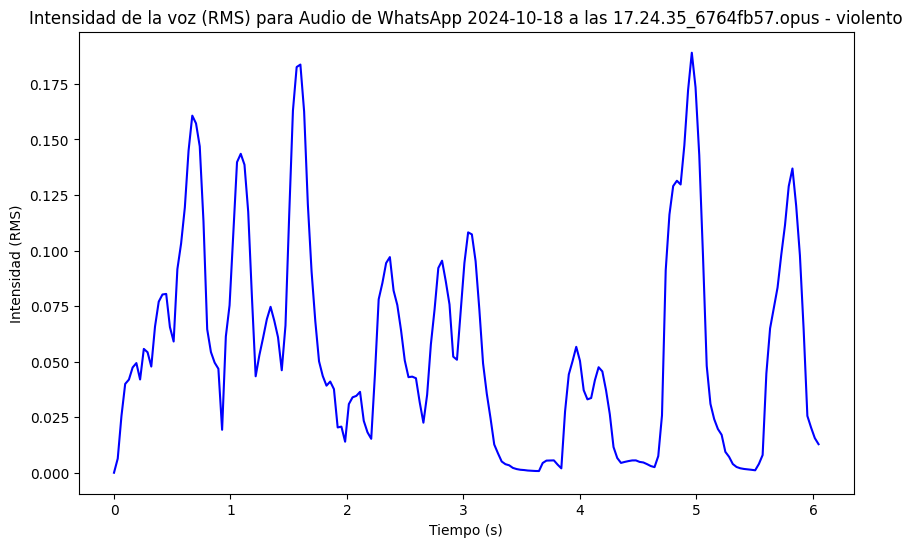

Intensidad promedio para Audio de WhatsApp 2024-10-18 a las 17.24.35_6764fb57.opus (violento): 0.056291691958904266
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-19 a las 12.30.46_a30ad7cb.waptt.opus (Categoría: violento)


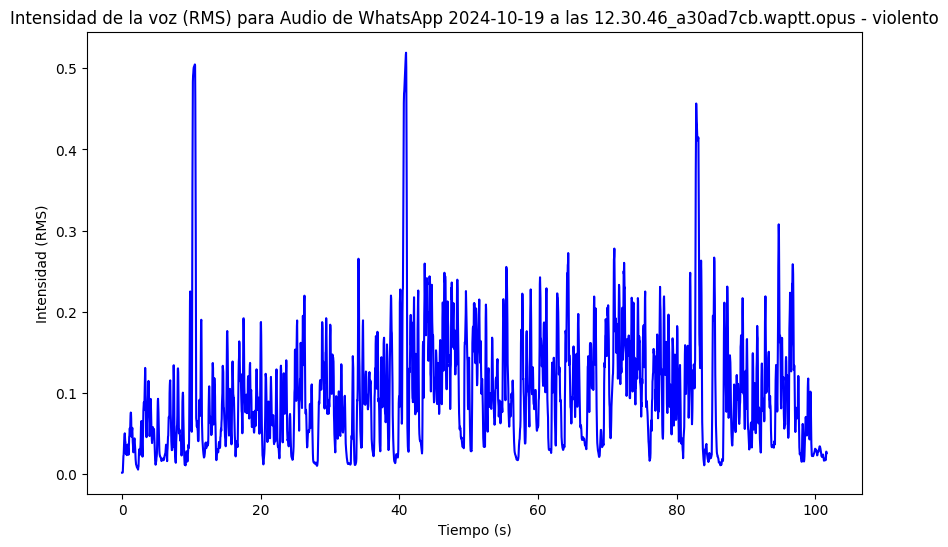

Intensidad promedio para Audio de WhatsApp 2024-10-19 a las 12.30.46_a30ad7cb.waptt.opus (violento): 0.10055074095726013


In [ ]:
def analizar_intensidad(ruta_audio, categoria):
    y, sr = librosa.load(ruta_audio, sr=None)

    rms = librosa.feature.rms(y=y)[0]

    tiempos = librosa.times_like(rms, sr=sr)

    plt.figure(figsize=(10, 6))
    plt.plot(tiempos, rms, color='b')
    plt.title(f'Intensidad de la voz (RMS) para {os.path.basename(ruta_audio)} - {categoria}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Intensidad (RMS)')
    plt.show()

    intensidad_promedio = np.mean(rms)
    print(f"Intensidad promedio para {os.path.basename(ruta_audio)} ({categoria}): {intensidad_promedio}")

    return intensidad_promedio

directorio_audio =  '/content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento'

for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.wav') or file.endswith('.opus'):
            ruta_audio = os.path.join(root, file)

            categoria = 'violento'

            print(f"Analizando: {ruta_audio} (Categoría: {categoria})")
            intensidad = analizar_intensidad(ruta_audio, categoria)

Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.44.45_794804b9.wav.opus (Categoría: No violento)


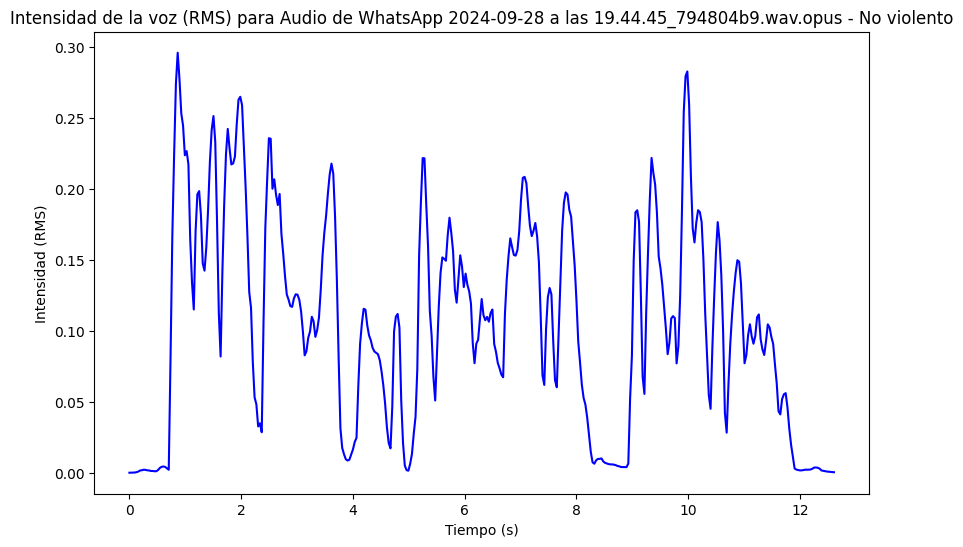

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.44.45_794804b9.wav.opus (No violento): 0.10579776018857956
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.42.01_b0842299.wav.opus (Categoría: No violento)


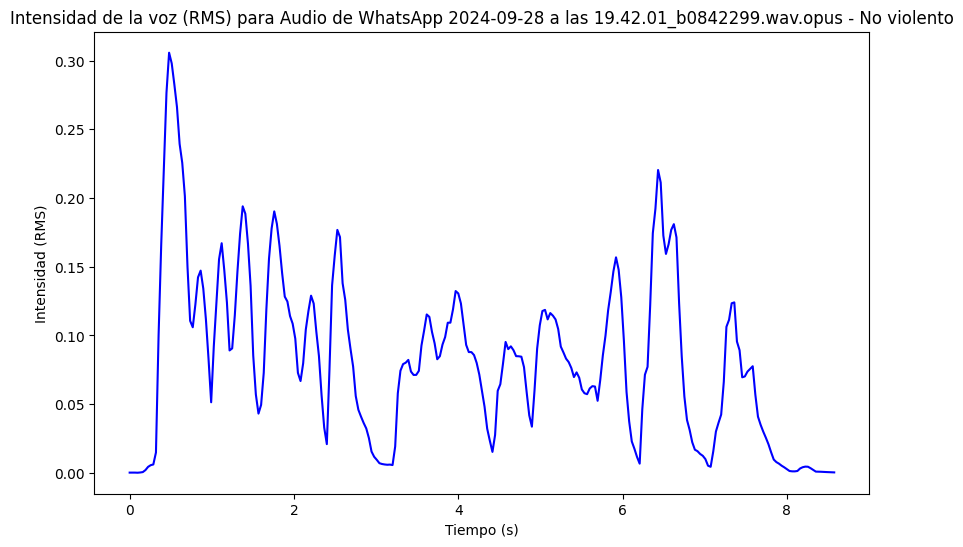

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.42.01_b0842299.wav.opus (No violento): 0.08260166645050049
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.41.50_a42b47a8.wav.opus (Categoría: No violento)


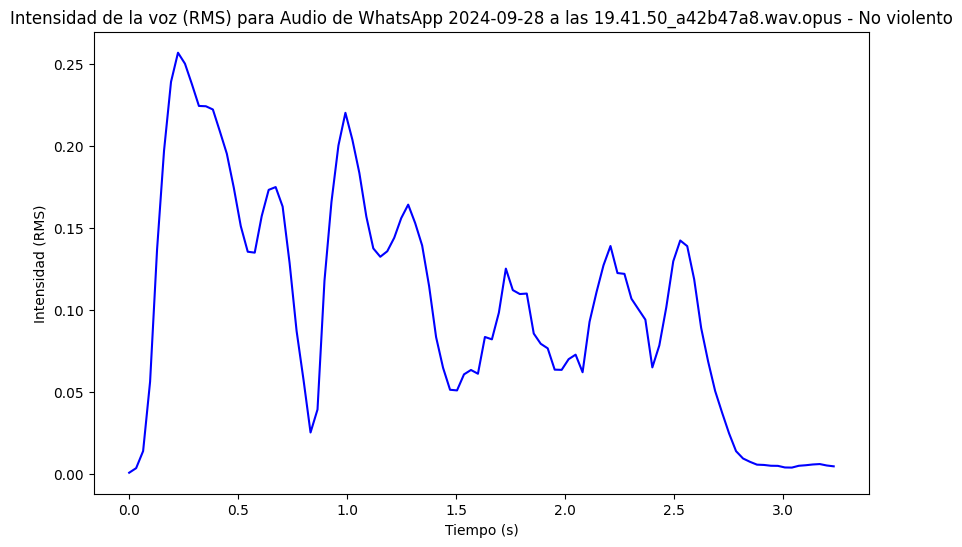

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.41.50_a42b47a8.wav.opus (No violento): 0.10279069095849991
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.42.46_23bb57c8.wav.opus (Categoría: No violento)


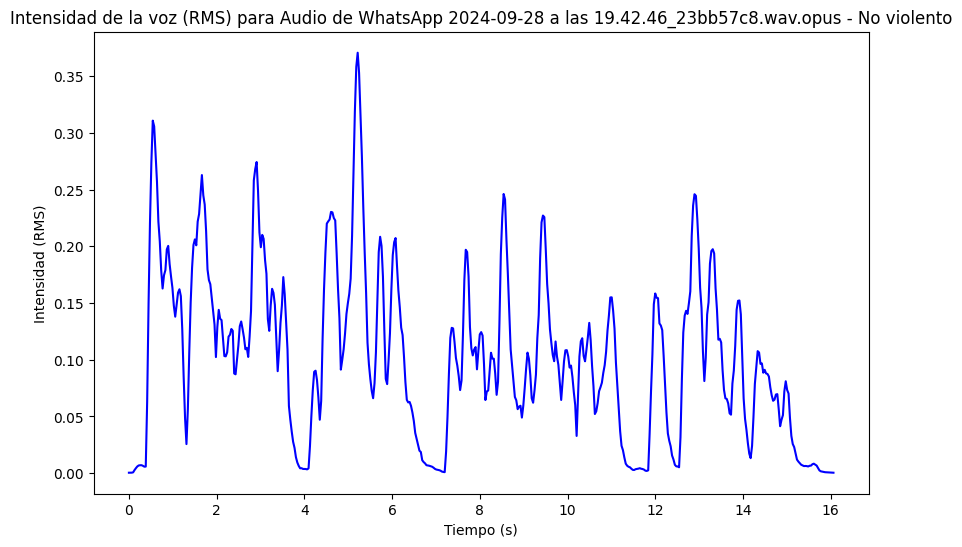

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.42.46_23bb57c8.wav.opus (No violento): 0.10343664884567261
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.43.00_ede74938.wav.opus (Categoría: No violento)


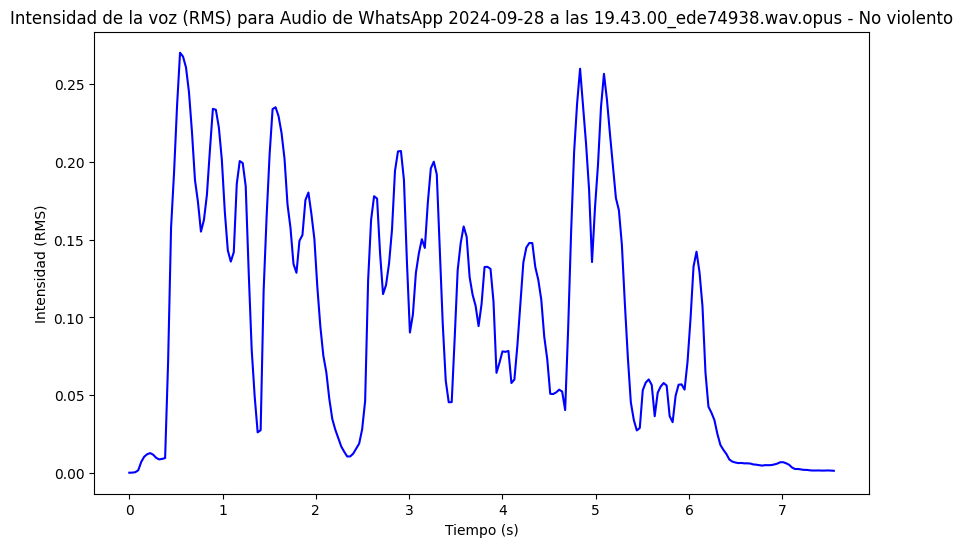

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.43.00_ede74938.wav.opus (No violento): 0.09848982095718384
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.43.26_3e99c2c0.wav.opus (Categoría: No violento)


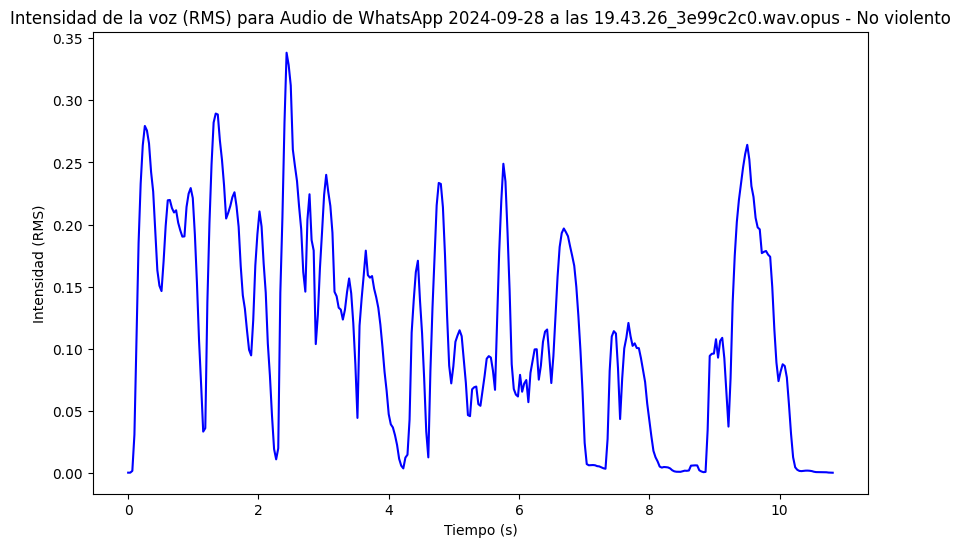

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.43.26_3e99c2c0.wav.opus (No violento): 0.1155187338590622
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.43.41_74741d58.wav.opus (Categoría: No violento)


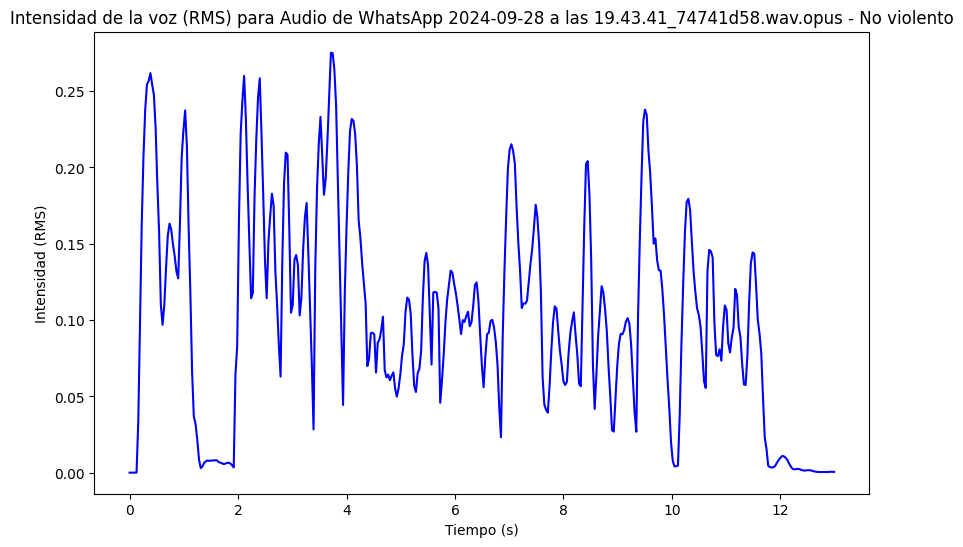

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.43.41_74741d58.wav.opus (No violento): 0.10265728831291199
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.44.16_2f90fd89.wav.opus (Categoría: No violento)


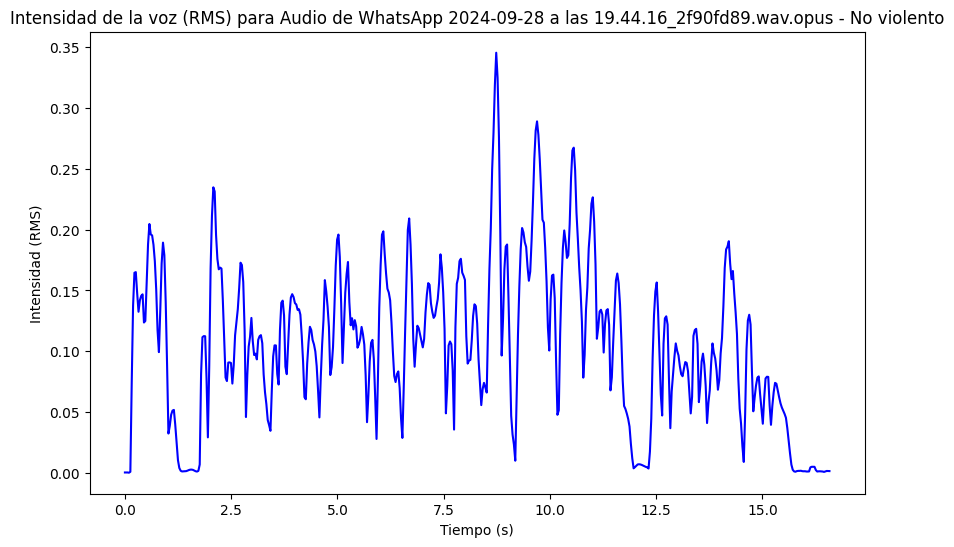

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.44.16_2f90fd89.wav.opus (No violento): 0.10583516955375671
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.44.38_8d58e7f5.wav.opus (Categoría: No violento)


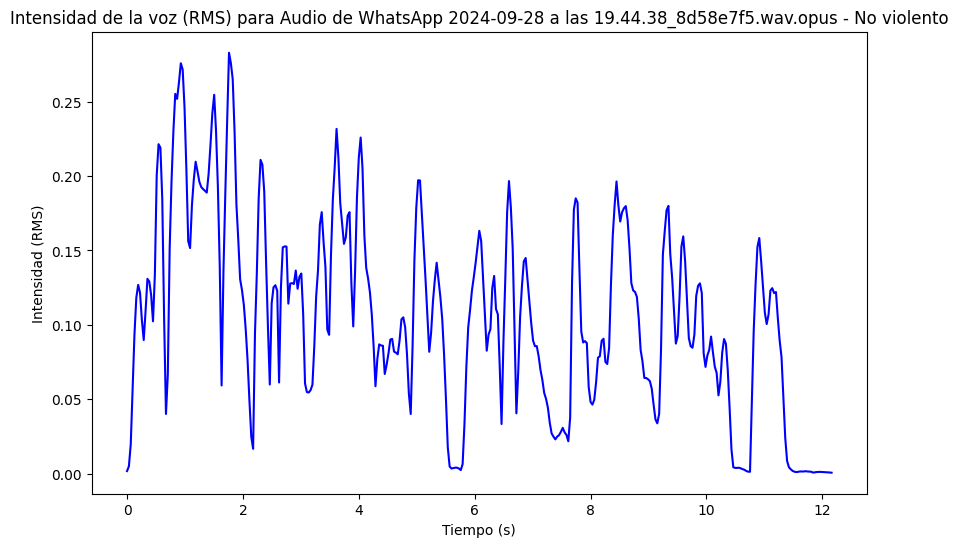

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.44.38_8d58e7f5.wav.opus (No violento): 0.10624893754720688
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.44.51_01550447.wav.opus (Categoría: No violento)


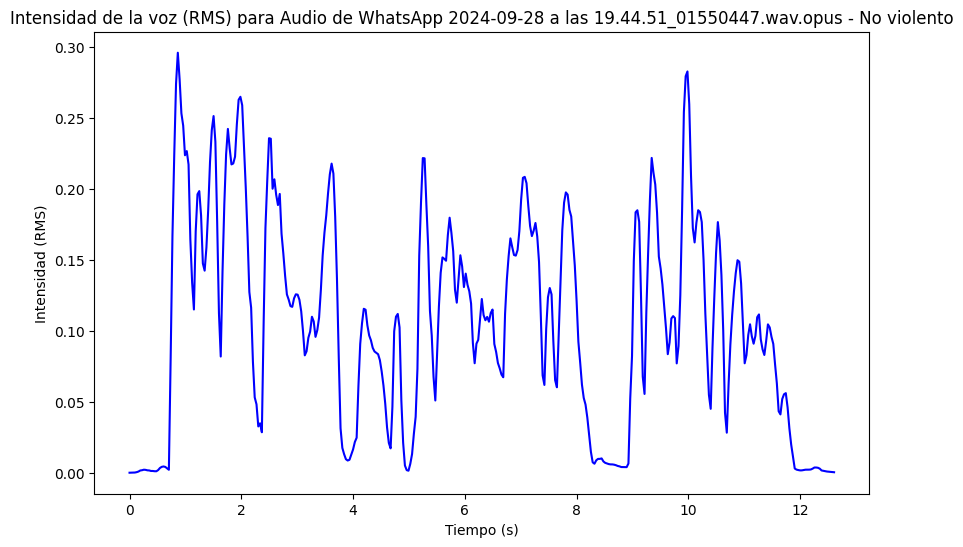

Intensidad promedio para Audio de WhatsApp 2024-09-28 a las 19.44.51_01550447.wav.opus (No violento): 0.10579776018857956
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-08 a las olga 2.opus (Categoría: No violento)


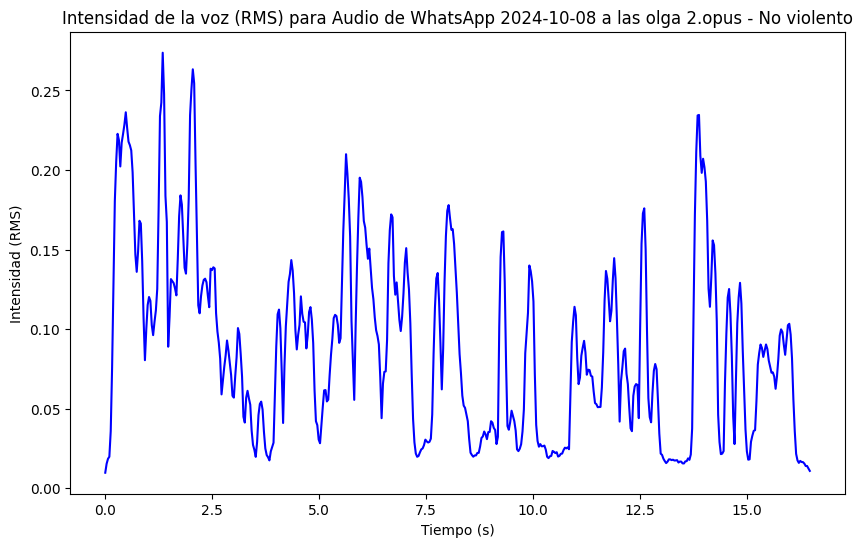

Intensidad promedio para Audio de WhatsApp 2024-10-08 a las olga 2.opus (No violento): 0.08891798555850983
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-08 a las olga 3.opus (Categoría: No violento)


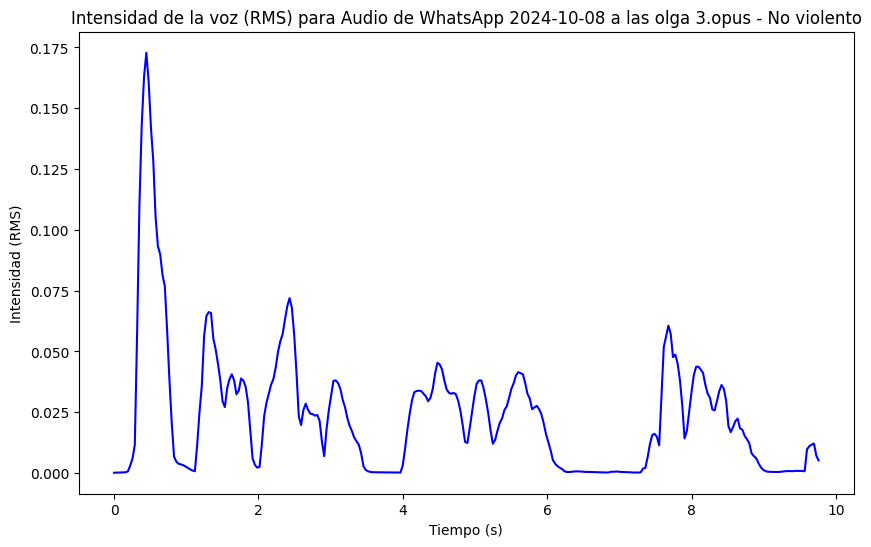

Intensidad promedio para Audio de WhatsApp 2024-10-08 a las olga 3.opus (No violento): 0.02408614009618759
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-06 a las olga4.opus (Categoría: No violento)


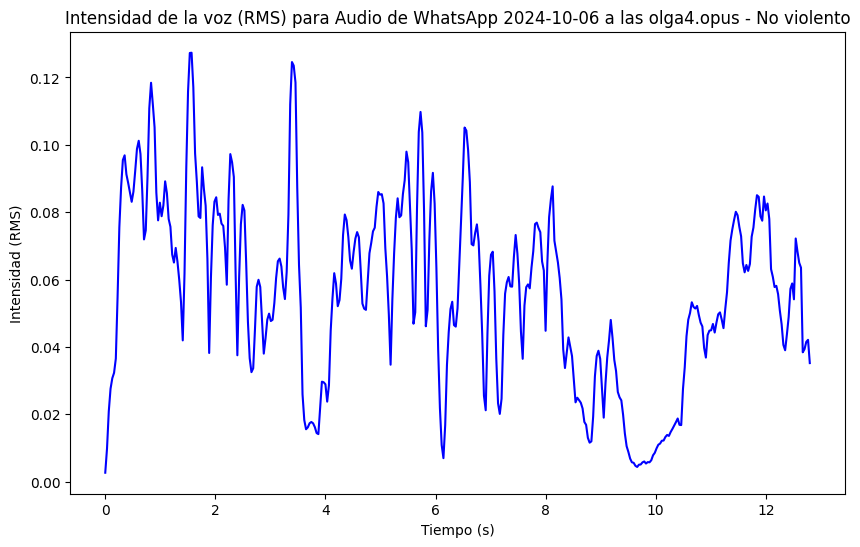

Intensidad promedio para Audio de WhatsApp 2024-10-06 a las olga4.opus (No violento): 0.05619753897190094
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-06 a las olga 5.opus (Categoría: No violento)


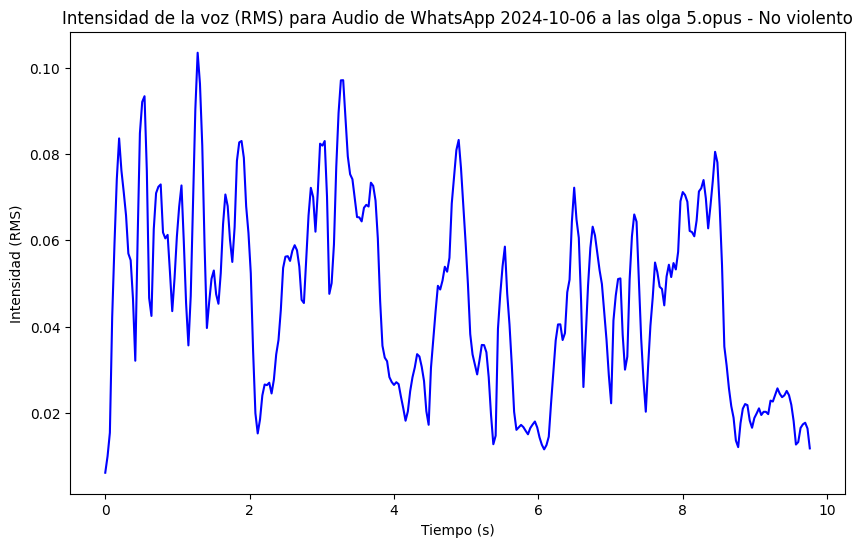

Intensidad promedio para Audio de WhatsApp 2024-10-06 a las olga 5.opus (No violento): 0.04672360420227051
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-06 a las olga 6.opus (Categoría: No violento)


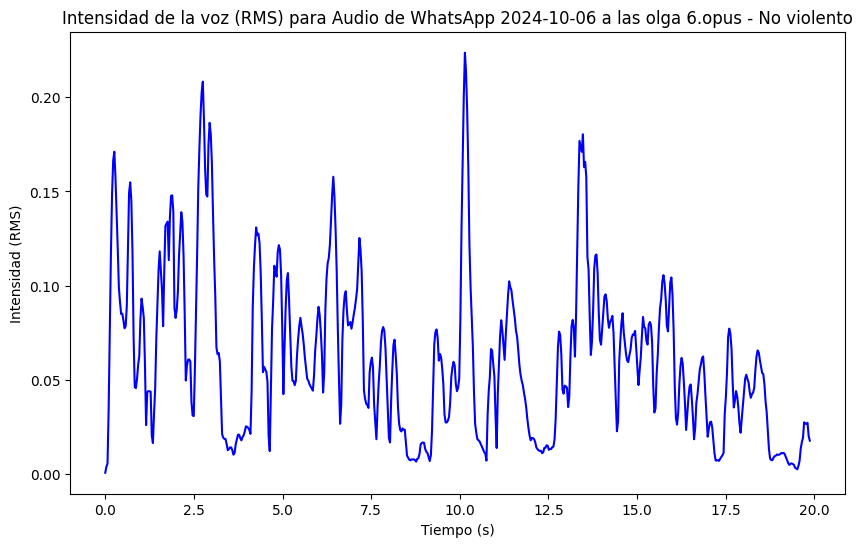

Intensidad promedio para Audio de WhatsApp 2024-10-06 a las olga 6.opus (No violento): 0.06219460442662239
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-06 a las olga 7.opus (Categoría: No violento)


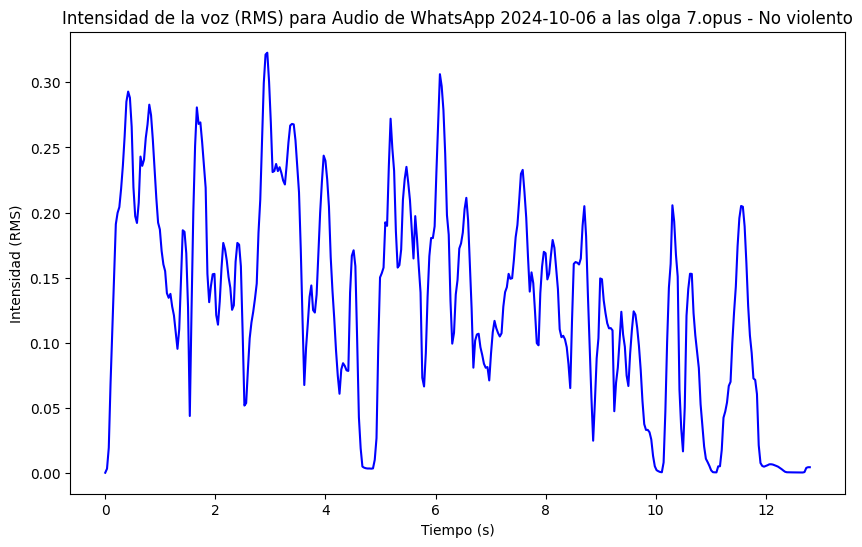

Intensidad promedio para Audio de WhatsApp 2024-10-06 a las olga 7.opus (No violento): 0.1309882253408432
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-06 a las olga 8.opus (Categoría: No violento)


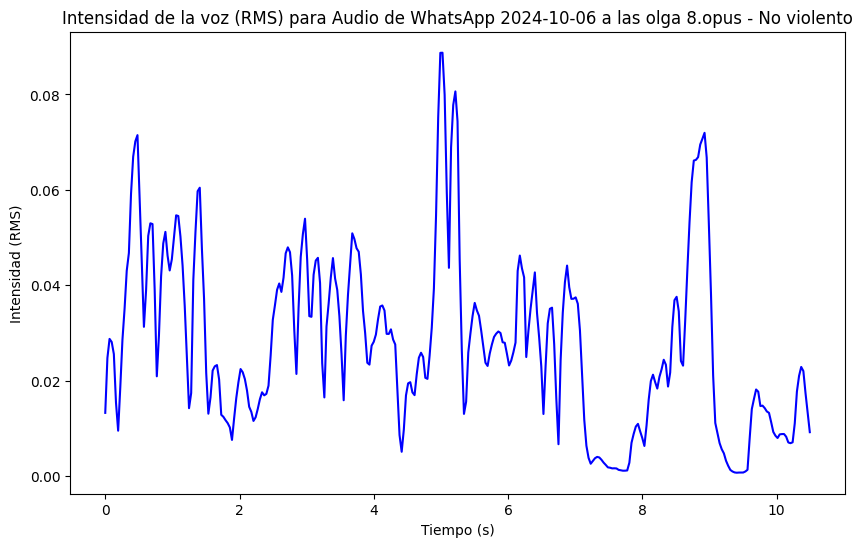

Intensidad promedio para Audio de WhatsApp 2024-10-06 a las olga 8.opus (No violento): 0.028061803430318832
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-06 a las olga 9.opus (Categoría: No violento)


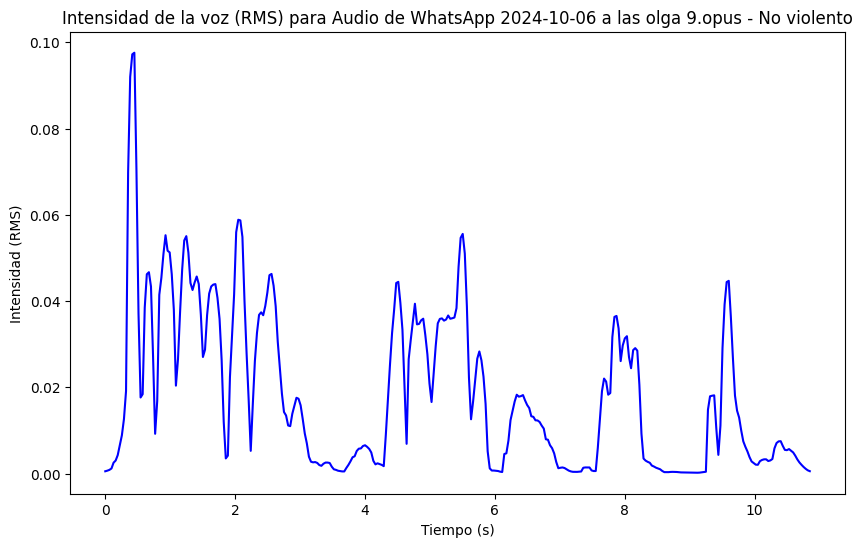

Intensidad promedio para Audio de WhatsApp 2024-10-06 a las olga 9.opus (No violento): 0.018347930163145065
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-06 a las olga 10.opus (Categoría: No violento)


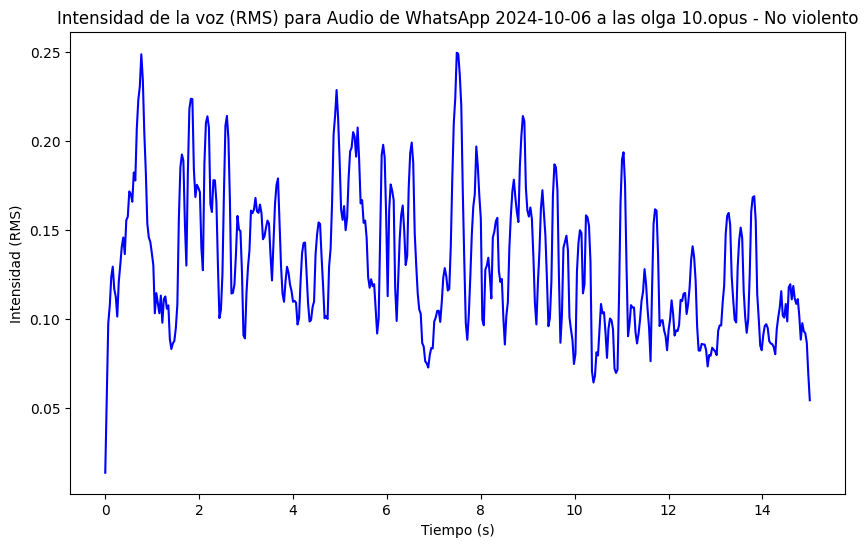

Intensidad promedio para Audio de WhatsApp 2024-10-06 a las olga 10.opus (No violento): 0.1321917623281479
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-05 a las olga 11.opus (Categoría: No violento)


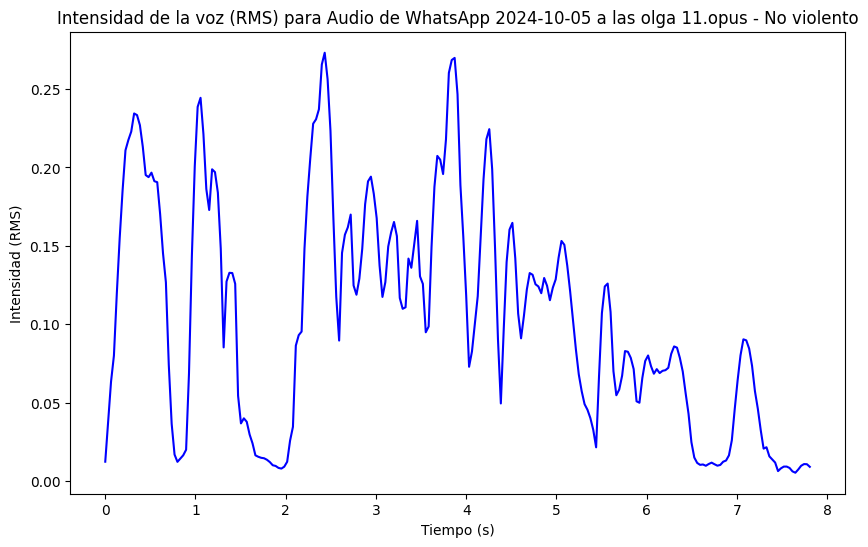

Intensidad promedio para Audio de WhatsApp 2024-10-05 a las olga 11.opus (No violento): 0.10522668063640594
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-05 a las olga 12.opus (Categoría: No violento)


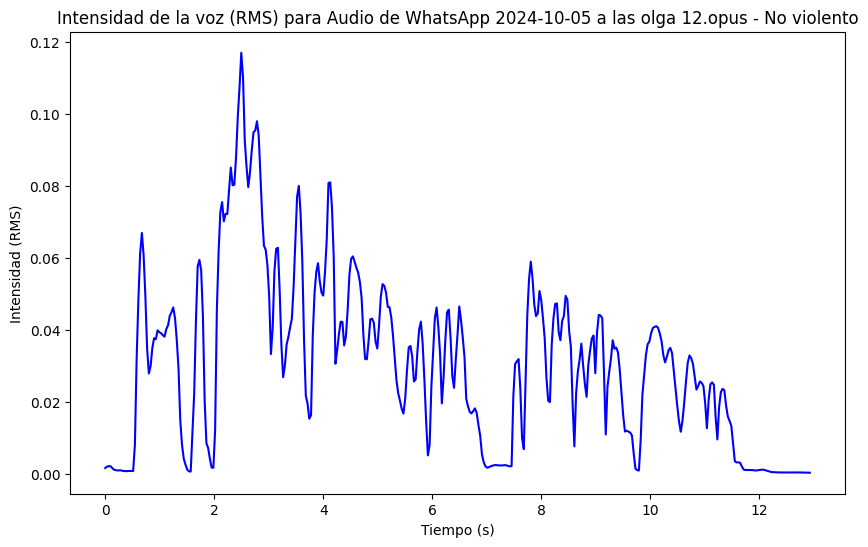

Intensidad promedio para Audio de WhatsApp 2024-10-05 a las olga 12.opus (No violento): 0.030691202729940414
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-04 a las olga 14.opus (Categoría: No violento)


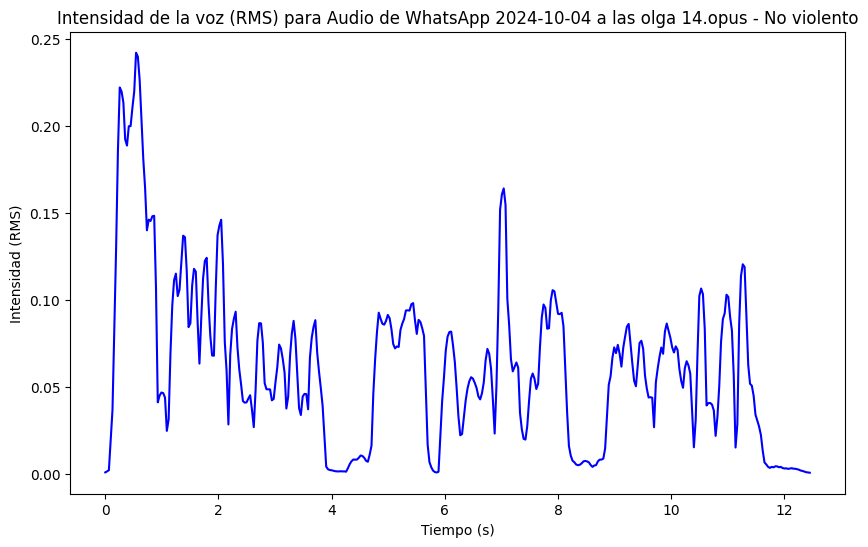

Intensidad promedio para Audio de WhatsApp 2024-10-04 a las olga 14.opus (No violento): 0.06212553754448891
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-03 a las olga 15.opus (Categoría: No violento)


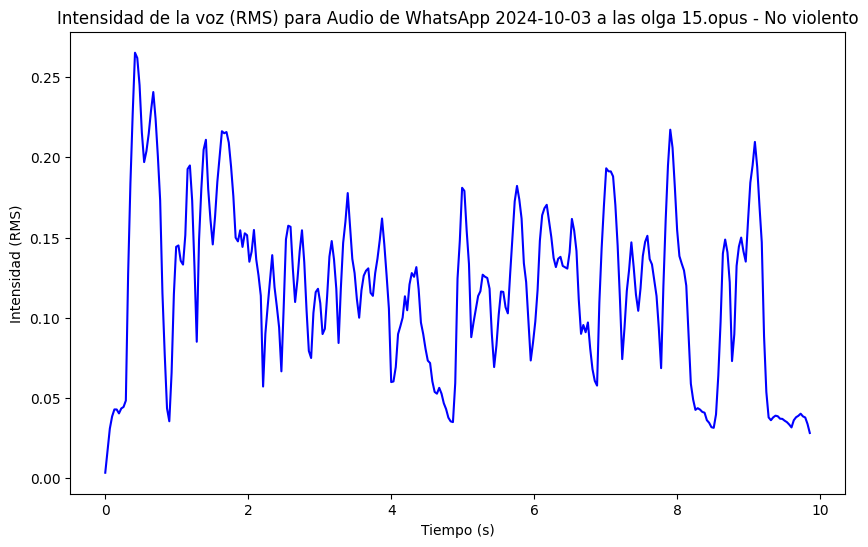

Intensidad promedio para Audio de WhatsApp 2024-10-03 a las olga 15.opus (No violento): 0.11880731582641602
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-30 a las olga 13.opus (Categoría: No violento)


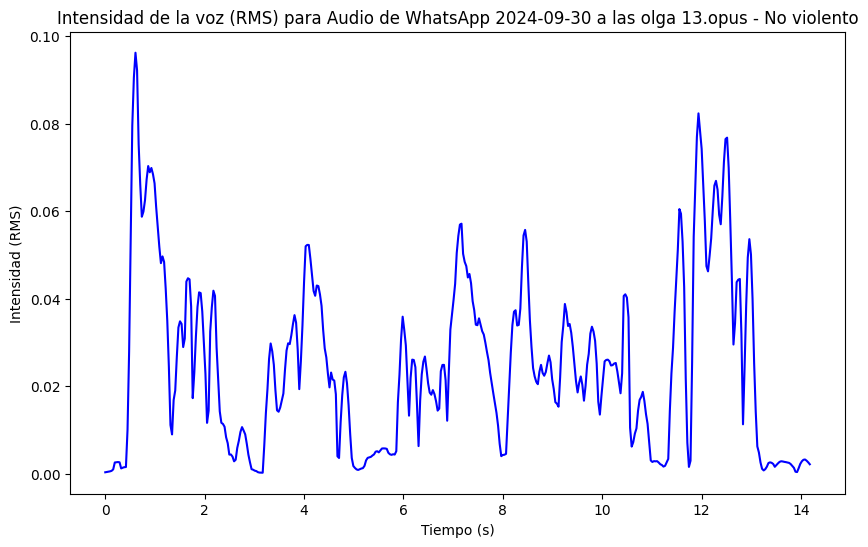

Intensidad promedio para Audio de WhatsApp 2024-09-30 a las olga 13.opus (No violento): 0.025112535804510117
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-07 a las alfredo 1.opus (Categoría: No violento)


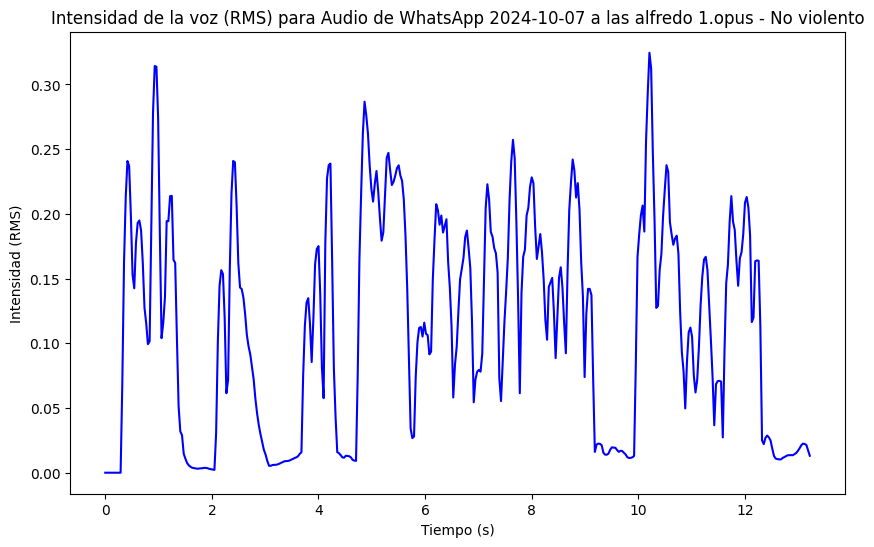

Intensidad promedio para Audio de WhatsApp 2024-10-07 a las alfredo 1.opus (No violento): 0.11413903534412384
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-07 a las alfredo 2.opus (Categoría: No violento)


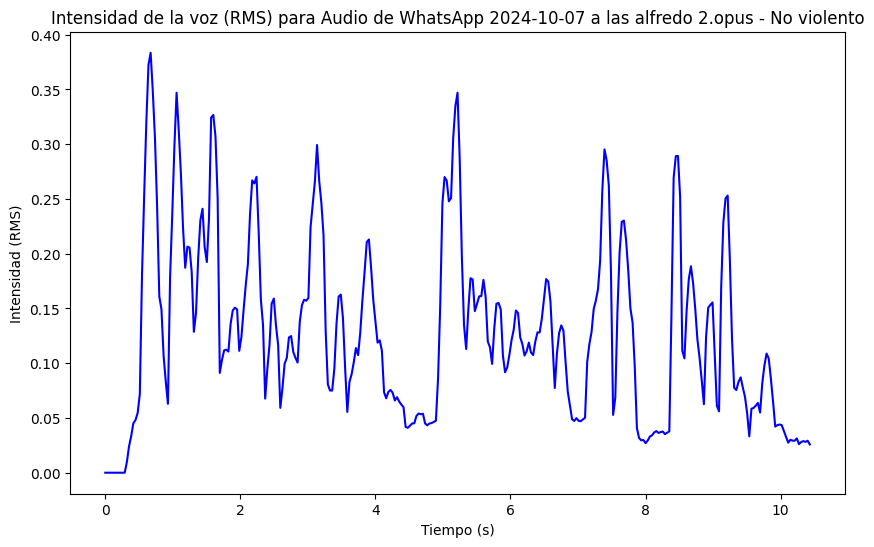

Intensidad promedio para Audio de WhatsApp 2024-10-07 a las alfredo 2.opus (No violento): 0.1291724443435669
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-09 a las alfredo 3.opus (Categoría: No violento)


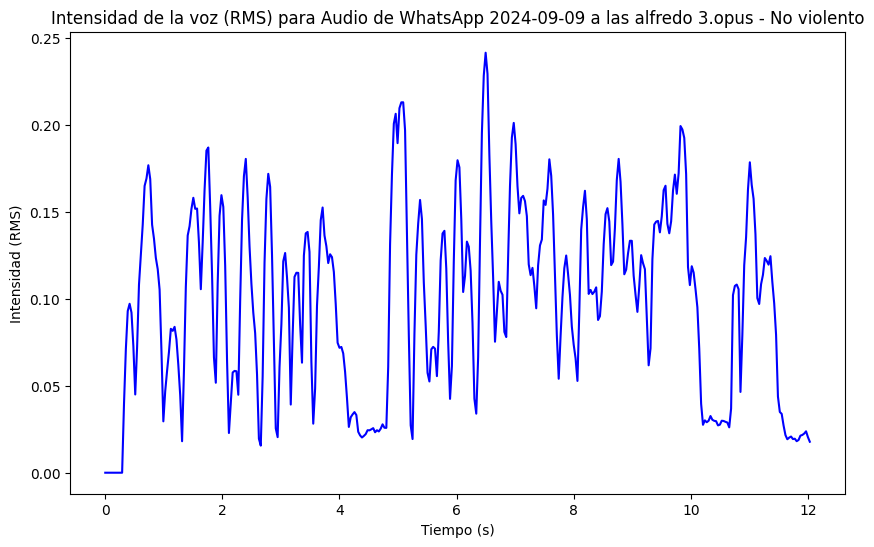

Intensidad promedio para Audio de WhatsApp 2024-09-09 a las alfredo 3.opus (No violento): 0.09980867058038712
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-05 a las alfredo 4.opus (Categoría: No violento)


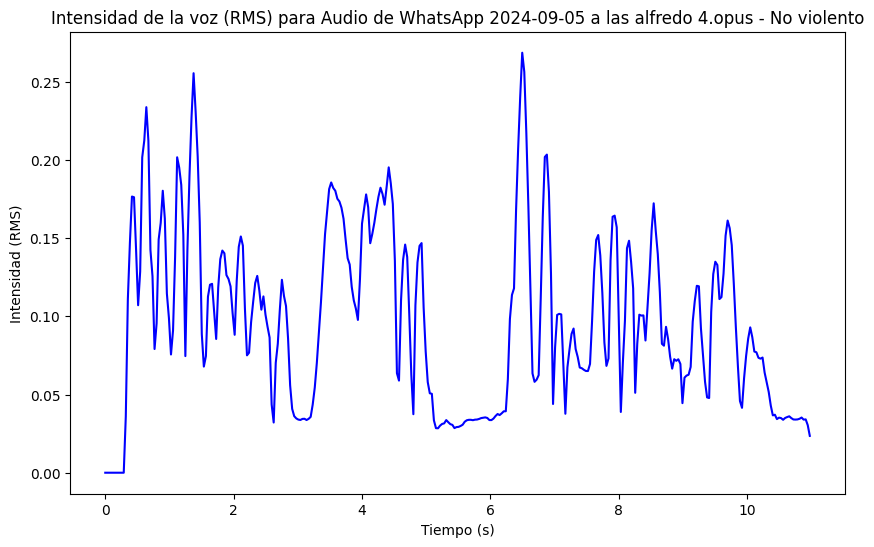

Intensidad promedio para Audio de WhatsApp 2024-09-05 a las alfredo 4.opus (No violento): 0.09764602780342102
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-03 a las alfredo 1.opus (Categoría: No violento)


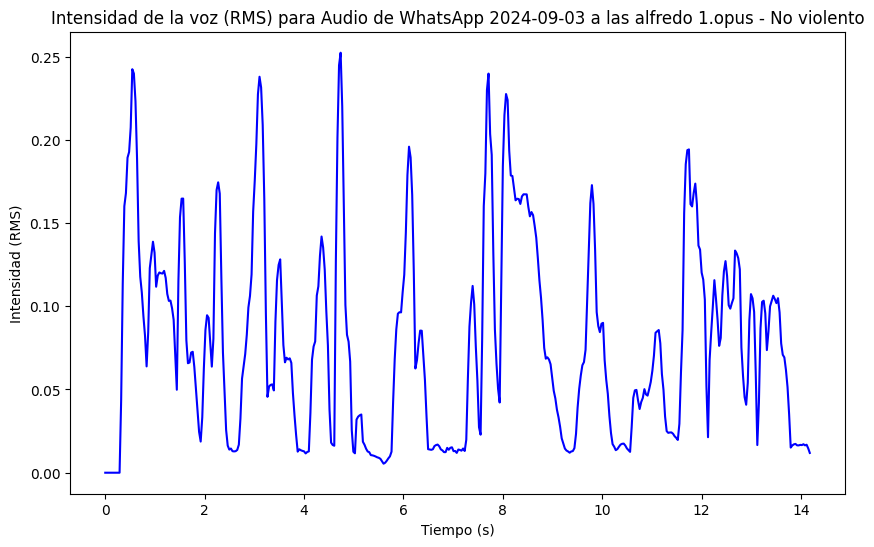

Intensidad promedio para Audio de WhatsApp 2024-09-03 a las alfredo 1.opus (No violento): 0.07912333309650421
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-30 a las alfredo 6.opus (Categoría: No violento)


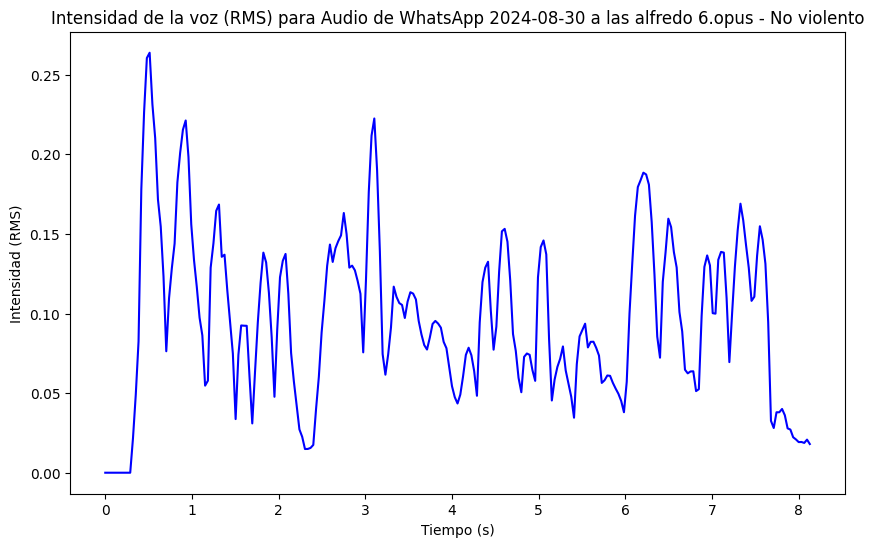

Intensidad promedio para Audio de WhatsApp 2024-08-30 a las alfredo 6.opus (No violento): 0.09705895930528641
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-14 a las alfredo 7.opus (Categoría: No violento)


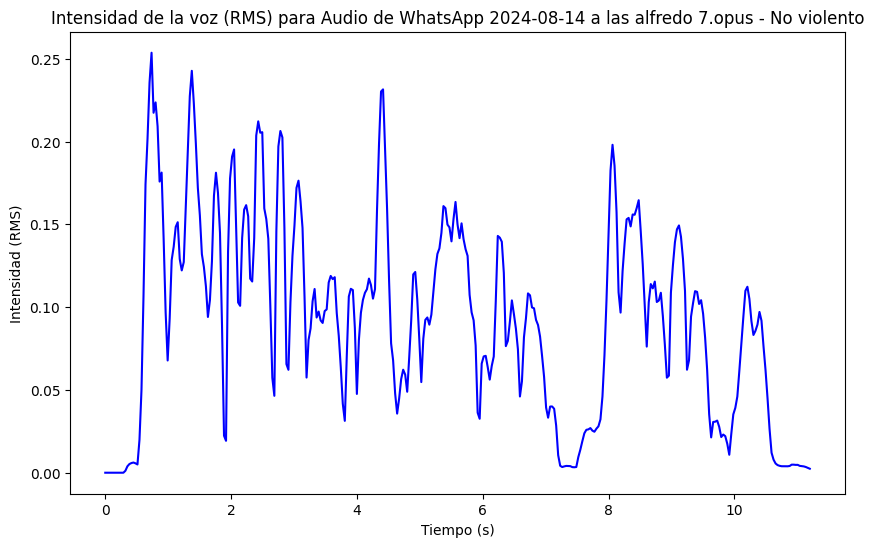

Intensidad promedio para Audio de WhatsApp 2024-08-14 a las alfredo 7.opus (No violento): 0.09319332242012024
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-07-23 a las alfredo 8.opus (Categoría: No violento)


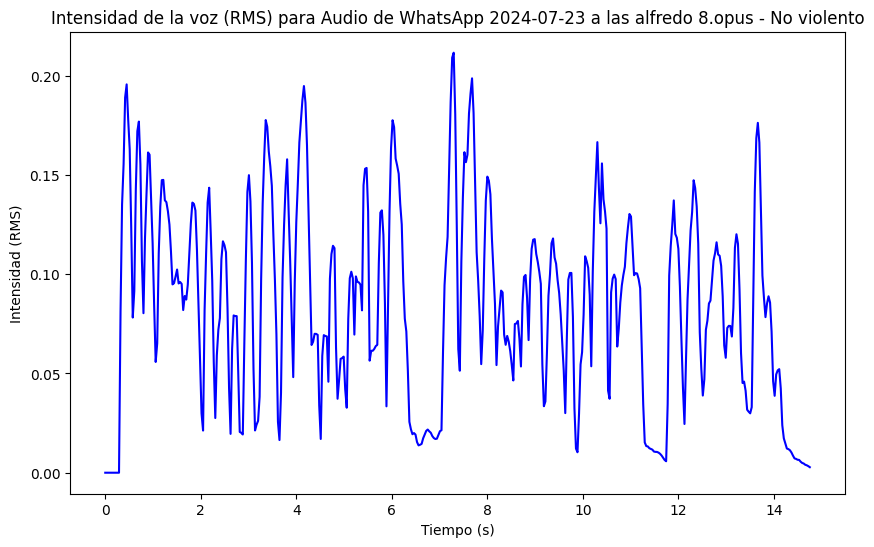

Intensidad promedio para Audio de WhatsApp 2024-07-23 a las alfredo 8.opus (No violento): 0.0853608027100563
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-03-29 a las alfredo 9.opus (Categoría: No violento)


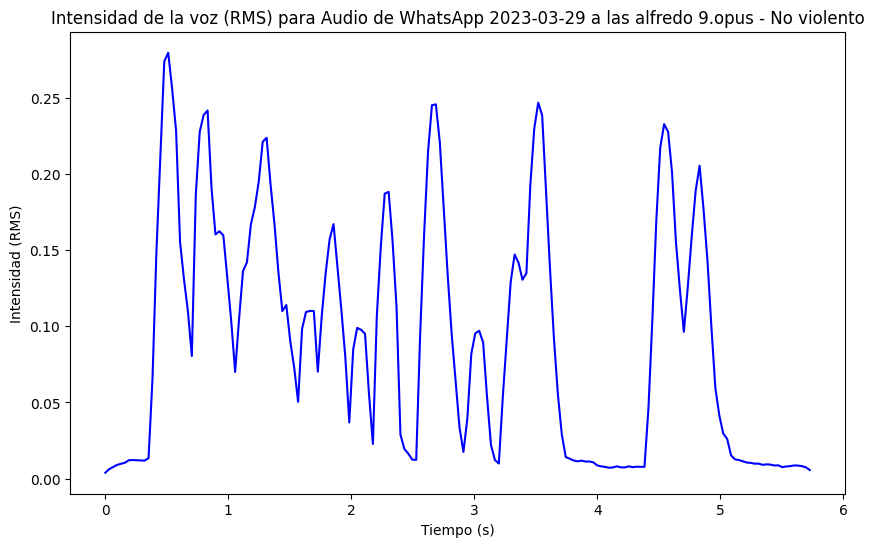

Intensidad promedio para Audio de WhatsApp 2023-03-29 a las alfredo 9.opus (No violento): 0.0931844711303711
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-03-09 a las alfredo 10.opus (Categoría: No violento)


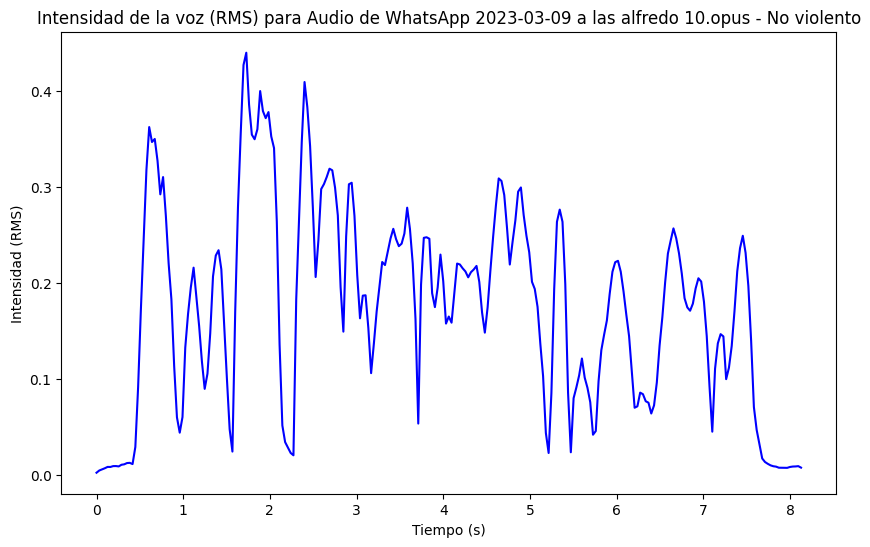

Intensidad promedio para Audio de WhatsApp 2023-03-09 a las alfredo 10.opus (No violento): 0.17494064569473267
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-01-16 a las alfredo 11.opus (Categoría: No violento)


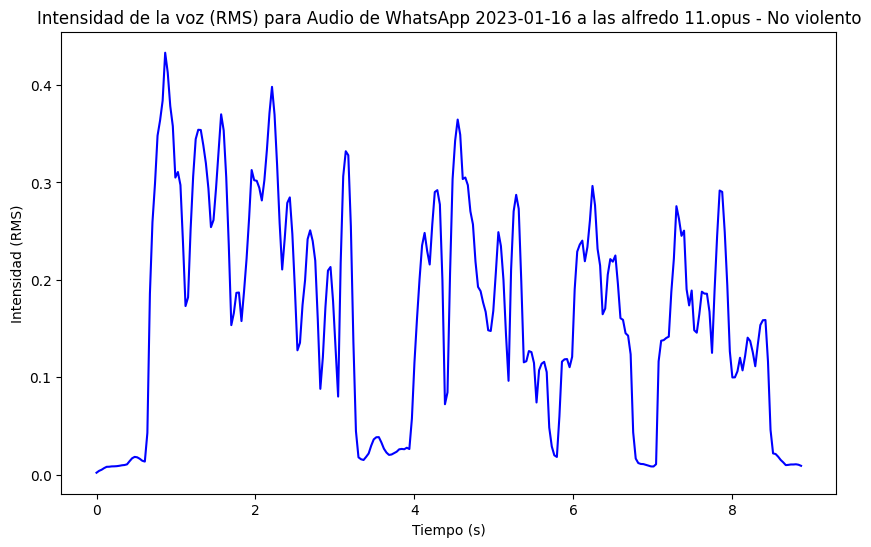

Intensidad promedio para Audio de WhatsApp 2023-01-16 a las alfredo 11.opus (No violento): 0.16630686819553375
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2022-12-28 a las alfredo 13.opus (Categoría: No violento)


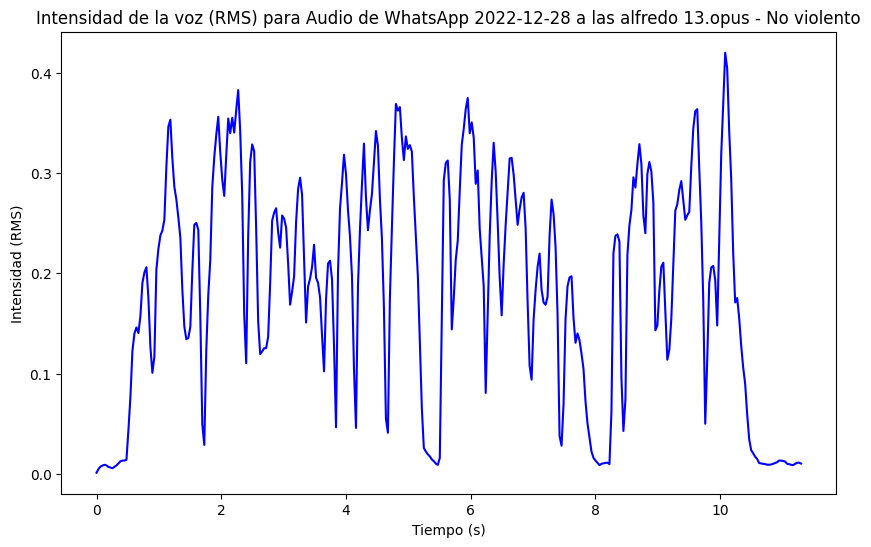

Intensidad promedio para Audio de WhatsApp 2022-12-28 a las alfredo 13.opus (No violento): 0.18631628155708313
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2022-10-26 a las alfredo 14.opus (Categoría: No violento)


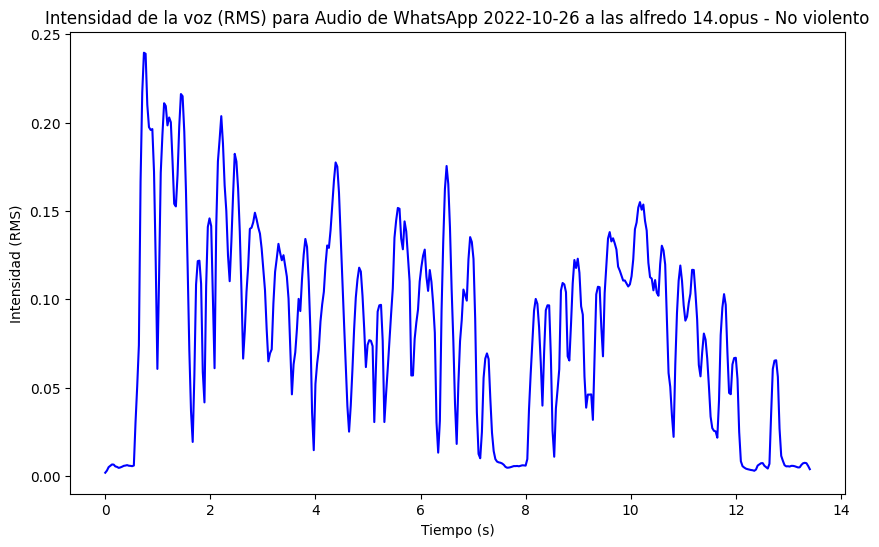

Intensidad promedio para Audio de WhatsApp 2022-10-26 a las alfredo 14.opus (No violento): 0.08490636944770813
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2022-10-12 a las alfredo 15.opus (Categoría: No violento)


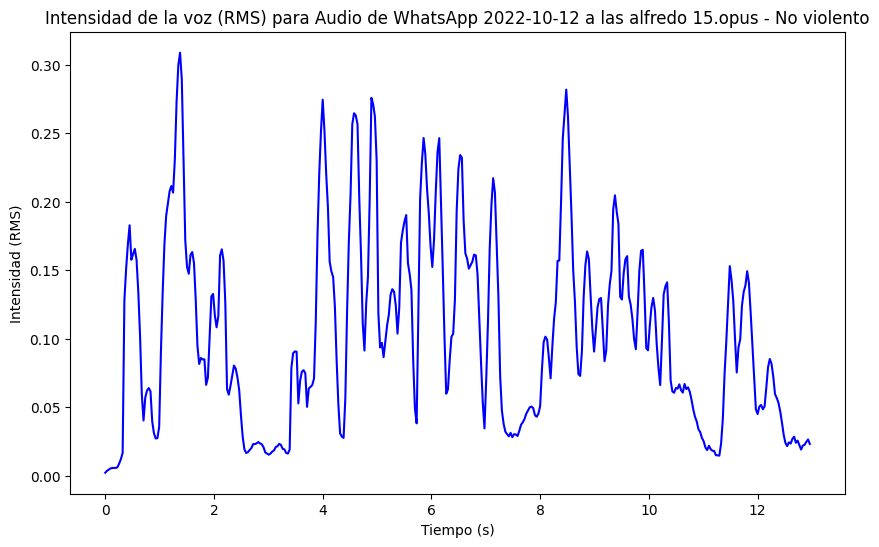

Intensidad promedio para Audio de WhatsApp 2022-10-12 a las alfredo 15.opus (No violento): 0.10408191382884979
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-05 a las Joel 2.opus (Categoría: No violento)


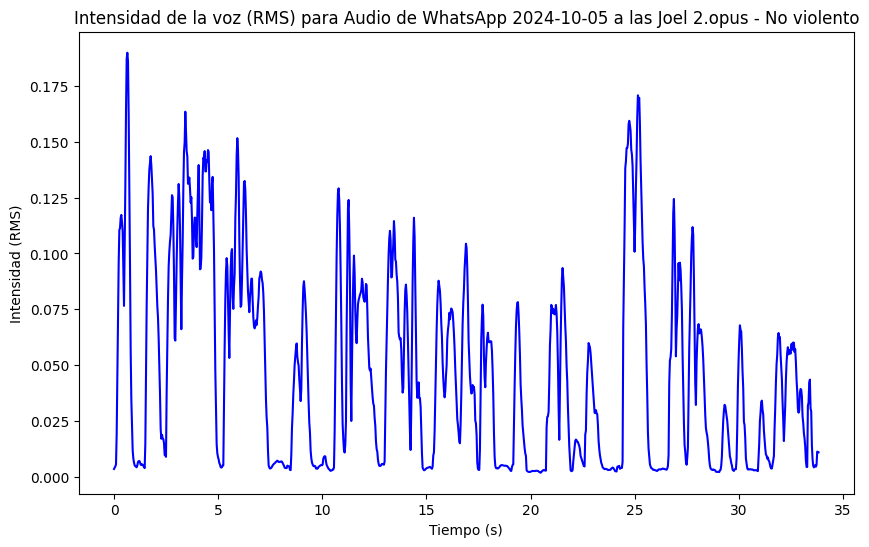

Intensidad promedio para Audio de WhatsApp 2024-10-05 a las Joel 2.opus (No violento): 0.04758436977863312
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-31 a las Joel 3.opus (Categoría: No violento)


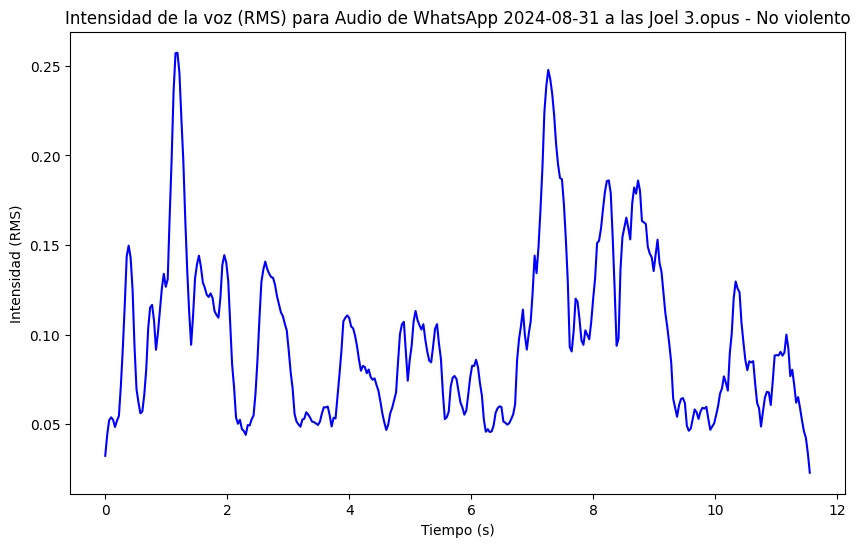

Intensidad promedio para Audio de WhatsApp 2024-08-31 a las Joel 3.opus (No violento): 0.09812697768211365
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-17 a las Joel 4.opus (Categoría: No violento)


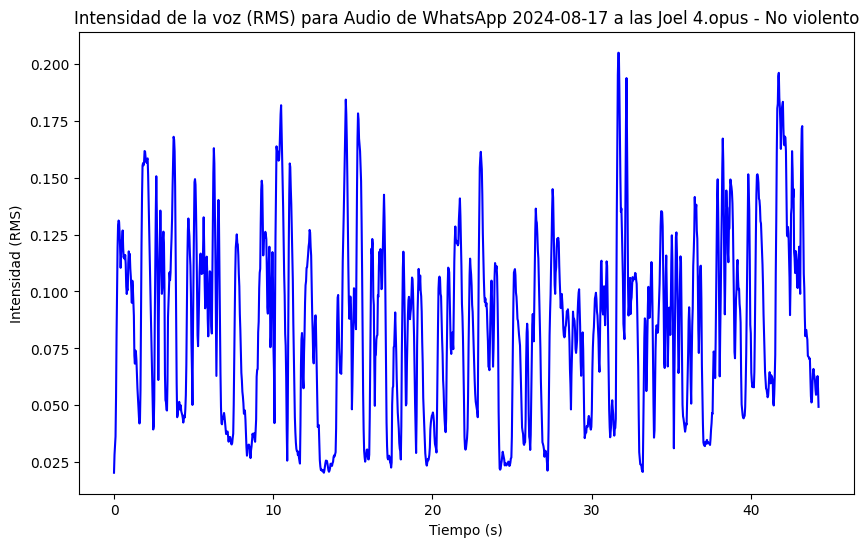

Intensidad promedio para Audio de WhatsApp 2024-08-17 a las Joel 4.opus (No violento): 0.08565695583820343
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-17 a las Joel 5.opus (Categoría: No violento)


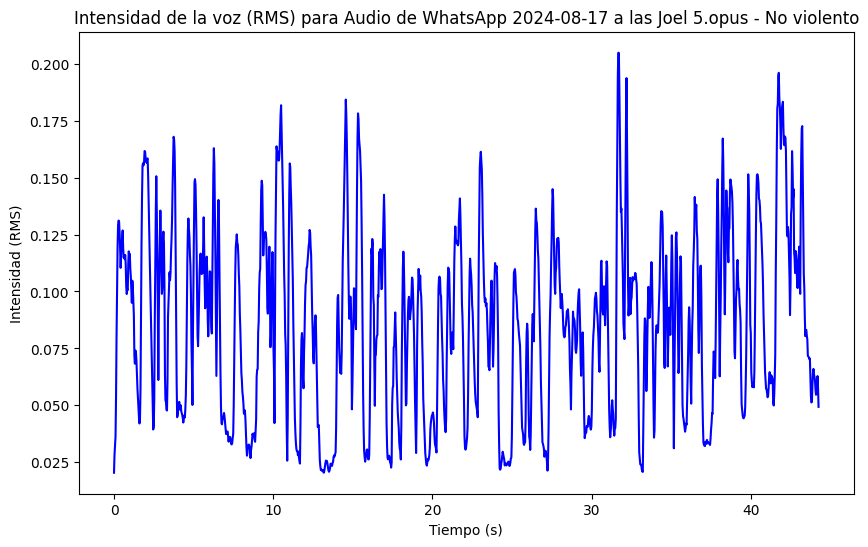

Intensidad promedio para Audio de WhatsApp 2024-08-17 a las Joel 5.opus (No violento): 0.08565695583820343
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 6.opus (Categoría: No violento)


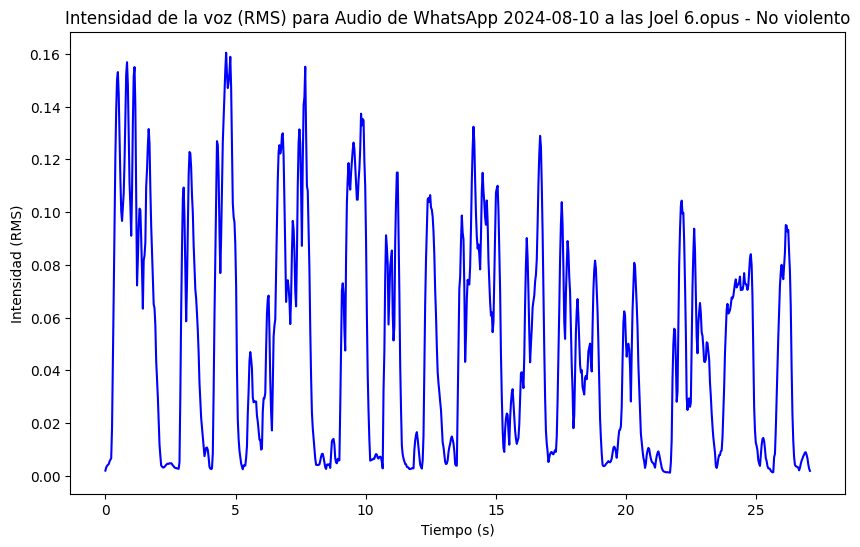

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 6.opus (No violento): 0.050666507333517075
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 7.opus (Categoría: No violento)


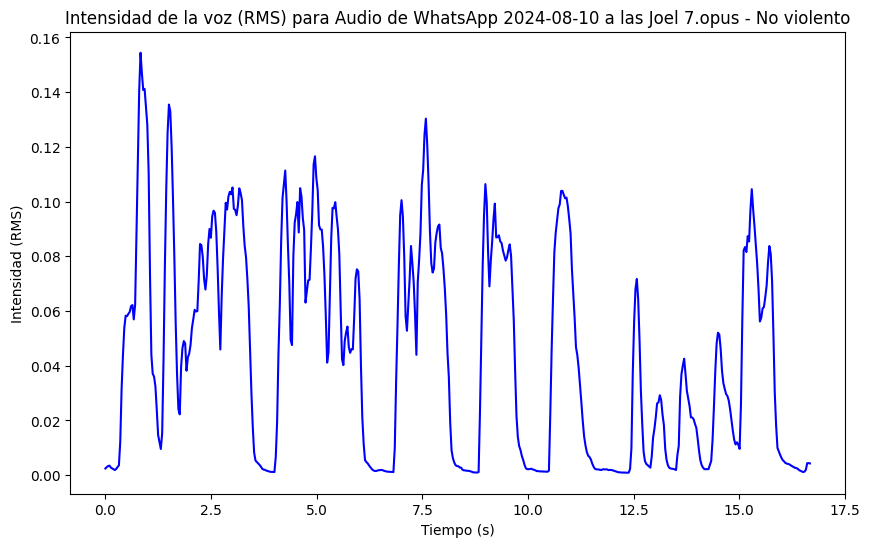

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 7.opus (No violento): 0.04465079680085182
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 8.opus (Categoría: No violento)


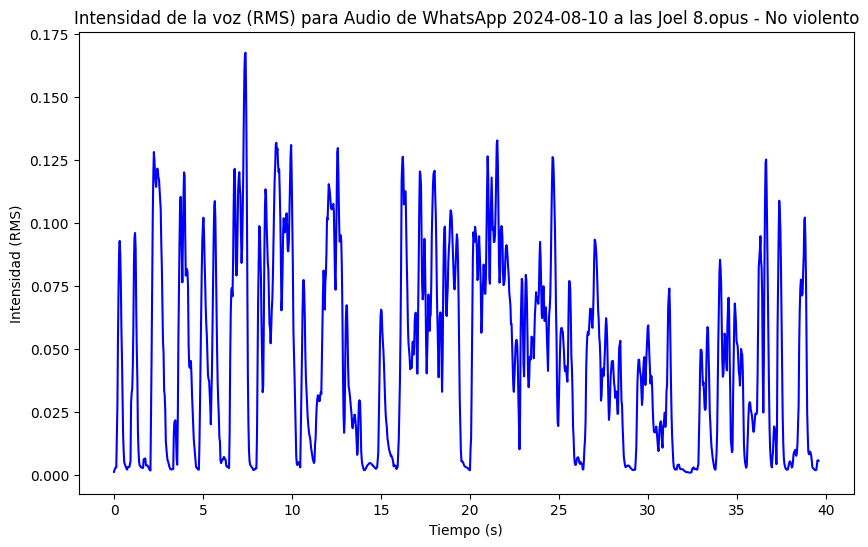

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 8.opus (No violento): 0.04701646417379379
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 9.opus (Categoría: No violento)


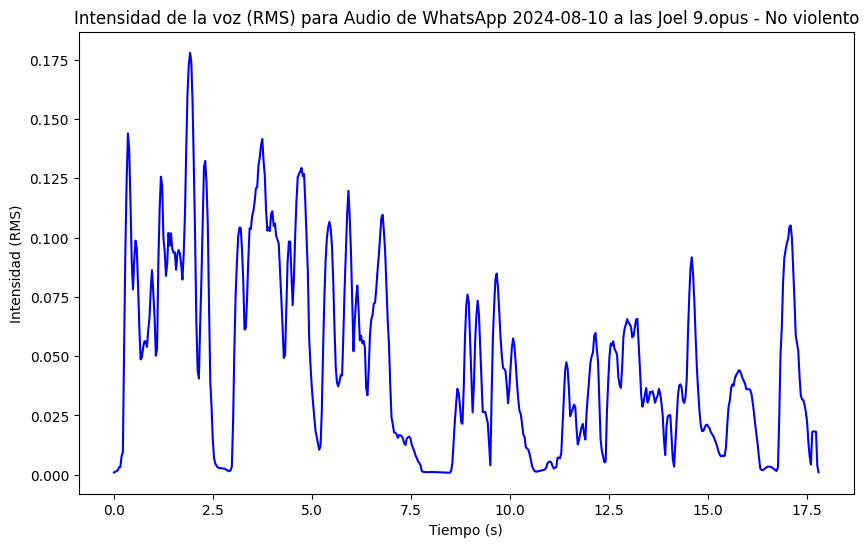

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 9.opus (No violento): 0.047873906791210175
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 10.opus (Categoría: No violento)


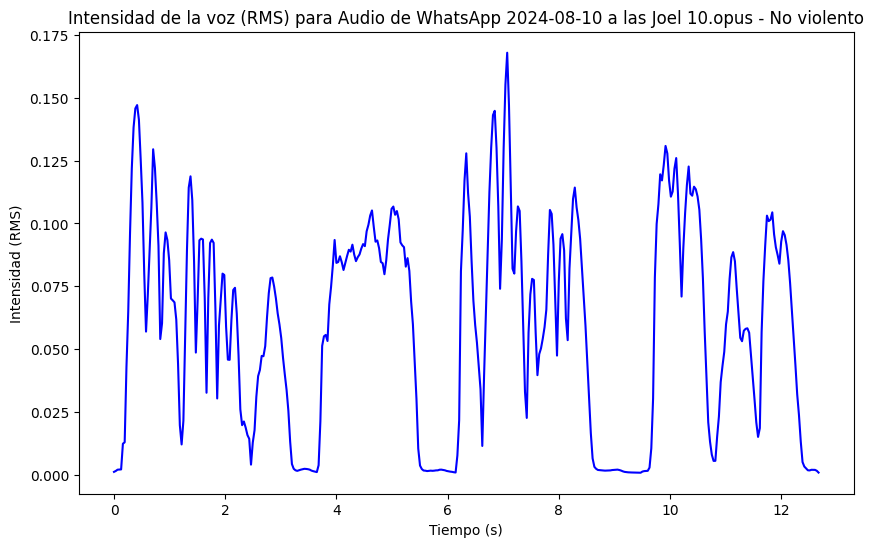

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 10.opus (No violento): 0.059286199510097504
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 11.opus (Categoría: No violento)


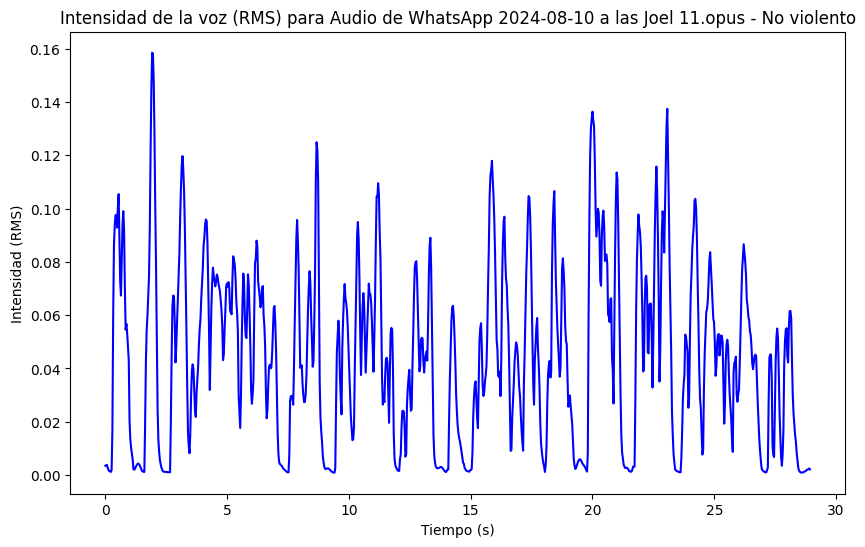

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 11.opus (No violento): 0.04496899992227554
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 12.opus (Categoría: No violento)


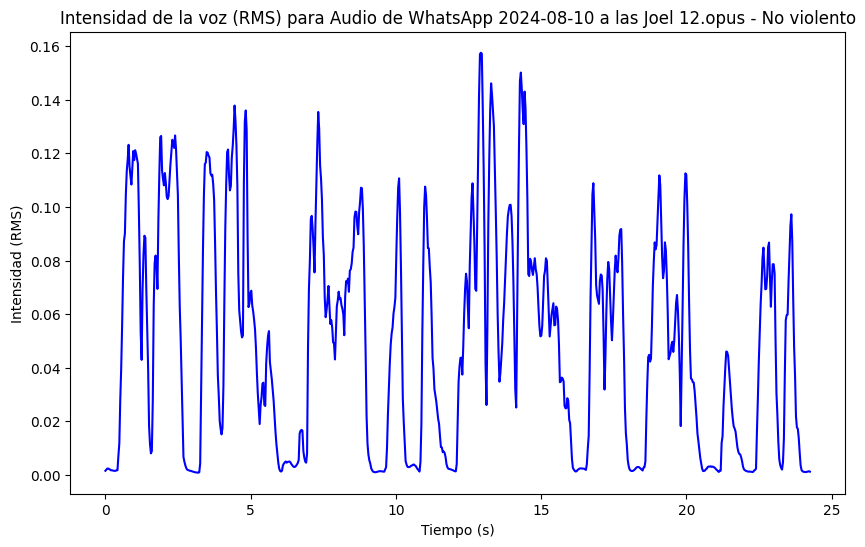

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 12.opus (No violento): 0.05048288777470589
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 13.opus (Categoría: No violento)


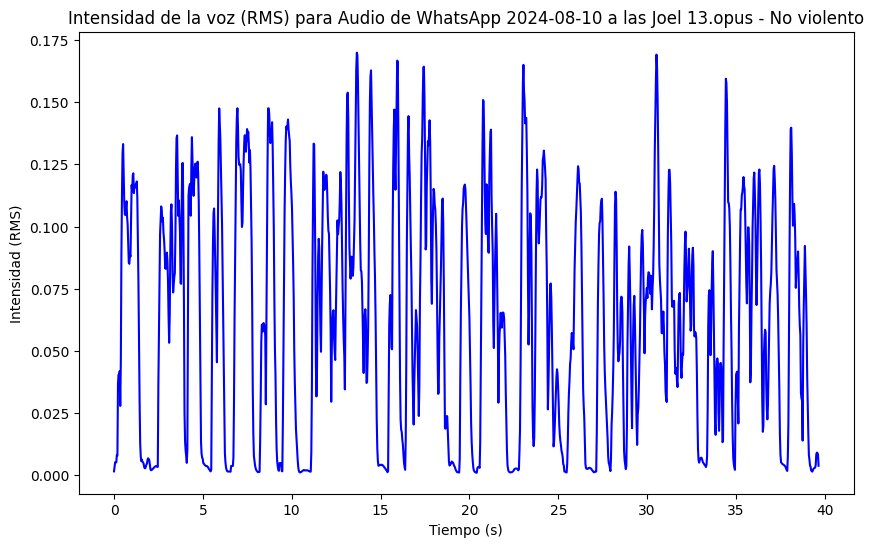

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 13.opus (No violento): 0.06324385106563568
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 14.opus (Categoría: No violento)


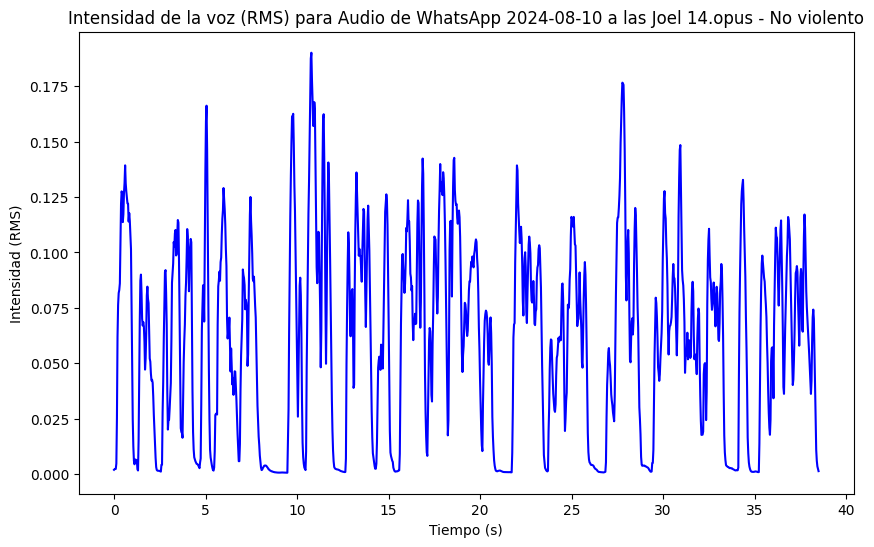

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 14.opus (No violento): 0.060648929327726364
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-10 a las Joel 15.opus (Categoría: No violento)


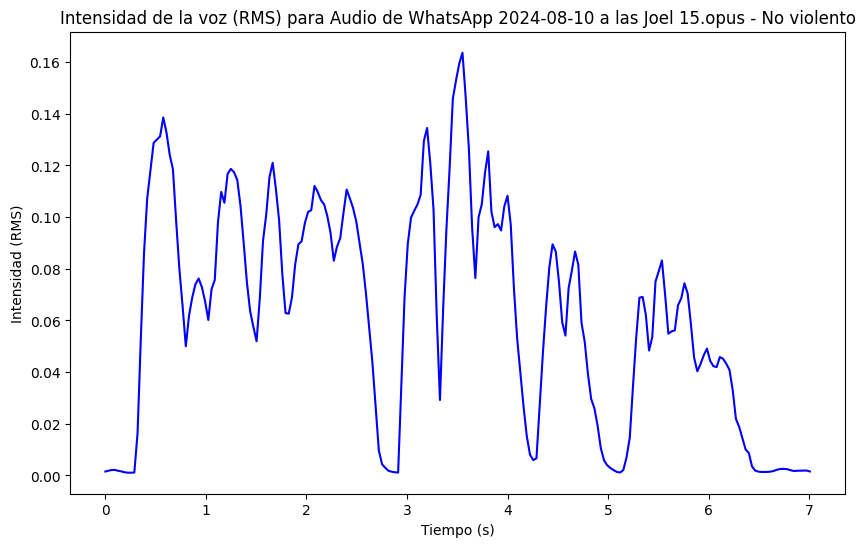

Intensidad promedio para Audio de WhatsApp 2024-08-10 a las Joel 15.opus (No violento): 0.06253767758607864
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-07-02 a las Tania 3.opus (Categoría: No violento)


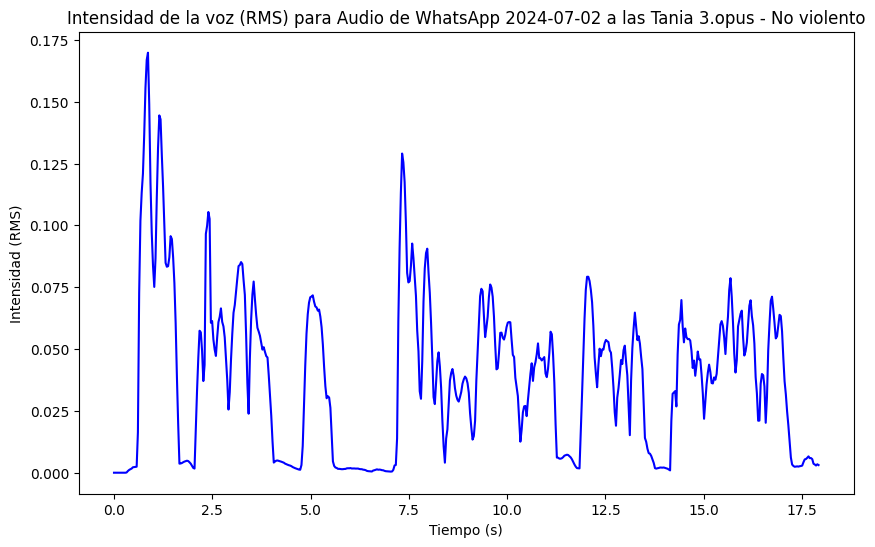

Intensidad promedio para Audio de WhatsApp 2024-07-02 a las Tania 3.opus (No violento): 0.038956861943006516
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-07-02 a las Tania 4.opus (Categoría: No violento)


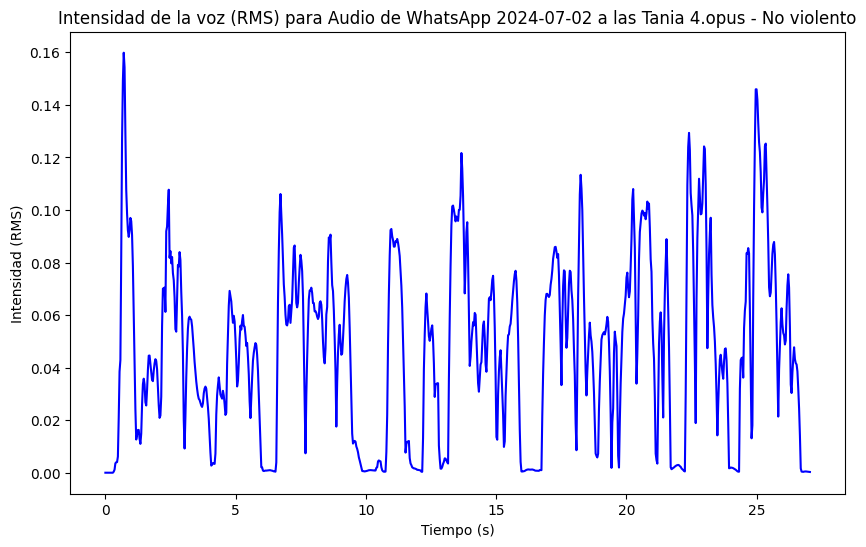

Intensidad promedio para Audio de WhatsApp 2024-07-02 a las Tania 4.opus (No violento): 0.0469505712389946
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-07-02 a las Tania 5.opus (Categoría: No violento)


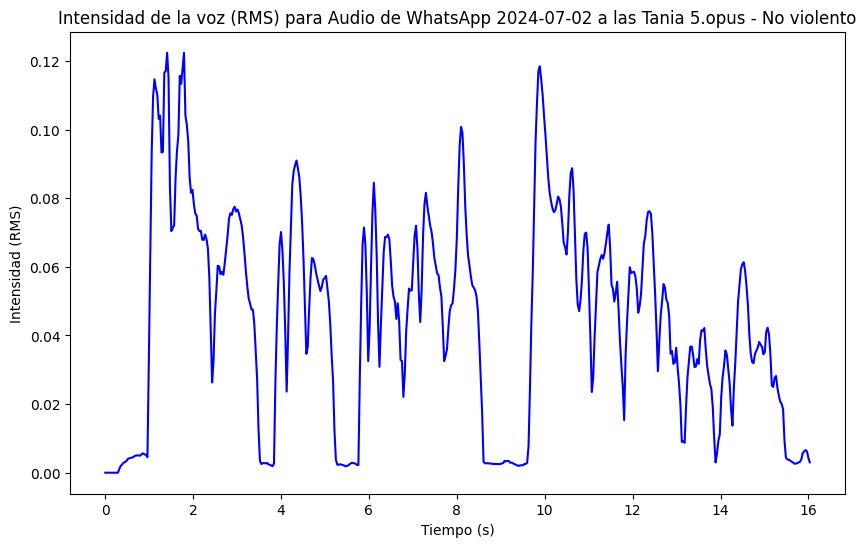

Intensidad promedio para Audio de WhatsApp 2024-07-02 a las Tania 5.opus (No violento): 0.04492009058594704
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-07-02 a las Tania 6.opus (Categoría: No violento)


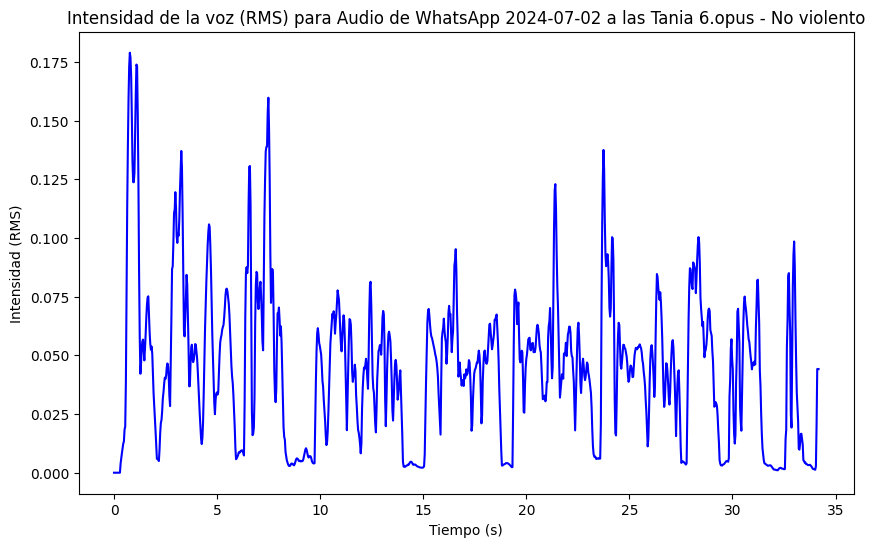

Intensidad promedio para Audio de WhatsApp 2024-07-02 a las Tania 6.opus (No violento): 0.04498738422989845
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-06-09 a las Tania 7.opus (Categoría: No violento)


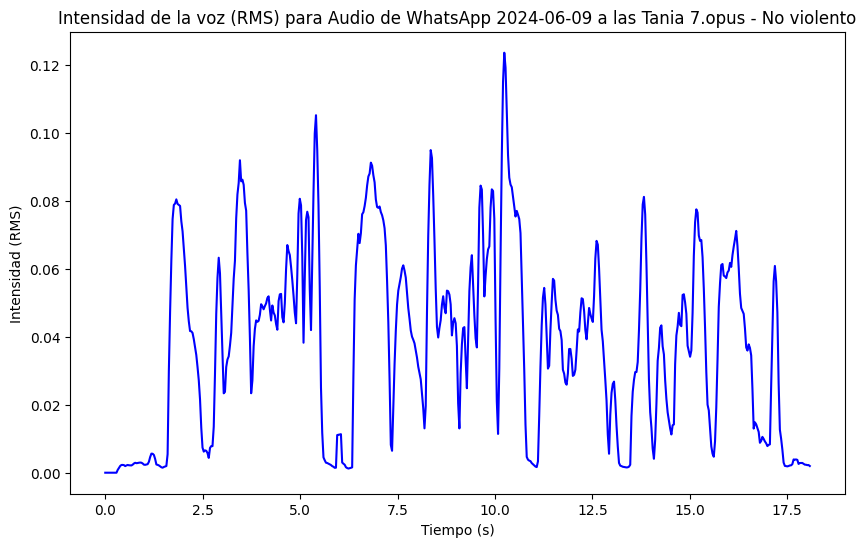

Intensidad promedio para Audio de WhatsApp 2024-06-09 a las Tania 7.opus (No violento): 0.038290075957775116
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-06-09 a las Tania 8.opus (Categoría: No violento)


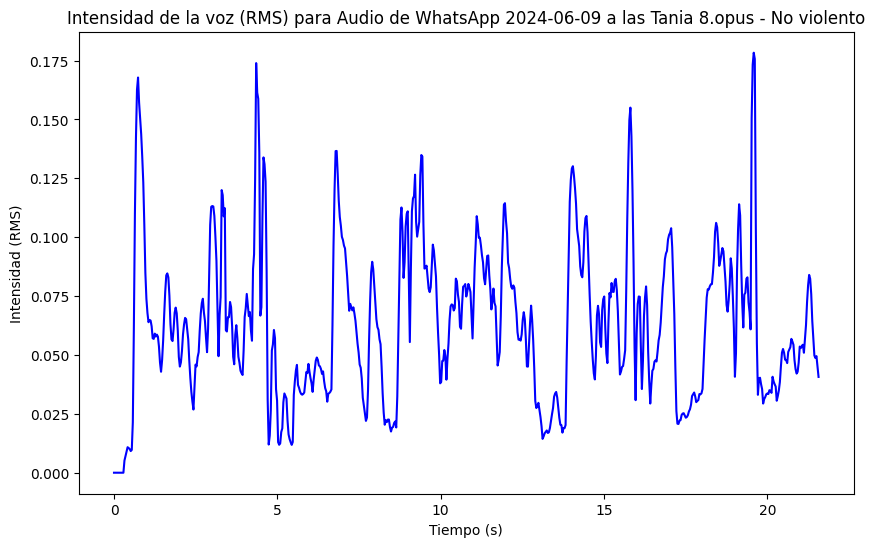

Intensidad promedio para Audio de WhatsApp 2024-06-09 a las Tania 8.opus (No violento): 0.06359466165304184
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-02-18 a las Tania 9.opus (Categoría: No violento)


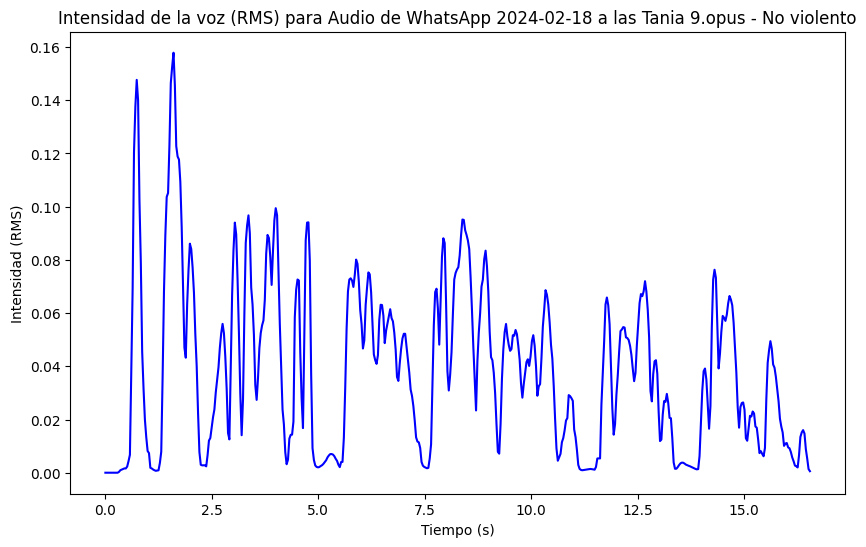

Intensidad promedio para Audio de WhatsApp 2024-02-18 a las Tania 9.opus (No violento): 0.038817450404167175
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-10-02 a las Tania 9.opus (Categoría: No violento)


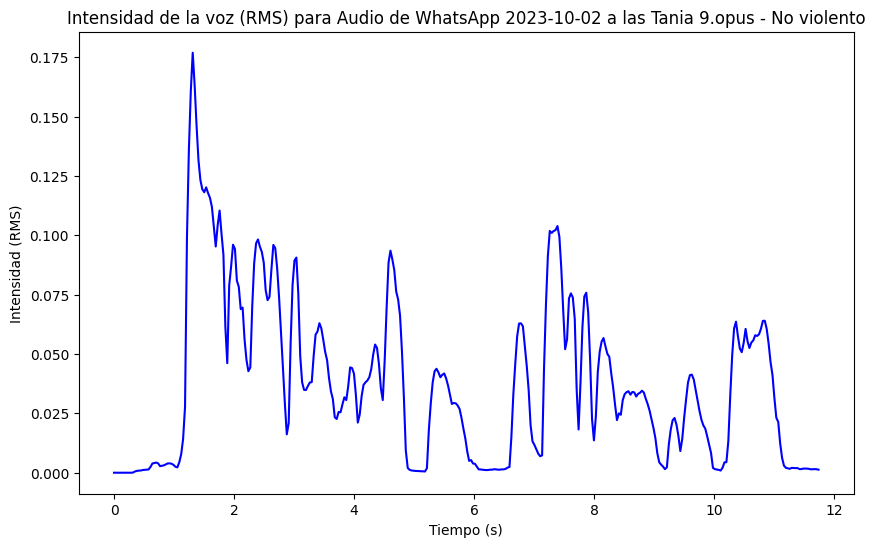

Intensidad promedio para Audio de WhatsApp 2023-10-02 a las Tania 9.opus (No violento): 0.0381842777132988
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-10-02 a las Tania 10.opus (Categoría: No violento)


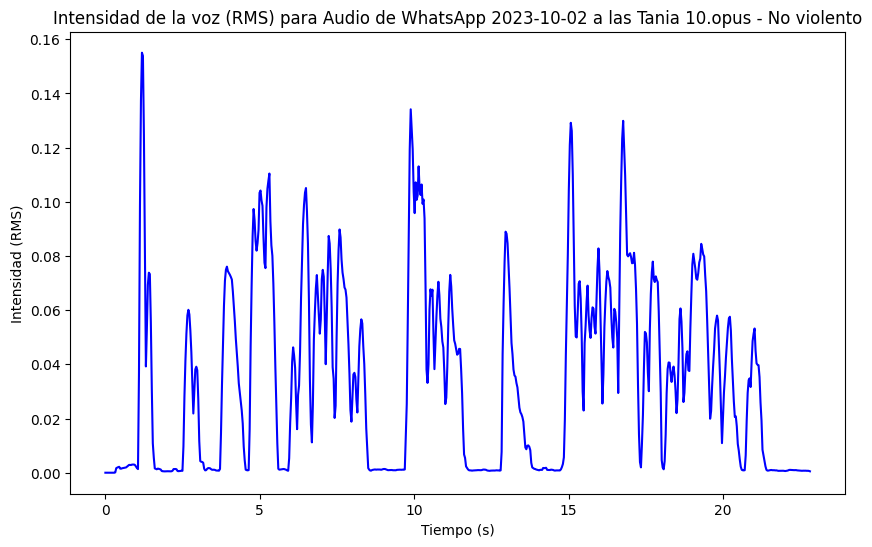

Intensidad promedio para Audio de WhatsApp 2023-10-02 a las Tania 10.opus (No violento): 0.035068728029727936
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-10-02 a las Tania 11.opus (Categoría: No violento)


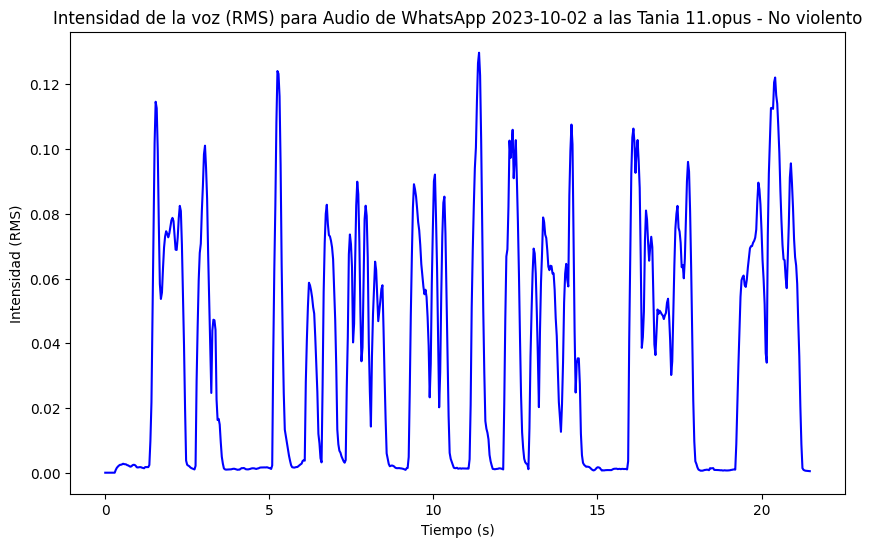

Intensidad promedio para Audio de WhatsApp 2023-10-02 a las Tania 11.opus (No violento): 0.036509137600660324
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-09-16 a las Tania 12.opus (Categoría: No violento)


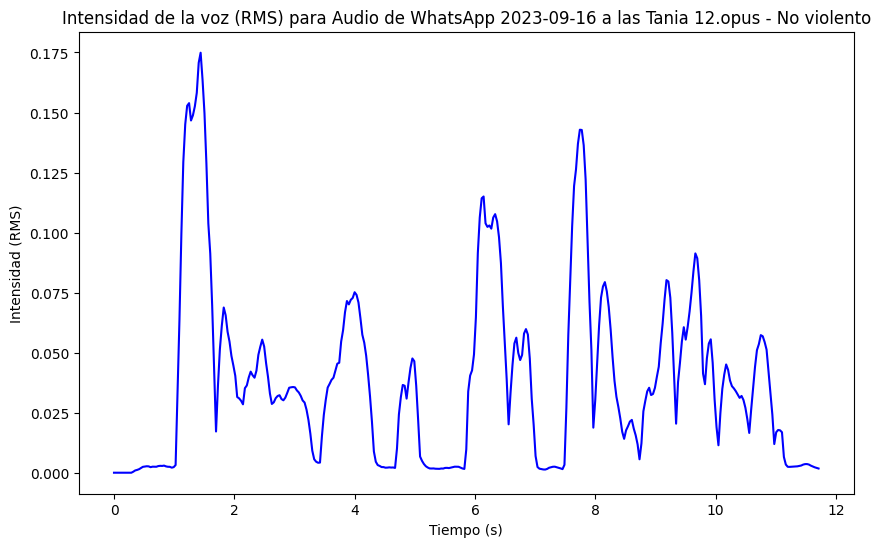

Intensidad promedio para Audio de WhatsApp 2023-09-16 a las Tania 12.opus (No violento): 0.03906844183802605
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-09-16 a las Tania 13.opus (Categoría: No violento)


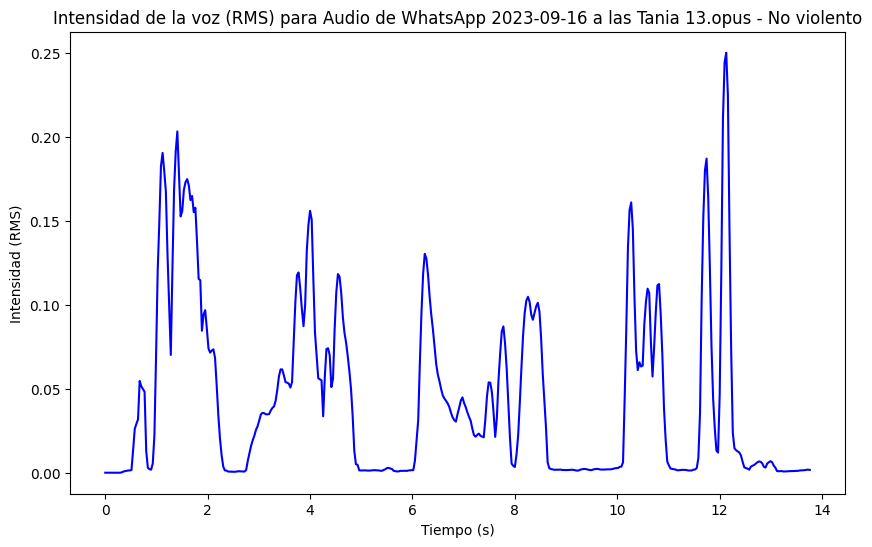

Intensidad promedio para Audio de WhatsApp 2023-09-16 a las Tania 13.opus (No violento): 0.044880665838718414
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-09-16 a las Tania 14.opus (Categoría: No violento)


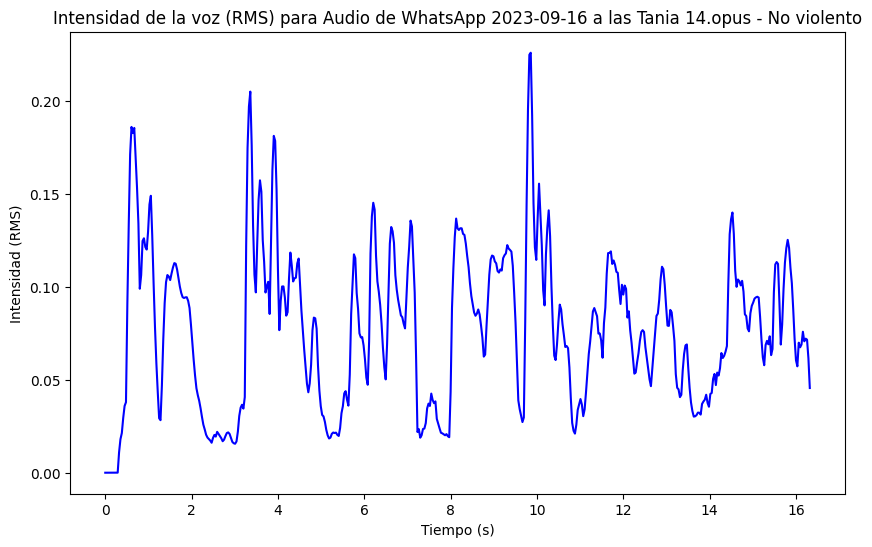

Intensidad promedio para Audio de WhatsApp 2023-09-16 a las Tania 14.opus (No violento): 0.07802610844373703
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2023-09-13 a las Tania 15.opus (Categoría: No violento)


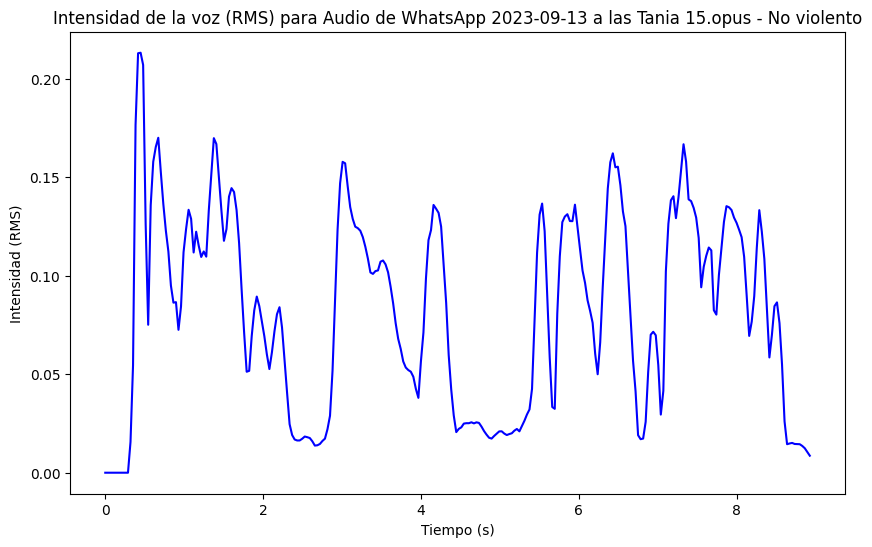

Intensidad promedio para Audio de WhatsApp 2023-09-13 a las Tania 15.opus (No violento): 0.08192822337150574
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-09 a las fede 1.opus (Categoría: No violento)


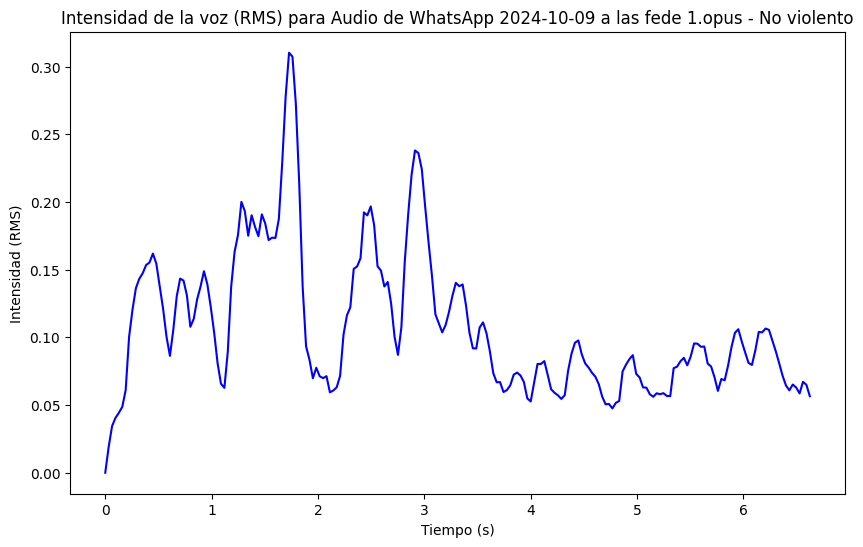

Intensidad promedio para Audio de WhatsApp 2024-10-09 a las fede 1.opus (No violento): 0.10746869444847107
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-08 a las fede 2.opus (Categoría: No violento)


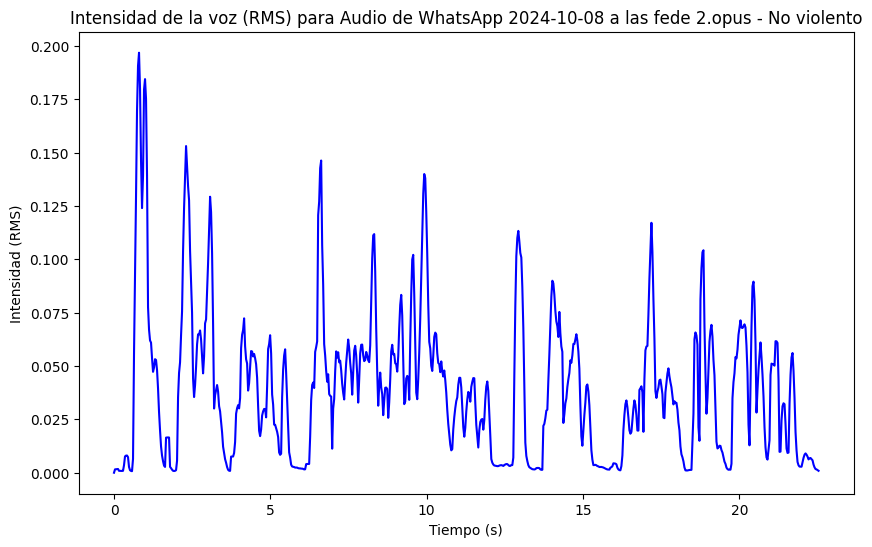

Intensidad promedio para Audio de WhatsApp 2024-10-08 a las fede 2.opus (No violento): 0.03980201110243797
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-08 a las fede 3.opus (Categoría: No violento)


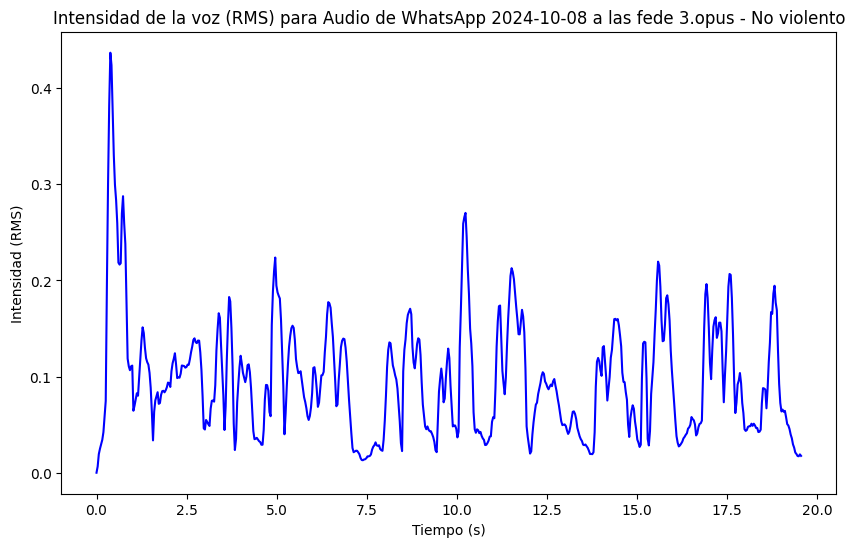

Intensidad promedio para Audio de WhatsApp 2024-10-08 a las fede 3.opus (No violento): 0.09715055674314499
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-08 a las fede 4.opus (Categoría: No violento)


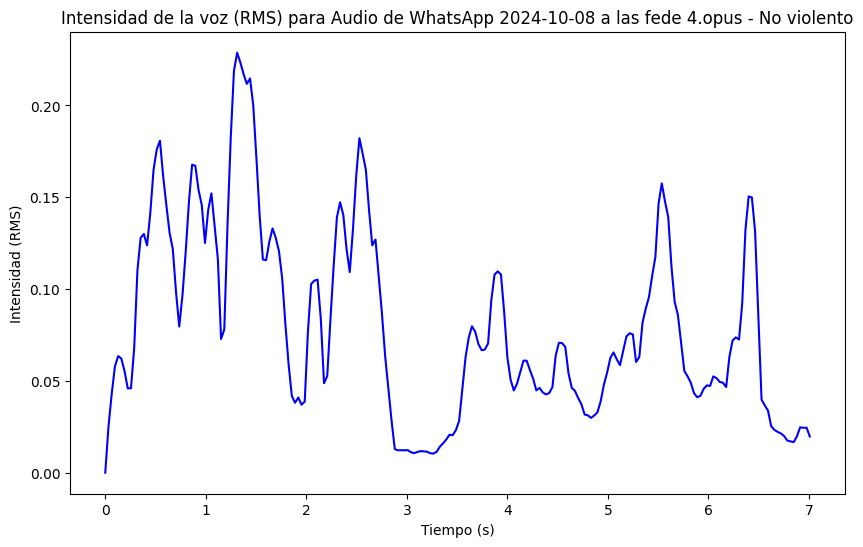

Intensidad promedio para Audio de WhatsApp 2024-10-08 a las fede 4.opus (No violento): 0.08017805218696594
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-08 a las fede 5.opus (Categoría: No violento)


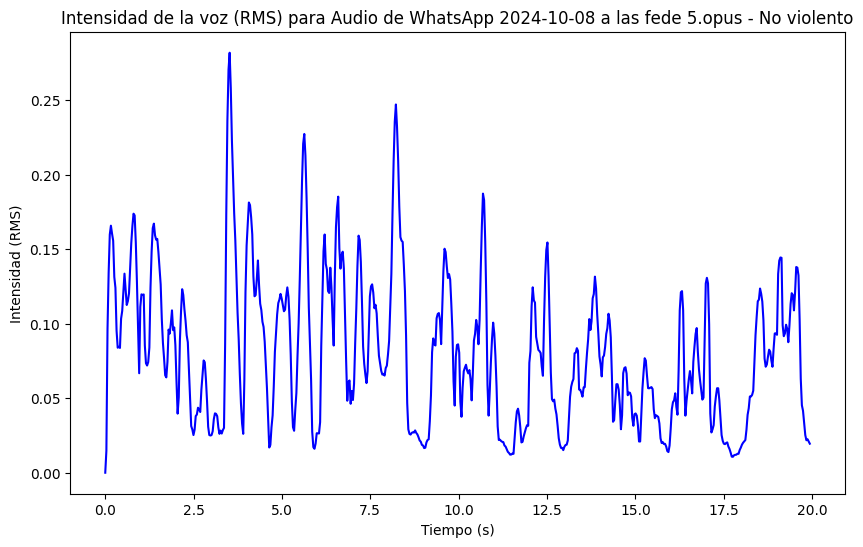

Intensidad promedio para Audio de WhatsApp 2024-10-08 a las fede 5.opus (No violento): 0.08089728653430939
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-02 a las fede 6.opus (Categoría: No violento)


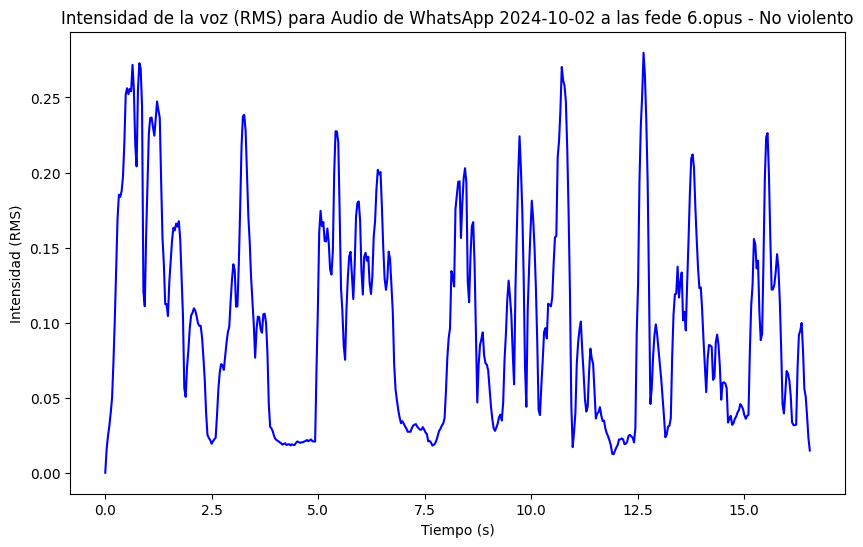

Intensidad promedio para Audio de WhatsApp 2024-10-02 a las fede 6.opus (No violento): 0.10061988979578018
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-02 a las fede 7.opus (Categoría: No violento)


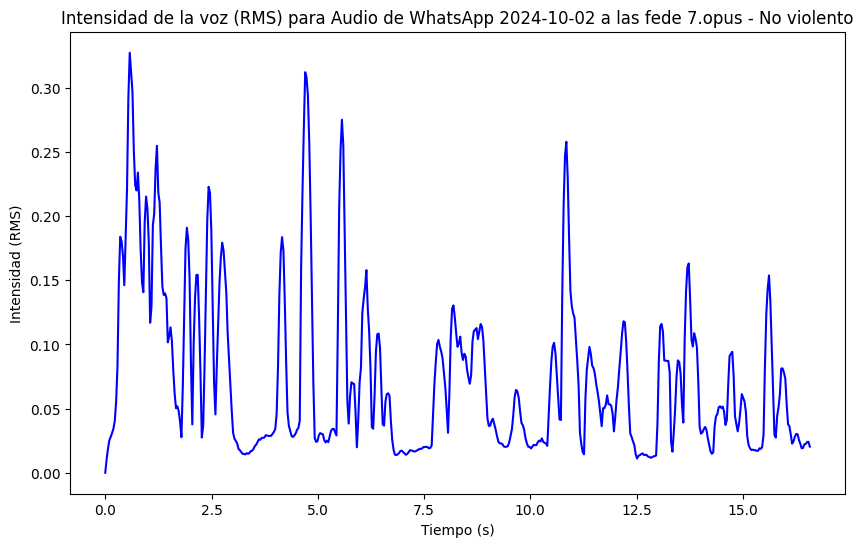

Intensidad promedio para Audio de WhatsApp 2024-10-02 a las fede 7.opus (No violento): 0.07509931921958923
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-10-02 a las fede 8.opus (Categoría: No violento)


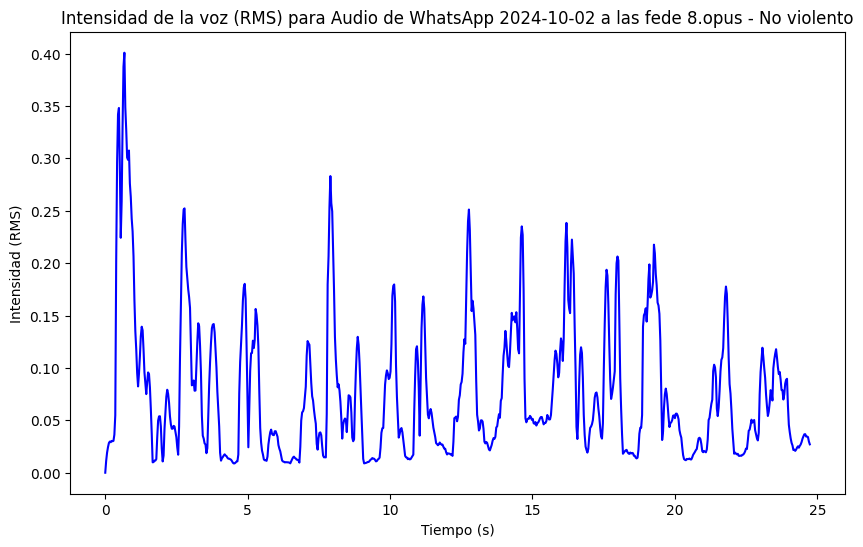

Intensidad promedio para Audio de WhatsApp 2024-10-02 a las fede 8.opus (No violento): 0.07668175548315048
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-12 a las fede 9.opus (Categoría: No violento)


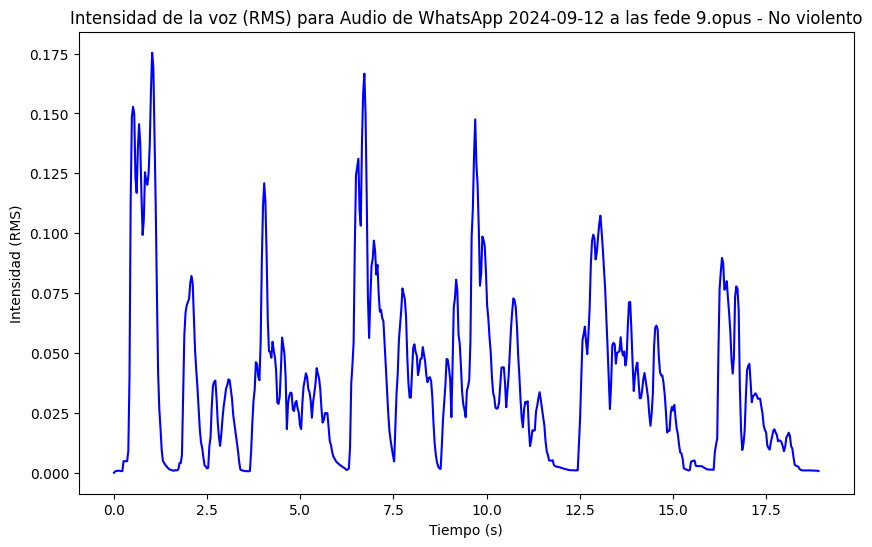

Intensidad promedio para Audio de WhatsApp 2024-09-12 a las fede 9.opus (No violento): 0.03855437785387039
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-12 a las fede 10.opus (Categoría: No violento)


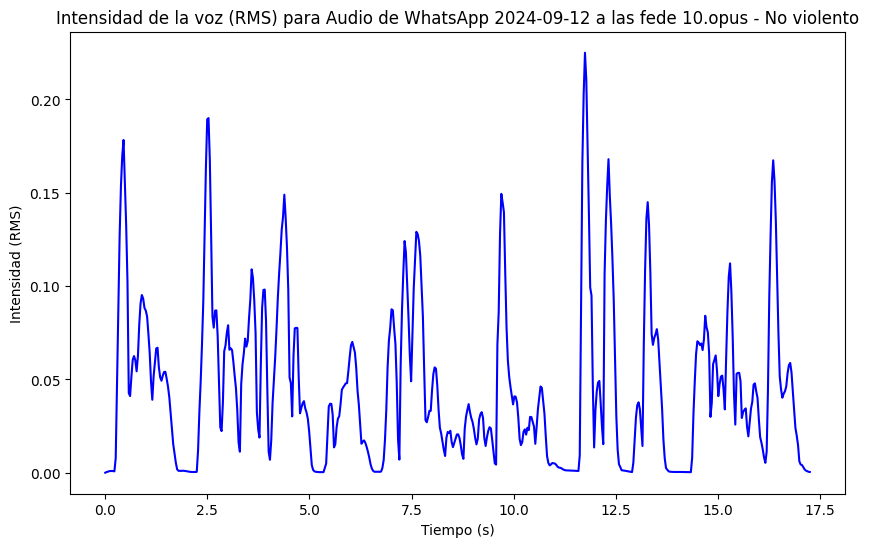

Intensidad promedio para Audio de WhatsApp 2024-09-12 a las fede 10.opus (No violento): 0.04658365249633789
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-11 a las fede 11.opus (Categoría: No violento)


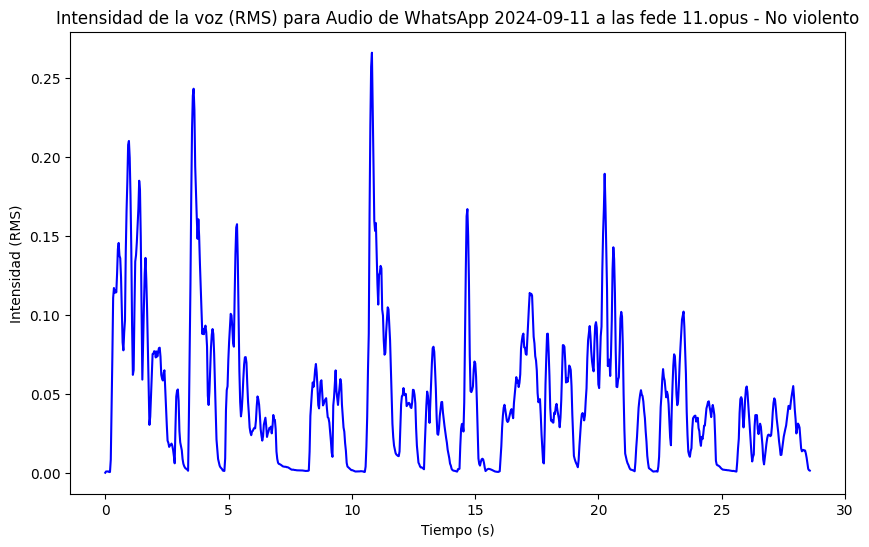

Intensidad promedio para Audio de WhatsApp 2024-09-11 a las fede 11.opus (No violento): 0.047044046223163605
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-06 a las fede 12.opus (Categoría: No violento)


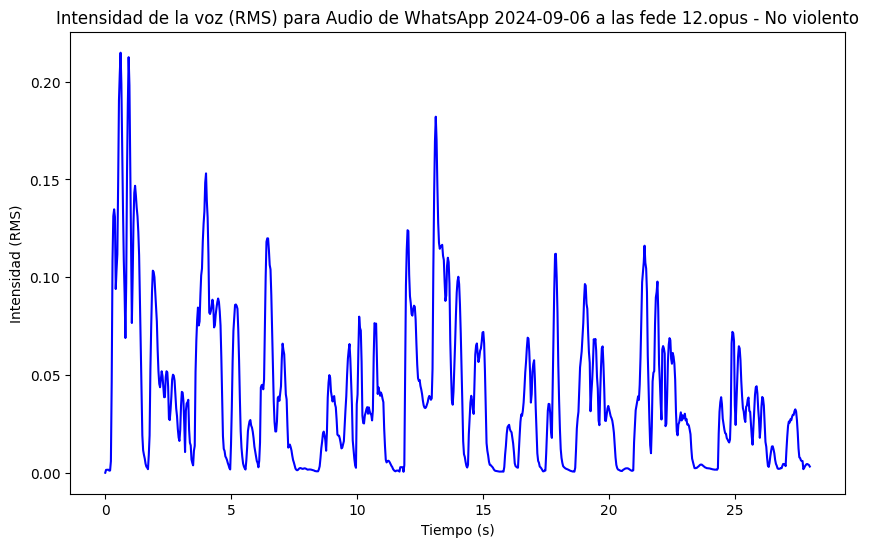

Intensidad promedio para Audio de WhatsApp 2024-09-06 a las fede 12.opus (No violento): 0.039647284895181656
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-04 a las fede 13.opus (Categoría: No violento)


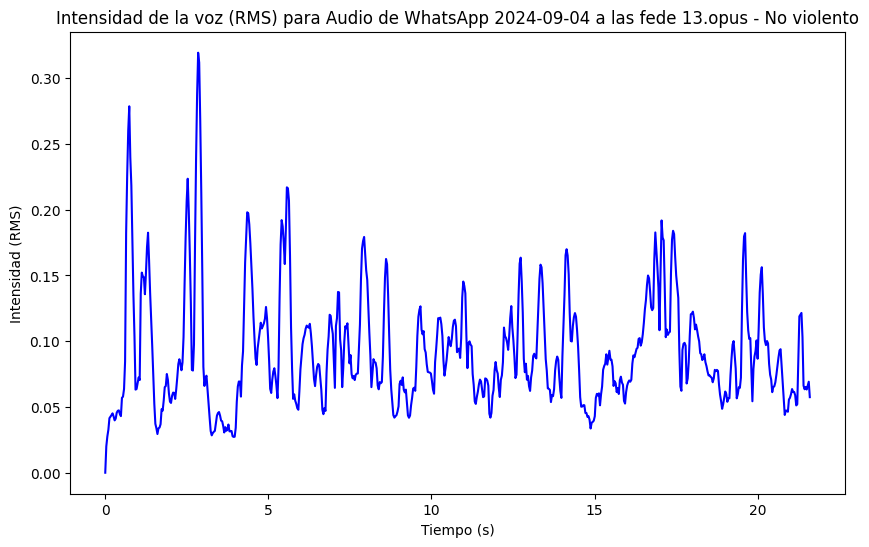

Intensidad promedio para Audio de WhatsApp 2024-09-04 a las fede 13.opus (No violento): 0.09256687015295029
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-03 a las fede 14.opus (Categoría: No violento)


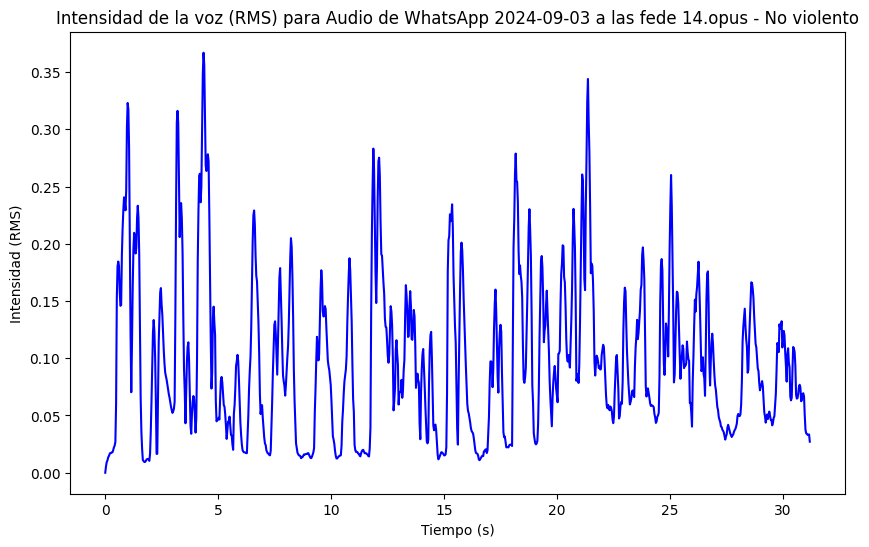

Intensidad promedio para Audio de WhatsApp 2024-09-03 a las fede 14.opus (No violento): 0.0991668552160263
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-02 a las fede 15.opus (Categoría: No violento)


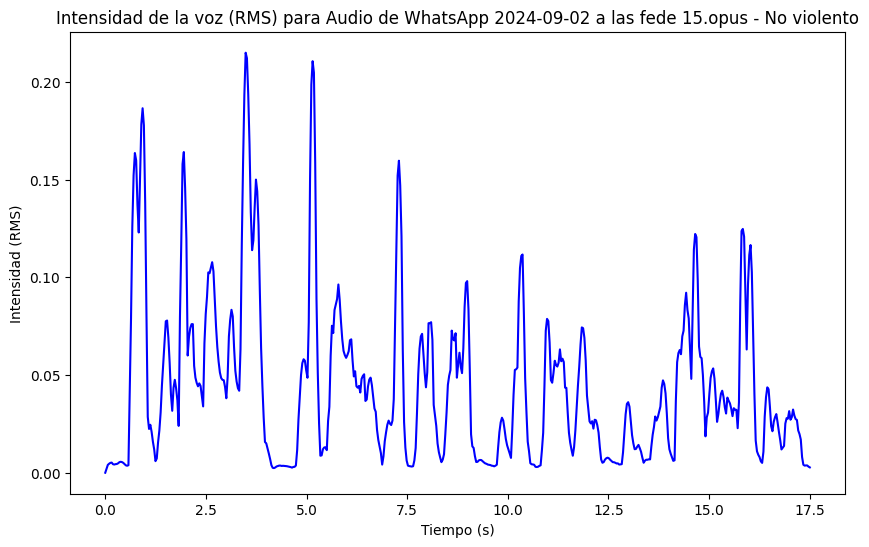

Intensidad promedio para Audio de WhatsApp 2024-09-02 a las fede 15.opus (No violento): 0.04514739662408829
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-04 a las Nahir 1.opus (Categoría: No violento)


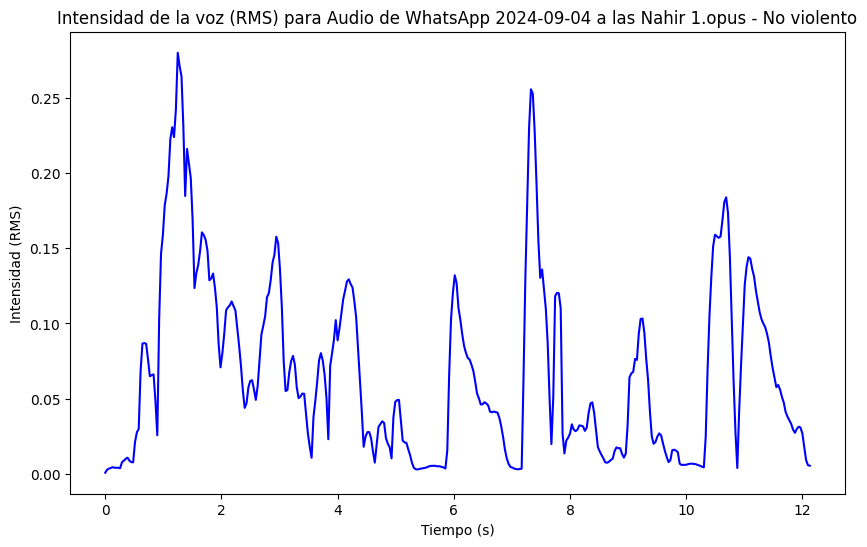

Intensidad promedio para Audio de WhatsApp 2024-09-04 a las Nahir 1.opus (No violento): 0.06757590919733047
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-04 a las fede 2.opus (Categoría: No violento)


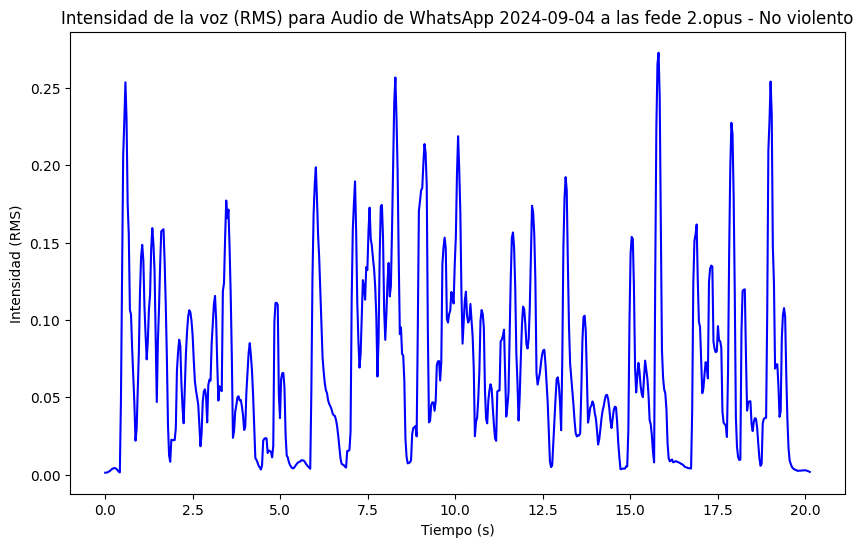

Intensidad promedio para Audio de WhatsApp 2024-09-04 a las fede 2.opus (No violento): 0.0722094476222992
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-04 a las Nahir 3.opus (Categoría: No violento)


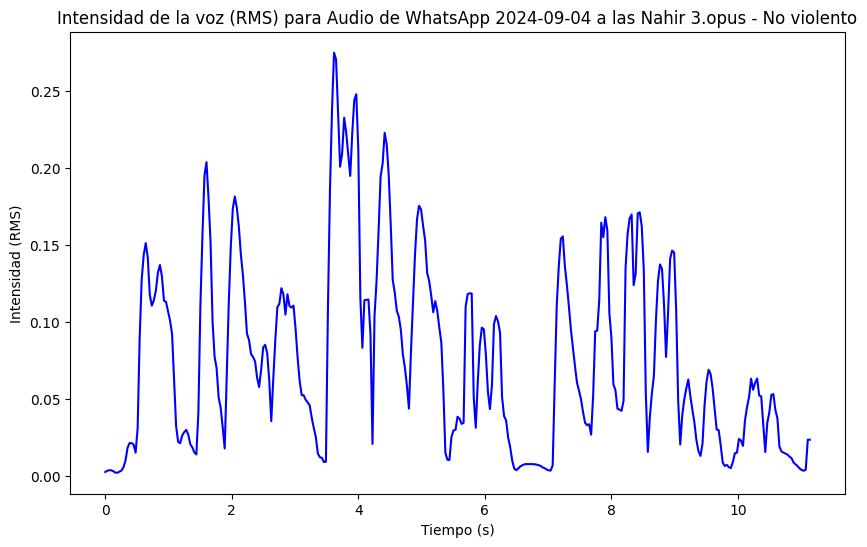

Intensidad promedio para Audio de WhatsApp 2024-09-04 a las Nahir 3.opus (No violento): 0.07730638980865479
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-04 a las Nahir 4.opus (Categoría: No violento)


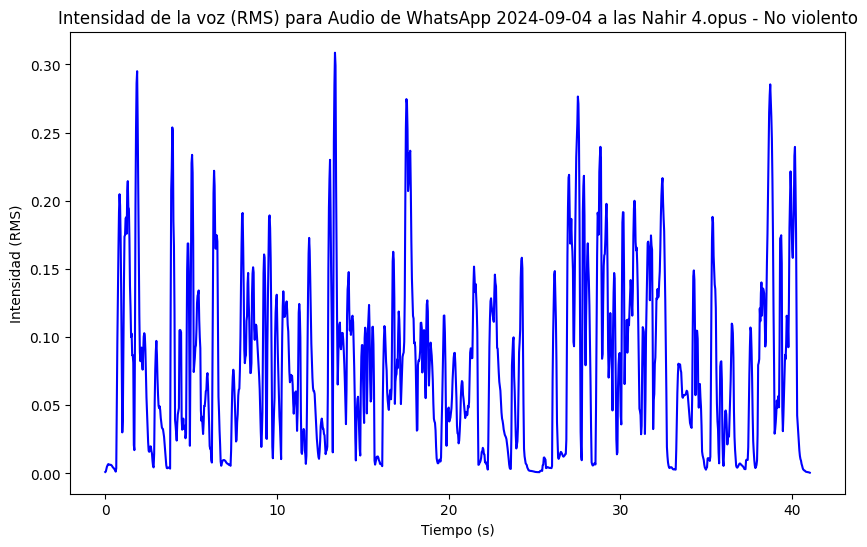

Intensidad promedio para Audio de WhatsApp 2024-09-04 a las Nahir 4.opus (No violento): 0.07891165465116501
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-02 a las  Nahir 5.opus (Categoría: No violento)


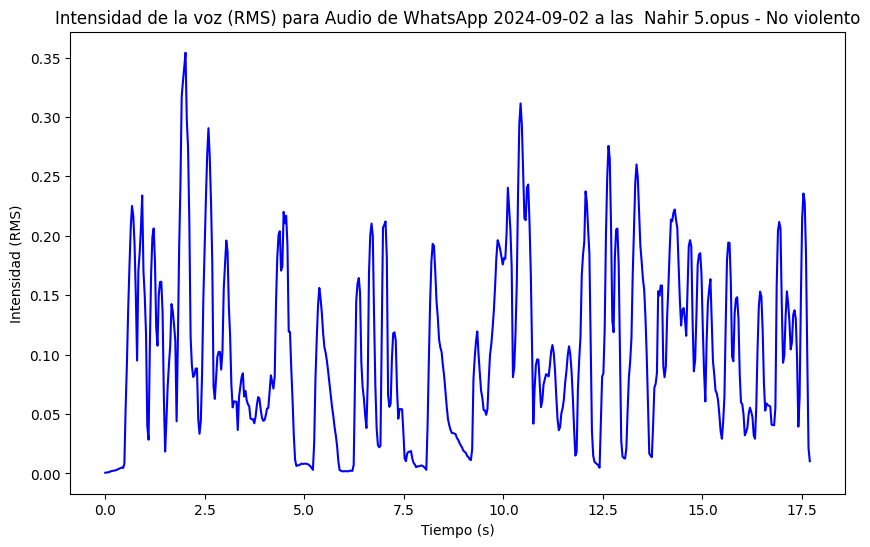

Intensidad promedio para Audio de WhatsApp 2024-09-02 a las  Nahir 5.opus (No violento): 0.10297684371471405
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-02 a las  Nahir 6.opus (Categoría: No violento)


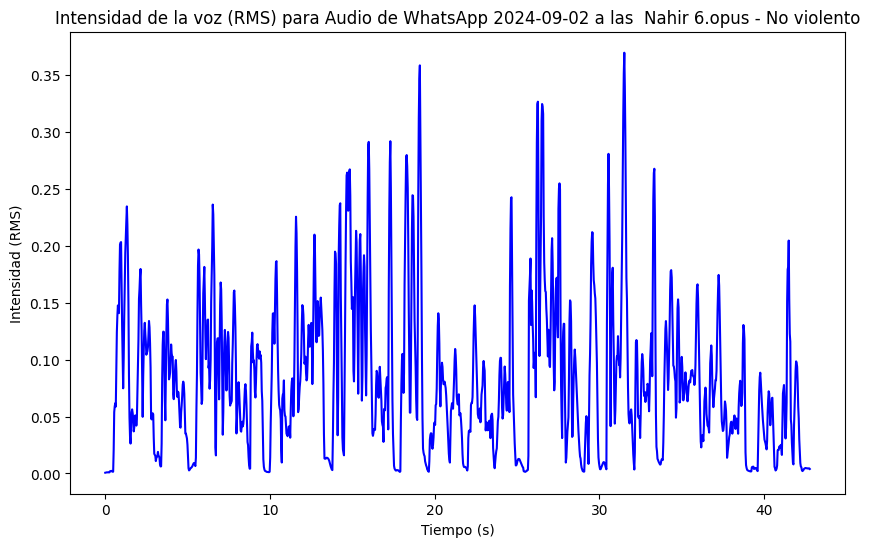

Intensidad promedio para Audio de WhatsApp 2024-09-02 a las  Nahir 6.opus (No violento): 0.08428140729665756
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-02 a las  Nahir 7.opus (Categoría: No violento)


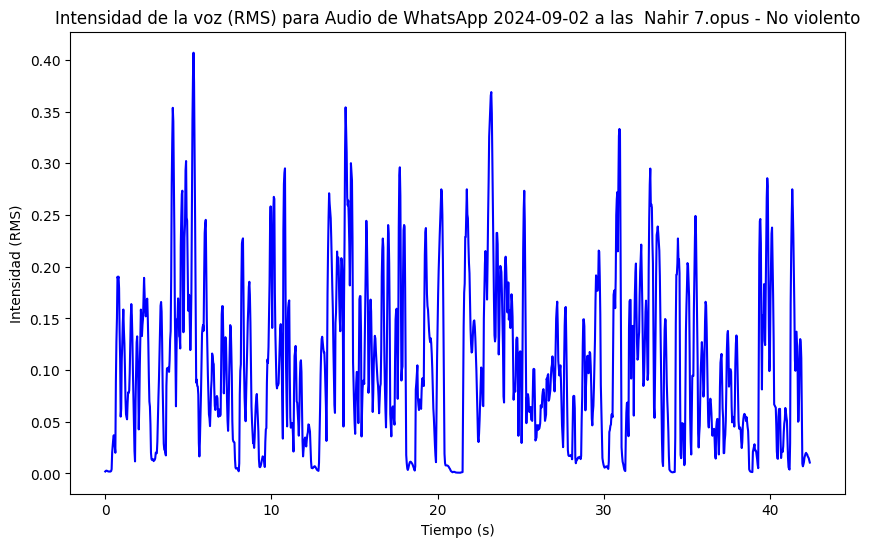

Intensidad promedio para Audio de WhatsApp 2024-09-02 a las  Nahir 7.opus (No violento): 0.10587025433778763
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-26 a las  Nahir 7.opus (Categoría: No violento)


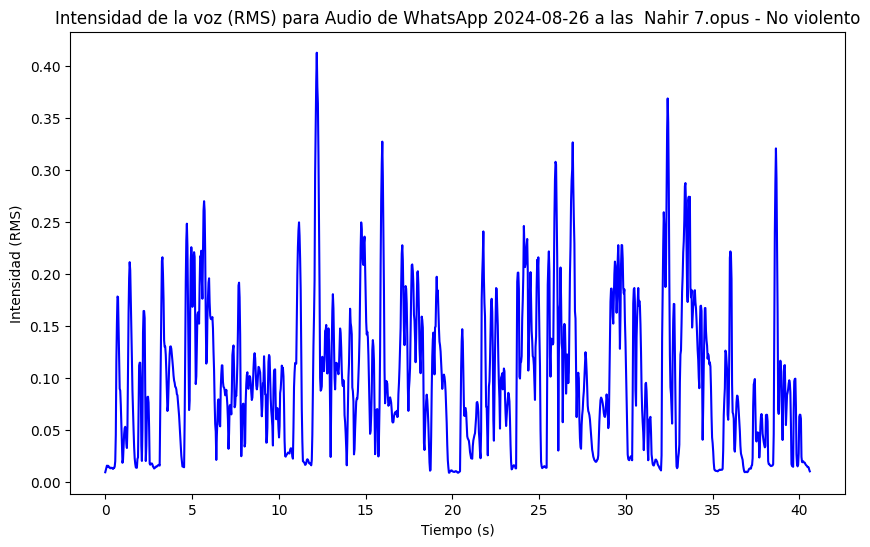

Intensidad promedio para Audio de WhatsApp 2024-08-26 a las  Nahir 7.opus (No violento): 0.09971089661121368
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-26 a las  Nahir 8.opus (Categoría: No violento)


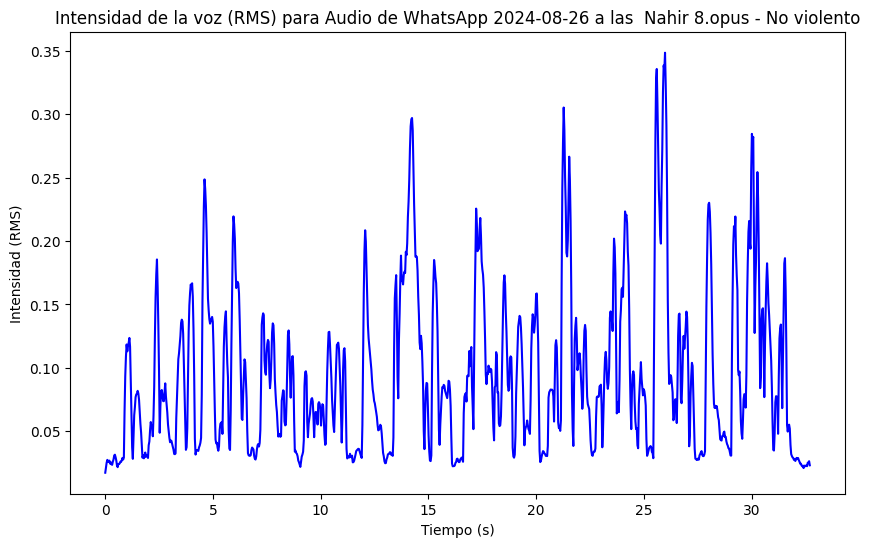

Intensidad promedio para Audio de WhatsApp 2024-08-26 a las  Nahir 8.opus (No violento): 0.09466385841369629
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-26 a las  Nahir 9.opus (Categoría: No violento)


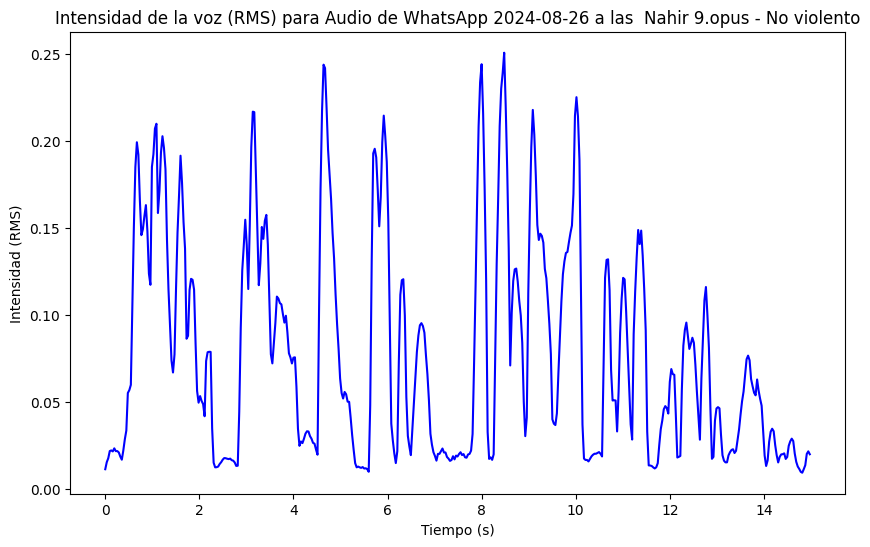

Intensidad promedio para Audio de WhatsApp 2024-08-26 a las  Nahir 9.opus (No violento): 0.07862573862075806
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-08-26 a las  Nahir 10.opus (Categoría: No violento)


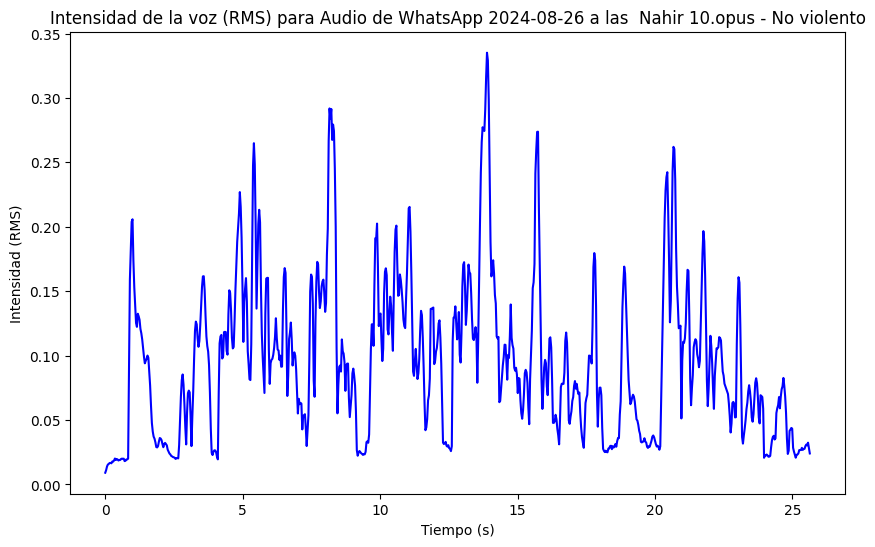

Intensidad promedio para Audio de WhatsApp 2024-08-26 a las  Nahir 10.opus (No violento): 0.09595239907503128


In [ ]:
def analizar_intensidad(ruta_audio, categoria):

    y, sr = librosa.load(ruta_audio, sr=None)

    rms = librosa.feature.rms(y=y)[0]

    tiempos = librosa.times_like(rms, sr=sr)

    plt.figure(figsize=(10, 6))
    plt.plot(tiempos, rms, color='b')
    plt.title(f'Intensidad de la voz (RMS) para {os.path.basename(ruta_audio)} - {categoria}')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Intensidad (RMS)')
    plt.show()

    intensidad_promedio = np.mean(rms)
    print(f"Intensidad promedio para {os.path.basename(ruta_audio)} ({categoria}): {intensidad_promedio}")

    return intensidad_promedio

directorio_audio = '/content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento'

for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.wav') or file.endswith('.opus'):
            ruta_audio = os.path.join(root, file)

            categoria = 'No violento'

            print(f"Analizando: {ruta_audio} (Categoría: {categoria})")
            intensidad = analizar_intensidad(ruta_audio, categoria)

In [ ]:
def analizar_intensidad(ruta_audio):
    # Cargar el archivo de audio
    y, sr = librosa.load(ruta_audio, sr=None)

    # Calcular el RMS (Root Mean Square) de la señal de audio (la intensidad)
    rms = librosa.feature.rms(y=y)[0]

    # Devolver la intensidad promedio del archivo
    intensidad_promedio = np.mean(rms)
    return intensidad_promedio

# Directorio específico que contiene los archivos de audio de la categoría "No violento"
directorio_audio = '/content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento'

# Lista para almacenar las intensidades promedio de cada archivo
intensidades_promedio = []

# Iterar sobre los archivos de la carpeta 'No violento'
for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.wav') or file.endswith('.opus'):  # Extensiones de audio soportadas
            ruta_audio = os.path.join(root, file)

            # Analizar la intensidad y agregar a la lista
            intensidad = analizar_intensidad(ruta_audio)
            intensidades_promedio.append(intensidad)

# Calcular el promedio de la intensidad de todos los archivos
if intensidades_promedio:
    promedio_general_intensidad = np.mean(intensidades_promedio)
    print(f"Intensidad promedio general para todos los audios: {promedio_general_intensidad}")
else:
    print("No se encontraron archivos de audio para analizar.")

Intensidad promedio general para todos los audios: 0.0791795402765274


In [ ]:
def analizar_intensidad(ruta_audio):
    y, sr = librosa.load(ruta_audio, sr=None)

    rms = librosa.feature.rms(y=y)[0]

    intensidad_promedio = np.mean(rms)
    return intensidad_promedio

directorio_audio = '/content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento'

intensidades_promedio = []

for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.wav') or file.endswith('.opus'):
            ruta_audio = os.path.join(root, file)

            intensidad = analizar_intensidad(ruta_audio)
            intensidades_promedio.append(intensidad)

if intensidades_promedio:
    promedio_general_intensidad = np.mean(intensidades_promedio)
    print(f"Intensidad promedio general para todos los audios: {promedio_general_intensidad}")
else:
    print("No se encontraron archivos de audio para analizar.")

Intensidad promedio general para todos los audios: 0.07725394517183304


## Frecuencia

Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.44.45_794804b9.wav.opus (Categoría: No violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.42.01_b0842299.wav.opus (Categoría: No violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.41.50_a42b47a8.wav.opus (Categoría: No violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.42.46_23bb57c8.wav.opus (Categoría: No violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.43.00_ede74938.wav.opus (Categoría: No violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.43.26_3e99c2c0.wav.opus (Categoría: No violento)
Analizando

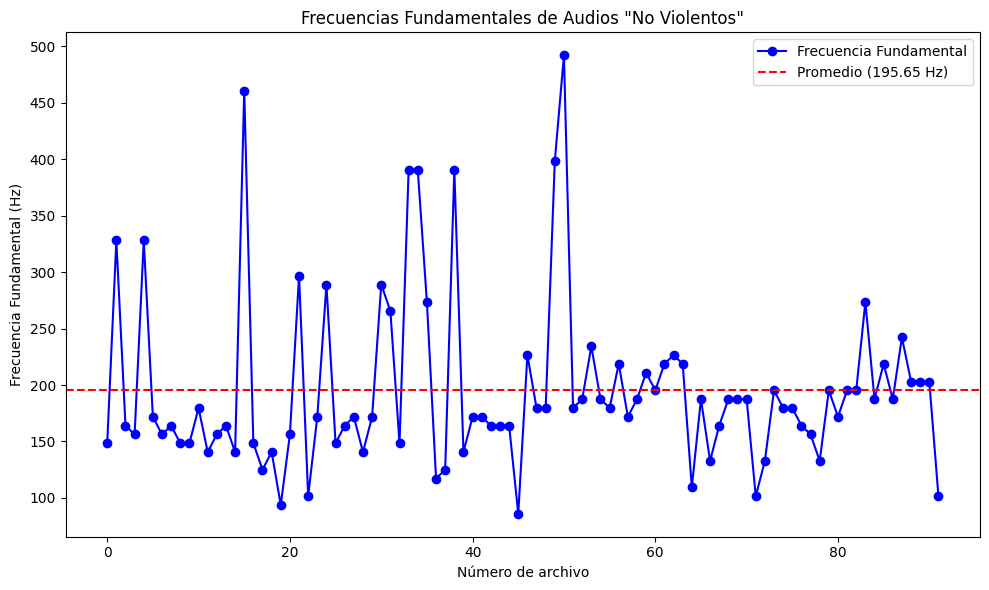

In [ ]:
def analizar_frecuencia(ruta_audio):
    # Cargar el archivo de audio
    y, sr = librosa.load(ruta_audio, sr=None)

    # Calcular la Transformada de Fourier para obtener el espectro de frecuencias
    stft = np.abs(librosa.stft(y))

    # Convertir amplitudes a escala de decibelios (dB) para analizar mejor las frecuencias dominantes
    db_stft = librosa.amplitude_to_db(stft, ref=np.max)

    # Obtener las frecuencias correspondientes a la STFT
    frecuencias = librosa.fft_frequencies(sr=sr, n_fft=2048)

    # Obtener la frecuencia dominante (frecuencia fundamental) como la frecuencia con mayor energía
    frecuencia_fundamental = frecuencias[np.argmax(np.mean(db_stft, axis=1))]

    return frecuencia_fundamental

# Directorio específico que contiene los archivos de audio de la categoría "No violento"
directorio_audio = '/content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento'

# Lista para almacenar las frecuencias fundamentales de cada archivo
frecuencias_fundamentales = []

# Iterar sobre los archivos de la carpeta 'No violento'
for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.opus'):  # Solo archivos .opus
            ruta_audio = os.path.join(root, file)

            print(f"Analizando: {ruta_audio} (Categoría: No violento)")

            # Analizar la frecuencia y agregarla a la lista
            frecuencia = analizar_frecuencia(ruta_audio)
            frecuencias_fundamentales.append(frecuencia)

# Calcular el promedio de la frecuencia fundamental de todos los archivos
if frecuencias_fundamentales:
    promedio_frecuencia_fundamental = np.mean(frecuencias_fundamentales)
    print(f"Frecuencia fundamental promedio para todos los audios 'No violentos': {promedio_frecuencia_fundamental} Hz")

    # Crear un gráfico con las frecuencias fundamentales
    plt.figure(figsize=(10, 6))
    plt.plot(frecuencias_fundamentales, marker='o', linestyle='-', color='b', label='Frecuencia Fundamental')
    plt.axhline(y=promedio_frecuencia_fundamental, color='r', linestyle='--', label=f'Promedio ({promedio_frecuencia_fundamental:.2f} Hz)')

    # Etiquetas y título del gráfico
    plt.title('Frecuencias Fundamentales de Audios "No Violentos"')
    plt.xlabel('Número de archivo')
    plt.ylabel('Frecuencia Fundamental (Hz)')
    plt.legend()

    # Mostrar el gráfico
    plt.tight_layout()
    plt.show()

else:
    print("No se encontraron archivos de audio para analizar.")

Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-09-27 a las 12.47.58_5c269ca3.wav.opus (Categoría: violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-07 a las 19.47.16_0cad6ee7.wav.opus (Categoría: violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-07 a las 19.47.27_954ef691.wav.opus (Categoría: violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-03 a las 12.41.29_6cca9dd1.wav.opus (Categoría: violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 1.opus (Categoría: violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/Audio de WhatsApp 2024-10-16 a las Fede 2.opus (Categoría: violento)
Analizando: /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento/A

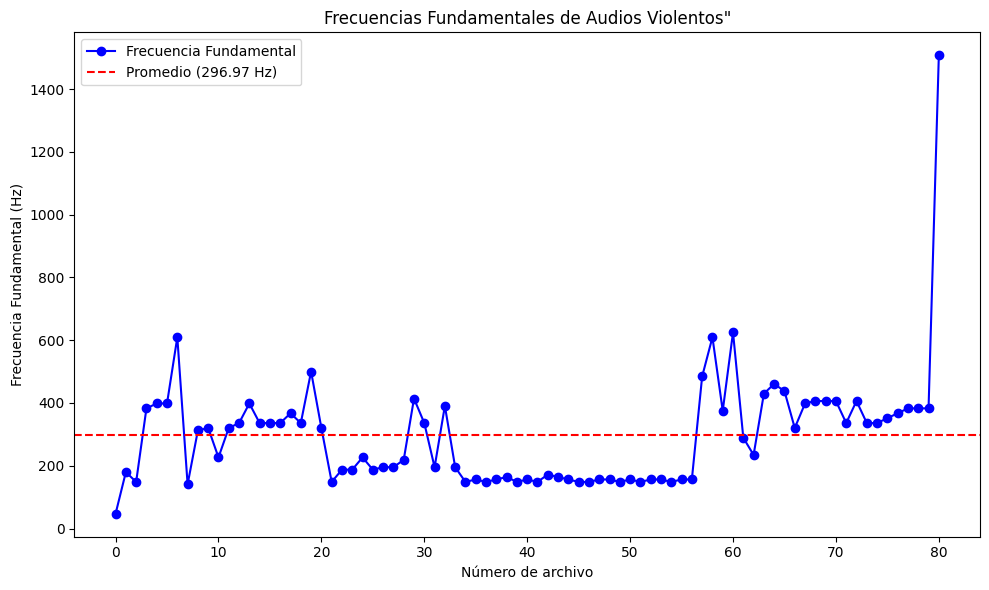

In [ ]:
def analizar_frecuencia(ruta_audio):
    y, sr = librosa.load(ruta_audio, sr=None)

    stft = np.abs(librosa.stft(y))

    db_stft = librosa.amplitude_to_db(stft, ref=np.max)

    frecuencias = librosa.fft_frequencies(sr=sr, n_fft=2048)

    frecuencia_fundamental = frecuencias[np.argmax(np.mean(db_stft, axis=1))]

    return frecuencia_fundamental

directorio_audio = '/content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/violento'

frecuencias_fundamentales = []

for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.opus'):
            ruta_audio = os.path.join(root, file)

            print(f"Analizando: {ruta_audio} (Categoría: violento)")

            frecuencia = analizar_frecuencia(ruta_audio)
            frecuencias_fundamentales.append(frecuencia)

if frecuencias_fundamentales:
    promedio_frecuencia_fundamental = np.mean(frecuencias_fundamentales)
    print(f"Frecuencia fundamental promedio para todos los audios 'No violentos': {promedio_frecuencia_fundamental} Hz")

    plt.figure(figsize=(10, 6))
    plt.plot(frecuencias_fundamentales, marker='o', linestyle='-', color='b', label='Frecuencia Fundamental')
    plt.axhline(y=promedio_frecuencia_fundamental, color='r', linestyle='--', label=f'Promedio ({promedio_frecuencia_fundamental:.2f} Hz)')

    plt.title('Frecuencias Fundamentales de Audios Violentos"')
    plt.xlabel('Número de archivo')
    plt.ylabel('Frecuencia Fundamental (Hz)')
    plt.legend()

    plt.tight_layout()
    plt.show()

else:
    print("No se encontraron archivos de audio para analizar.")

## MFCC

In [ ]:
def convertir_a_mfcc(ruta_audio, n_mfcc=13):
    # Cargar el archivo de audio
    y, sr = librosa.load(ruta_audio, sr=None)

    # Obtener los coeficientes MFCC
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)

    return mfcc

# Directorio que contiene los archivos de audio
directorio_audio = '/content/drive/MyDrive/PLN Palacios Lorenzo'
data = []

# Iterar sobre los archivos de la carpeta y subcarpetas
for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.wav') or file.endswith('.opus'):  # Extensiones de audio soportadas
            ruta_audio = os.path.join(root, file)
            print(f"Transformando {ruta_audio} a MFCC...")

            # Transformar el audio a MFCC
            mfcc = convertir_a_mfcc(ruta_audio)

            # Tomar el promedio de cada coeficiente a lo largo del tiempo (opcional pero común para simplificar los datos)
            mfcc_mean = np.mean(mfcc, axis=1)

            # Verificar el nombre exacto de la subcarpeta para asignar etiquetas correctamente
            if os.path.basename(root) == 'violento':
                etiqueta = 'Violento'
            elif os.path.basename(root) == 'No violento':
                etiqueta = 'No violento'
            else:
                etiqueta = 'Desconocido'

            # Agregar los valores de MFCC y la etiqueta como una fila en la lista de datos
            data.append(np.append(mfcc_mean, etiqueta))

# Convertir la lista de datos en un DataFrame
# Se crean tantas columnas como coeficientes MFCC más una columna para la etiqueta
columnas = [f'mfcc_{i}' for i in range(1, mfcc.shape[0] + 1)] + ['etiqueta']
df_audio_escalado = pd.DataFrame(data, columns=columnas)

# Mostrar el DataFrame resultante
df_audio_escalado

Transformando /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.44.45_794804b9.wav.opus a MFCC...
Transformando /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.42.01_b0842299.wav.opus a MFCC...
Transformando /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.41.50_a42b47a8.wav.opus a MFCC...
Transformando /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.42.46_23bb57c8.wav.opus a MFCC...
Transformando /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.43.00_ede74938.wav.opus a MFCC...
Transformando /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de WhatsApp 2024-09-28 a las 19.43.26_3e99c2c0.wav.opus a MFCC...
Transformando /content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln/No violento/Audio de

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,etiqueta
0,-226.99826,92.03977,17.76488,19.28151,-34.09031,-8.087274,-16.844465,-1.5693786,-17.225723,4.0790854,-10.154889,-6.4807086,-10.798829,No violento
1,-263.62714,112.25476,26.73243,21.981632,-18.946585,-18.28981,-17.456562,6.3312454,-29.221127,0.5244116,-9.344077,-10.002124,-5.5914927,No violento
2,-258.4727,108.80434,27.48278,36.635178,-11.161338,-17.712347,-29.830297,11.420557,-25.732546,-5.8169084,-5.3549304,-11.750976,-6.92669,No violento
3,-238.5754,100.67585,27.87431,29.26642,-18.710054,-12.160907,-13.411489,2.6857867,-24.452044,-7.537087,-11.719697,-12.2449875,-10.331839,No violento
4,-257.1751,111.96915,28.358646,19.204798,-22.040949,-13.183449,-15.810716,5.846755,-24.76842,9.461223,-12.51282,-6.4310794,-8.234464,No violento
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,-231.03218,101.97256,22.248865,34.011242,-8.025372,-15.12211,-22.363842,-15.958946,-8.016299,-17.77611,-9.637459,-6.2439494,-5.5409565,Violento
169,-231.87029,98.71517,24.87581,39.126545,-7.134805,-27.069698,-21.56784,-4.213399,-9.823425,-16.76341,-13.705637,-4.6395035,-8.501691,Violento
170,-239.11185,107.78886,14.679455,28.227245,-18.937704,-18.637077,-14.881286,-10.797323,-6.340992,-11.806869,-9.120503,-4.305395,-5.4226007,Violento
171,-258.67838,96.983574,15.0160055,28.155535,-11.666706,-16.44035,-15.120713,-11.244632,-10.628037,-11.032766,-10.203077,-5.7638583,-6.0079155,Violento


In [ ]:
# Convertir todas las columnas numéricas (excluyendo la columna 'etiqueta') a tipo float
for columna in df_audio_escalado.columns:
    if columna != 'etiqueta':  # Excluir la columna 'etiqueta' (que contiene texto)
        df_audio_escalado[columna] = pd.to_numeric(df_audio_escalado[columna], errors='coerce').astype(float)

# Mostrar el DataFrame resultante
df_audio_escalado

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,etiqueta
0,-226.99826,92.039770,17.764880,19.281510,-34.090310,-8.087274,-16.844465,-1.569379,-17.225723,4.079085,-10.154889,-6.480709,-10.798829,No violento
1,-263.62714,112.254760,26.732430,21.981632,-18.946585,-18.289810,-17.456562,6.331245,-29.221127,0.524412,-9.344077,-10.002124,-5.591493,No violento
2,-258.47270,108.804340,27.482780,36.635178,-11.161338,-17.712347,-29.830297,11.420557,-25.732546,-5.816908,-5.354930,-11.750976,-6.926690,No violento
3,-238.57540,100.675850,27.874310,29.266420,-18.710054,-12.160907,-13.411489,2.685787,-24.452044,-7.537087,-11.719697,-12.244988,-10.331839,No violento
4,-257.17510,111.969150,28.358646,19.204798,-22.040949,-13.183449,-15.810716,5.846755,-24.768420,9.461223,-12.512820,-6.431079,-8.234464,No violento
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,-231.03218,101.972560,22.248865,34.011242,-8.025372,-15.122110,-22.363842,-15.958946,-8.016299,-17.776110,-9.637459,-6.243949,-5.540957,Violento
169,-231.87029,98.715170,24.875810,39.126545,-7.134805,-27.069698,-21.567840,-4.213399,-9.823425,-16.763410,-13.705637,-4.639504,-8.501691,Violento
170,-239.11185,107.788860,14.679455,28.227245,-18.937704,-18.637077,-14.881286,-10.797323,-6.340992,-11.806869,-9.120503,-4.305395,-5.422601,Violento
171,-258.67838,96.983574,15.016006,28.155535,-11.666706,-16.440350,-15.120713,-11.244632,-10.628037,-11.032766,-10.203077,-5.763858,-6.007916,Violento


In [ ]:
df_audio_escalado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173 entries, 0 to 172
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mfcc_1    173 non-null    float64
 1   mfcc_2    173 non-null    float64
 2   mfcc_3    173 non-null    float64
 3   mfcc_4    173 non-null    float64
 4   mfcc_5    173 non-null    float64
 5   mfcc_6    173 non-null    float64
 6   mfcc_7    173 non-null    float64
 7   mfcc_8    173 non-null    float64
 8   mfcc_9    173 non-null    float64
 9   mfcc_10   173 non-null    float64
 10  mfcc_11   173 non-null    float64
 11  mfcc_12   173 non-null    float64
 12  mfcc_13   173 non-null    float64
 13  etiqueta  173 non-null    object 
dtypes: float64(13), object(1)
memory usage: 19.0+ KB


# Estado final del DataFrame

In [ ]:
df_audio_escalado['etiqueta'] = df_audio_escalado['etiqueta'].map({'Violento': 1, 'No violento': 0})
df_audio_escalado

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,etiqueta
0,-226.99826,92.039770,17.764880,19.281510,-34.090310,-8.087274,-16.844465,-1.569379,-17.225723,4.079085,-10.154889,-6.480709,-10.798829,0
1,-263.62714,112.254760,26.732430,21.981632,-18.946585,-18.289810,-17.456562,6.331245,-29.221127,0.524412,-9.344077,-10.002124,-5.591493,0
2,-258.47270,108.804340,27.482780,36.635178,-11.161338,-17.712347,-29.830297,11.420557,-25.732546,-5.816908,-5.354930,-11.750976,-6.926690,0
3,-238.57540,100.675850,27.874310,29.266420,-18.710054,-12.160907,-13.411489,2.685787,-24.452044,-7.537087,-11.719697,-12.244988,-10.331839,0
4,-257.17510,111.969150,28.358646,19.204798,-22.040949,-13.183449,-15.810716,5.846755,-24.768420,9.461223,-12.512820,-6.431079,-8.234464,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,-231.03218,101.972560,22.248865,34.011242,-8.025372,-15.122110,-22.363842,-15.958946,-8.016299,-17.776110,-9.637459,-6.243949,-5.540957,1
169,-231.87029,98.715170,24.875810,39.126545,-7.134805,-27.069698,-21.567840,-4.213399,-9.823425,-16.763410,-13.705637,-4.639504,-8.501691,1
170,-239.11185,107.788860,14.679455,28.227245,-18.937704,-18.637077,-14.881286,-10.797323,-6.340992,-11.806869,-9.120503,-4.305395,-5.422601,1
171,-258.67838,96.983574,15.016006,28.155535,-11.666706,-16.440350,-15.120713,-11.244632,-10.628037,-11.032766,-10.203077,-5.763858,-6.007916,1


## Marchine Learning

In [ ]:
y = df_audio_escalado['etiqueta']
x = df_audio_escalado.drop(['etiqueta'], axis = 1)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=123)
X_val_train, X_val_test, y_val_train, y_val_test = train_test_split(x_train, y_train, test_size=0.25, random_state=42)
transformer = Normalizer().fit(x_train)
x = pd.DataFrame(transformer.transform(x), columns=x.columns)
x

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13
0,-0.905997,0.367350,0.070903,0.076956,-0.136061,-0.032278,-0.067230,-0.006264,-0.068751,0.016280,-0.040530,-0.025866,-0.043100
1,-0.902064,0.384107,0.091472,0.075216,-0.064830,-0.062583,-0.059732,0.021664,-0.099987,0.001794,-0.031973,-0.034225,-0.019133
2,-0.896560,0.377408,0.095329,0.127076,-0.038715,-0.061439,-0.103472,0.039614,-0.089258,-0.020177,-0.018575,-0.040760,-0.024027
3,-0.899030,0.379379,0.105039,0.110285,-0.070506,-0.045826,-0.050539,0.010121,-0.092143,-0.028402,-0.044164,-0.046143,-0.038934
4,-0.899402,0.391583,0.099177,0.067164,-0.077082,-0.046106,-0.055294,0.020447,-0.086621,0.033088,-0.043760,-0.022491,-0.028798
...,...,...,...,...,...,...,...,...,...,...,...,...,...
168,-0.892443,0.393905,0.085944,0.131380,-0.031001,-0.058414,-0.086388,-0.061647,-0.030966,-0.068667,-0.037228,-0.024119,-0.021404
169,-0.891915,0.379719,0.095688,0.150505,-0.027445,-0.104127,-0.082963,-0.016207,-0.037787,-0.064482,-0.052720,-0.017846,-0.032703
170,-0.896362,0.404070,0.055029,0.105816,-0.070992,-0.069865,-0.055786,-0.040476,-0.023771,-0.044261,-0.034190,-0.016140,-0.020328
171,-0.923215,0.346131,0.053592,0.100486,-0.041638,-0.058675,-0.053965,-0.040132,-0.037931,-0.039376,-0.036414,-0.020571,-0.021442


In [ ]:
x_train, x_test, y_train, y_test = train_test_split( x, y, test_size=0.30, random_state=123)

In [ ]:
skfold_outer = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)
skfold_inner = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

In [ ]:
param_grid_rf = {
    'max_depth': [8, 10, 40, 20],
    'n_estimators': [15, 20, 8]
}

model_rf = RandomForestClassifier(random_state=123)

grid_search_rf = GridSearchCV(
    estimator=model_rf,
    param_grid=param_grid_rf,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

nested_cv_rf = cross_validate(grid_search_rf, X=x_train, y=y_train, cv=skfold_outer, return_train_score=True)

result_cv_rf = pd.DataFrame(nested_cv_rf)

mean_test_score_rf = result_cv_rf['test_score'].mean()
std_test_score_rf = result_cv_rf['test_score'].std()
median_test_score_rf = result_cv_rf['test_score'].median()

print("Promedio del test_score: ", mean_test_score_rf)
print("Desviación estándar del test_score: ", std_test_score_rf)
print("Mediana del test_score: ", median_test_score_rf)

Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Fitting 10 folds for each of 12 candidates, totalling 120 fits
Promedio del test_score:  0.851923076923077
Desviación estándar del test_score:  0.07398533200597587
Mediana del test_score:  0.8333333333333334


In [ ]:
param_grid_lr = {
    'C': [1.0, 2.0, 3.0, 4.0],
    'max_iter': [10, 8, 19, 25]
}

model_lr = LogisticRegression(penalty='l2', solver='liblinear', multi_class='ovr', random_state=123)

grid_search_lr = GridSearchCV(
    estimator=model_lr,
    param_grid=param_grid_lr,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)



nested_cv_lr = cross_validate(grid_search_lr, X=x_train, y=y_train, cv=skfold_outer, return_train_score=True)

result_cv_lr = pd.DataFrame(nested_cv_lr)

mean_test_score_lr = result_cv_lr['test_score'].mean()
std_test_score_lr = result_cv_lr['test_score'].std()
median_test_score_lr = result_cv_lr['test_score'].median()

print("Promedio del test_score: ", mean_test_score_lr)
print("Desviación estándar del test_score: ", std_test_score_lr)
print("Mediana del test_score: ", median_test_score_lr)

Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Fitting 10 folds for each of 16 candidates, totalling 160 fits
Promedio del test_score:  0.6615384615384615
Desviación estándar del test_score:  0.08022358995047735
Mediana del test_score:  0.641025641025641


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
param_grid_knn = {
    'n_neighbors': [120, 100, 80, 50, 25, 12, 6, 10, 7, 8, 9]
}

model_knn = KNeighborsClassifier()

grid_search_knn = GridSearchCV(
    estimator=model_knn,
    param_grid=param_grid_knn,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

nested_cv_knn = cross_validate(grid_search_knn, X=x_train, y=y_train, cv=skfold_outer, return_train_score=True)

result_cv_knn = pd.DataFrame(nested_cv_knn)

mean_test_score_knn = result_cv_knn['test_score'].mean()
std_test_score_knn = result_cv_knn['test_score'].std()
median_test_score_knn = result_cv_knn['test_score'].median()

print("Promedio del test_score: ", mean_test_score_knn)
print("Desviación estándar del test_score: ", std_test_score_knn)
print("Mediana del test_score: ", median_test_score_knn)

Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.55636364 0.56636364 0.67545455 0.82454545
 0.87181818 0.83454545 0.87909091 0.83363636 0.82454545]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.55090909 0.53181818 0.66090909 0.81636364
 0.88181818 0.82636364 0.85454545 0.88181818 0.81727273]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.55090909 0.56909091 0.70636364 0.84363636
 0.84454545 0.84363636 0.83454545 0.84454545 0.83454545]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.55090909 0.52363636 0.67090909 0.80727273
 0.89909091 0.80727273 0.88090909 0.86272727 0.87090909]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.56       0.55       0.69       0.82636364
 0.88090909 0.82636364 0.86272727 0.84454545 0.80818182]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.55090909 0.52636364 0.73545455 0.80909091
 0.88181818 0.82727273 0.84545455 0.82727273 0.80909091]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.55090909 0.52454545 0.68090909 0.83636364
 0.88090909 0.82636364 0.88090909 0.87181818 0.82636364]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.56       0.58818182 0.61636364 0.79818182
 0.86363636 0.83545455 0.88181818 0.86272727 0.84545455]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.57       0.52272727 0.65090909 0.80636364
 0.86090909 0.78727273 0.85181818 0.83363636 0.82454545]
  warnings.warn(


Fitting 10 folds for each of 11 candidates, totalling 110 fits
Promedio del test_score:  0.9006410256410255
Desviación estándar del test_score:  0.03553053236819632
Mediana del test_score:  0.9166666666666666


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.56       0.56909091 0.67181818 0.8
 0.85363636 0.79       0.87181818 0.86272727 0.84454545]
  warnings.warn(


In [ ]:
param_grid_xgb = {
    'n_estimators': [15, 10, 20],
    'max_depth': [5, 10, 20],
    'learning_rate': [0.1, 0.2, 0.3]
}

model_xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False)

grid_search_xgb = GridSearchCV(
    estimator=model_xgb,
    param_grid=param_grid_xgb,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)



nested_cv_xgb = cross_validate(grid_search_xgb, X=x_train, y=y_train, cv=skfold_outer, return_train_score=True)

result_cv_xgb = pd.DataFrame(nested_cv_xgb)

mean_test_score_xgb = result_cv_xgb['test_score'].mean()
std_test_score_xgb = result_cv_xgb['test_score'].std()
median_test_score_xgb = result_cv_xgb['test_score'].median()

print("Promedio del test_score: ", mean_test_score_xgb)
print("Desviación estándar del test_score: ", std_test_score_xgb)
print("Mediana del test_score: ", median_test_score_xgb)

Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:07:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:07:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:07:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:07:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:08:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:08:15] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:08:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:08:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:08:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Fitting 10 folds for each of 27 candidates, totalling 270 fits
Promedio del test_score:  0.8346153846153846
Desviación estándar del test_score:  0.10401396872872683
Mediana del test_score:  0.8333333333333334


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [16:08:49] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [ ]:
import lightgbm as lgb

# Parámetros para LightGBM
param_grid_lgbm = {
    'n_estimators': [15, 10, 20],
    'max_depth': [-1],
    'learning_rate': [0.1, 0.2, 0.3]
}

# Definir el modelo LGBMClassifier
model_lgbm = lgb.LGBMClassifier(objective='binary', metric='binary_logloss', boosting_type='gbdt')

# Configurar la búsqueda en cuadrícula con validación cruzada
grid_search_lgbm = GridSearchCV(
    estimator=model_lgbm,
    param_grid=param_grid_lgbm,
    cv=skfold_inner,  # Suponiendo que skfold_inner ya está definido
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Realizar la validación cruzada anidada con cross_validate
nested_cv_lgbm = cross_validate(grid_search_lgbm, X=x_train, y=y_train, cv=skfold_outer, return_train_score=True)

# Convertir los resultados a DataFrame para un análisis más fácil
result_cv_lgbm = pd.DataFrame(nested_cv_lgbm)

# Calcular estadísticas del test_score
mean_test_score_lgbm = result_cv_lgbm['test_score'].mean()
std_test_score_lgbm = result_cv_lgbm['test_score'].std()
median_test_score_lgbm = result_cv_lgbm['test_score'].median()

# Imprimir los resultados
print("Promedio del test_score: ", mean_test_score_lgbm)
print("Desviación estándar del test_score: ", std_test_score_lgbm)
print("Mediana del test_score: ", median_test_score_lgbm)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 48, number of negative: 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 491
[LightGBM] [Info] Number of data points in the train set: 108, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444444 -> initscore=-0.223144
[LightGBM] [Info] Start training from score -0.223144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 49, number of negative: 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 491
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.449541 -> initscore=-0.202524
[LightGBM] [Info] Start training from score -0.202524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 49, number of negative: 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.449541 -> initscore=-0.202524
[LightGBM] [Info] Start training from score -0.202524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 49, number of negative: 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.449541 -> initscore=-0.202524
[LightGBM] [Info] Start training from score -0.202524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 49, number of negative: 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 491
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.449541 -> initscore=-0.202524
[LightGBM] [Info] Start training from score -0.202524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 49, number of negative: 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 491
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.449541 -> initscore=-0.202524
[LightGBM] [Info] Start training from score -0.202524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 49, number of negative: 60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.449541 -> initscore=-0.202524
[LightGBM] [Info] Start training from score -0.202524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 48, number of negative: 61
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 493
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.440367 -> initscore=-0.239673
[LightGBM] [Info] Start training from score -0.239673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 48, number of negative: 61
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000067 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 489
[LightGBM] [Info] Number of data points in the train set: 109, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.440367 -> initscore=-0.239673
[LightGBM] [Info] Start training from score -0.239673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


# Analisis del rendimiento de los modelos

In [ ]:
results_dict = {
    'Modelo': ['KNN','Random Forest','Regresión Logística', 'lightgbm','XGBoost'],
    'Promedio': [mean_test_score_knn, mean_test_score_rf,mean_test_score_lr, mean_test_score_lgbm, mean_test_score_xgb],
    'Desviación Estándar': [std_test_score_knn, std_test_score_rf, std_test_score_lr, std_test_score_lgbm, std_test_score_xgb]
}

df = pd.DataFrame(results_dict)

df_sorted = df.sort_values(by='Promedio', ascending=False)

df_sorted

,Modelo,Promedio,Desviación Estándar
0,KNN,0.900641,0.035531
3,lightgbm,0.858974,0.079607
1,Random Forest,0.851923,0.073985
4,XGBoost,0.834615,0.104014
2,Regresión Logística,0.661538,0.080224


# Mejor modelo

## KNN

In [ ]:
param_grid_knn = {
    'n_neighbors': [120, 100, 80, 50, 25, 12, 6, 10, 7, 8, 9]
}

model_knn = KNeighborsClassifier()

grid_search_knn = GridSearchCV(
    estimator=model_knn,
    param_grid=param_grid_knn,
    cv=skfold_inner,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

nested_cv_knn = cross_validate(grid_search_knn, X=x, y=y, cv=skfold_outer, return_train_score=True)

result_cv_knn = pd.DataFrame(nested_cv_knn)

mean_test_score_knn = result_cv_knn['test_score'].mean()
std_test_score_knn = result_cv_knn['test_score'].std()
median_test_score_knn = result_cv_knn['test_score'].median()

print("Promedio del test_score: ", mean_test_score_knn)
print("Desviación estándar del test_score: ", std_test_score_knn)
print("Mediana del test_score: ", median_test_score_knn)

Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Fitting 10 folds for each of 11 candidates, totalling 110 fits
Promedio del test_score:  0.8911764705882353
Desviación estándar del test_score:  0.0724224756221916
Mediana del test_score:  0.9150326797385621


# Analisis de rendimiento del mejor modelo

In [ ]:
algoritmo_elegido = grid_search_knn
algoritmo_elegido.fit(x, y)

elegido_resultados = pd.DataFrame(algoritmo_elegido.cv_results_).loc[algoritmo_elegido.best_index_]

elegido_promedio = elegido_resultados.mean_test_score
elegido_desvio = elegido_resultados.std_test_score

parametros = algoritmo_elegido.best_params_

print('AC: ', elegido_promedio*100, " +/- ", 2*elegido_desvio*100, " (95%)")
print ("Los mejores hiperparametros del modelo elegido son: ",algoritmo_elegido.best_params_)

Fitting 10 folds for each of 11 candidates, totalling 110 fits
AC:  90.84967320261438  +/-  12.575543863905972  (95%)
Los mejores hiperparametros del modelo elegido son:  {'n_neighbors': 7}


## Matriz de confusion

Fitting 10 folds for each of 11 candidates, totalling 110 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:1103: UserWarning: One or more of the test scores are non-finite: [       nan 0.55384615 0.56153846 0.55448718 0.6775641  0.82628205
 0.90897436 0.82564103 0.88397436 0.84294872 0.84358974]
  warnings.warn(


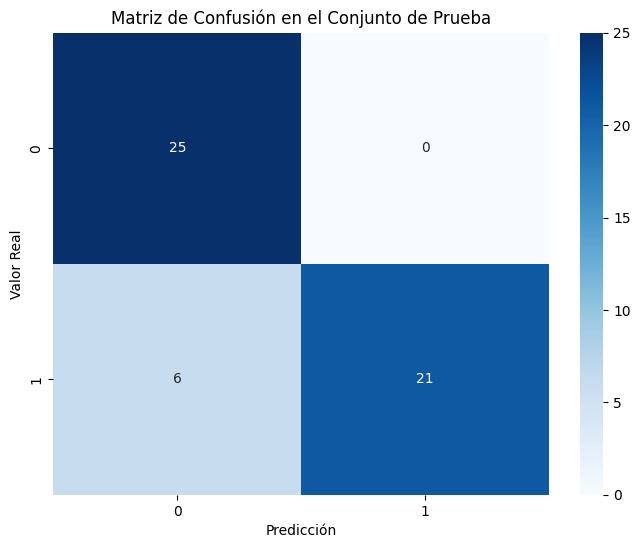

In [ ]:
grid_search_knn.fit(x_train, y_train)

y_pred_test = grid_search_knn.predict(x_test)

matriz_confusion_test = confusion_matrix(y_test, y_pred_test)

# Paso 5: Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion_test, annot=True, fmt='d', cmap='Blues')
plt.title('Matriz de Confusión en el Conjunto de Prueba')
plt.xlabel('Predicción')
plt.ylabel('Valor Real')
plt.show()

# Curvas de aprendizaje

[learning_curve] Training set sizes: [ 15  31  46  62  77  93 108 124 139 155]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of 100 | elapsed:    1.1s remaining:    1.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.9s finished


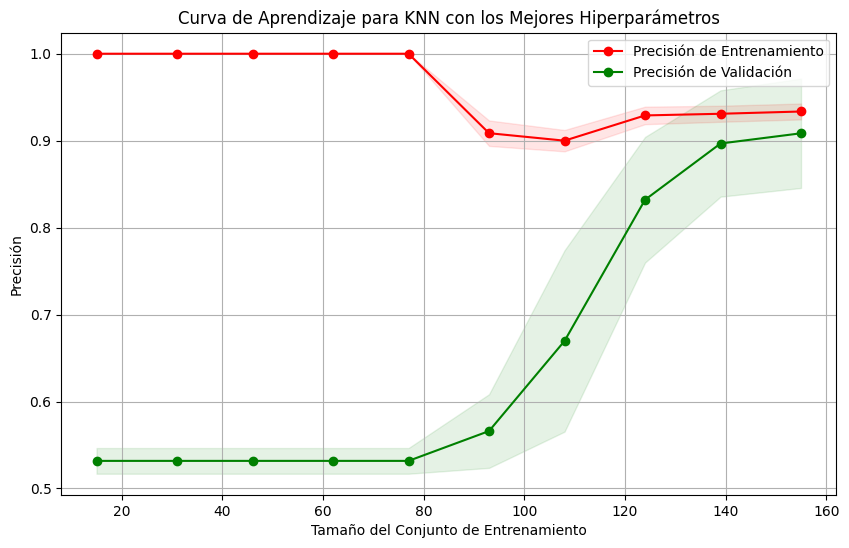

In [ ]:
best_model_knn = algoritmo_elegido.best_estimator_

train_sizes, train_scores, test_scores = learning_curve(
    estimator=best_model_knn,
    X=x,
    y=y,
    cv=skfold_outer,
    scoring='accuracy',
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10),
    verbose=2
)

train_scores_mean = train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
test_scores_mean = test_scores.mean(axis=1)
test_scores_std = test_scores.std(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Precisión de Entrenamiento")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Precisión de Validación")

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.title("Curva de Aprendizaje para KNN con los Mejores Hiperparámetros")
plt.xlabel("Tamaño del Conjunto de Entrenamiento")
plt.ylabel("Precisión")
plt.legend(loc="best")
plt.grid()
plt.show()

# Se guarda el mejor modelo

In [ ]:
filename = '/content/drive/My Drive/knn_PLN_entrenado_entrenamiento_finalizado_audio.sav'
joblib.dump(best_model_knn, filename)

['/content/drive/My Drive/knn_PLN_entrenado_entrenamiento_finalizado_audio.sav']

# Analisis de sentimiento

## Whiper

Se importa el modelo (Whisper) de transcripcion de audio a texto

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = whisper.load_model("medium", device=device)

100%|█████████████████████████████████████| 1.42G/1.42G [00:16<00:00, 91.5MiB/s]
/usr/local/lib/python3.10/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

## Transcripcion de los audios

In [ ]:
def cargar_audios_en_dataframe(base_path):
    # Lista para almacenar la información de los archivos
    data = []

    # Definir los nombres de las carpetas
    categorias = ["No violento", "violento"]

    # Iterar sobre cada categoría
    for categoria in categorias:
        # Obtener la ruta completa de la carpeta
        carpeta_path = os.path.join(base_path, categoria)

        # Asegurarse de que la carpeta existe
        if os.path.exists(carpeta_path):
            # Iterar sobre cada archivo en la carpeta
            for archivo in os.listdir(carpeta_path):
                # Obtener la ruta completa del archivo
                archivo_path = os.path.join(carpeta_path, archivo)

                # Verificar que sea un archivo y no un directorio
                if os.path.isfile(archivo_path):
                    # Agregar el archivo y su categoría a la lista
                    data.append({"ruta_audio": archivo_path, "categoria": categoria})
        else:
            print(f"La carpeta {categoria} no existe en la ruta especificada.")

    # Convertir la lista a un DataFrame
    df_audios = pd.DataFrame(data)

    return df_audios


def transcribir_audios(df, model):
    # Crear una lista para almacenar las transcripciones
    transcripciones = []

    # Iterar sobre cada fila del DataFrame
    for index, row in df.iterrows():
        # Obtener la ruta del archivo de audio
        ruta_audio = row['ruta_audio']

        try:
            # Transcribir el archivo de audio usando Whisper AI
            resultado = model.transcribe(ruta_audio)

            # Almacenar la transcripción en la lista
            transcripciones.append(resultado['text'])

        except Exception as e:
            # En caso de error, almacenar una transcripción vacía o el mensaje de error
            transcripciones.append(f"Error: {str(e)}")

    # Añadir la columna 'transcripcion' al DataFrame
    df['transcripcion'] = transcripciones

    return df

# Especifica aquí la ruta donde se encuentran las carpetas de audio
ruta_base = '/content/drive/MyDrive/PLN Palacios Lorenzo/audio_pln'

# Cargar los audios en el DataFrame
df_audios = cargar_audios_en_dataframe(ruta_base)

# Asume que el modelo de Whisper AI ya ha sido cargado como 'model'
df_audios = transcribir_audios(df_audios, model)

# Mostrar el DataFrame con las transcripciones
df_audios

/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:126: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/

,ruta_audio,categoria,transcripcion
0,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Hola, quisiera saber sobre las empanadas si s..."
1,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Hola, ¿cómo está? Che, buenísimo este fin de ..."
2,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Amigo, ¿cómo andás? ¿Todo bien? Espero que te..."
3,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Bueno, como andas todo bien, espero que te en..."
4,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Google comanda, ¿todo bien? Che, quería saber..."
...,...,...,...
168,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,Pero vos quien te pensas que sos? Quien te pe...
169,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,y la seguís y la seguís y la seguís y la segu...
170,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,"Pero qué abogado ni qué abogado, no me intere..."
171,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,Así que que no te cruces en la calle porque a...


In [ ]:
df_audios.to_csv('/content/drive/MyDrive/df_audios.csv', index=False)

In [ ]:
df_audios = pd.read_csv('/content/drive/MyDrive/df_audios.csv')
df_audios

,ruta_audio,categoria,transcripcion
0,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Hola, quisiera saber sobre las empanadas si s..."
1,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Hola, ¿cómo está? Che, buenísimo este fin de ..."
2,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Amigo, ¿cómo andás? ¿Todo bien? Espero que te..."
3,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Bueno, como andas todo bien, espero que te en..."
4,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,No violento,"Google comanda, ¿todo bien? Che, quería saber..."
...,...,...,...
168,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,Pero vos quien te pensas que sos? Quien te pe...
169,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,y la seguís y la seguís y la seguís y la segu...
170,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,"Pero qué abogado ni qué abogado, no me intere..."
171,/content/drive/MyDrive/PLN Palacios Lorenzo/au...,violento,Así que que no te cruces en la calle porque a...


# DataFrame Audio a texto

Se presenta el DataFrame resultante, luego de haber transcripto los audios a texto

In [ ]:
df_audios = df_audios.drop(['ruta_audio'], axis = 1)
df_audios['categoria'] = df_audios['categoria'].map({'violento': 1, 'No violento': 0})
df_audios

,categoria,transcripcion
0,0,"Hola, quisiera saber sobre las empanadas si s..."
1,0,"Hola, ¿cómo está? Che, buenísimo este fin de ..."
2,0,"Amigo, ¿cómo andás? ¿Todo bien? Espero que te..."
3,0,"Bueno, como andas todo bien, espero que te en..."
4,0,"Google comanda, ¿todo bien? Che, quería saber..."
...,...,...
168,1,Pero vos quien te pensas que sos? Quien te pe...
169,1,y la seguís y la seguís y la seguís y la segu...
170,1,"Pero qué abogado ni qué abogado, no me intere..."
171,1,Así que que no te cruces en la calle porque a...


In [ ]:
df_audios.isnull().sum()

,0
categoria,0
transcripcion,1


In [ ]:
df_audios = df_audios.dropna()

In [ ]:
df_audios.isnull().sum()

,0
categoria,0
transcripcion,0


# Ortografia

Se detectan las palabras que presentan errores de ortografia

In [ ]:
spell = SpellChecker(language='es')

def check_transcription(text):
    words = text.split()
    misspelled_words = spell.unknown(words)
    return list(misspelled_words)
df_audios['palabras_mal_transcritas'] = df_audios['transcripcion'].apply(check_transcription)

df_audios_con_errores = df_audios[df_audios['palabras_mal_transcritas'].apply(lambda x: len(x) > 0)] #filtra el DataFrame para que solo queden las filas donde hay palabras "mal transcritas"

df_audios_con_errores[['categoria', 'transcripcion', 'palabras_mal_transcritas']]

<ipython-input-14-530bb7052901>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_audios['palabras_mal_transcritas'] = df_audios['transcripcion'].apply(check_transcription)


,categoria,transcripcion,palabras_mal_transcritas
0,0,"Hola, quisiera saber sobre las empanadas si s...","[quisiera, hola,, siguen, promo, empanadas, es..."
1,0,"Hola, ¿cómo está? Che, buenísimo este fin de ...","[hola,, espero, todo., buenísimo, che,, repita..."
2,0,"Amigo, ¿cómo andás? ¿Todo bien? Espero que te...","[espero, bien., ¿todo, encuentres, ¿cómo, bien..."
3,0,"Bueno, como andas todo bien, espero que te en...","[bueno,, espero, semana,, encuentres, posible...."
4,0,"Google comanda, ¿todo bien? Che, quería saber...","[quería, comanda,, ¿todo, che,, cupada., vas, ..."
...,...,...,...
168,1,Pero vos quien te pensas que sos? Quien te pe...,"[hice, creer,, sos?, no,, venís, vas, pensas, ..."
169,1,y la seguís y la seguís y la seguís y la segu...,"[seguís, voy, dije,, pagar,, vez,, atenerte, a..."
170,1,"Pero qué abogado ni qué abogado, no me intere...","[equivocada., interesa,, van, no,, mí,, qué, p..."
171,1,Así que que no te cruces en la calle porque a...,"[cuídate,, ajá..., cuídate., cruces, cruzo...]"


In [ ]:
todas_las_palabras_mal_escritas = list(itertools.chain.from_iterable(df_audios['palabras_mal_transcritas'])) #es una función que "aplana" una lista.

lista_palabras_mal_escritas = list(set(todas_las_palabras_mal_escritas))

print(lista_palabras_mal_escritas)

['enojar.', 'resolver.', 'jode,', 'estaban', 'horto,', 'onigable', 'desaprobarme.', 'sacando', 'bus', 'cargaba', 'olvídate,', 'sos!', 'escuchame', 'explicarlas', 'refiero', 'duele', 'hice', 'estoy', 'discuta', 'teóricamente,', 'ganzada', 'pongo.', 'dónde', 'contratan', 'escuchá,', 'intentando', 'pasen', 'pastillas', 'crachos', 'puntos', 'seguís,', 'policía.', 'puedo', 'falta.', 'momentos', 'rees', 'materia,', 'chatbot', '¿vas', 'deberías', 'ir.', 'detectores', 'audio.', 'liquido', 'arrepiento', 'pelotudas,', 'odie', 'tomo,', 'llegues.', 'ejemplo,', 'cinco.', 'algunos', 'chances', 'pasantes', 'abogados,', '¿cómo', 'seguís', 'tenes', 'comandado?', 'crees', 'mejor.', 'contéstame.', 'sácame', 'salsa.', 'ocho,', 'pidiendo', 'pienses', 'abrí', 'duele,', 'querés,', 'listo,', 'vocaciones', 'capacidades', 'bosta.', 'traigas', 'recibido', 'siguen', 'repartinada', 'mira.', 're...', 'rendimos', 'reír', 'cicatrices', 'hey,', 'han', 'naranjas.', 'quedamos?', 'atrapada,', 'subir.', 'allá.', 'agregarl

# Correcion ortografica

Se corrije todas aquellas palabras que se transcribeieron con erroes de ortografia

In [ ]:
def reemplazar_palabras(texto):
    reemplazos = {
        "pongo": "pingo",
        "pajete": "pajero",
        "b" : "",
        "rees": "",
        "cagapalos": "cagar a palos",
        "culio": "culiau",
        "pinchile": "pinchila",
        "1": "uno",
        "4": "cuatro",
        "t***.": "",
        "65-70%.": "sesenta y cinco o setenta por ciento",
        "estupia?": "estupida",
        "laberahí": "",
        "culiazo": "culiau",
        "ytchusangul": "",
        "8.25.": "ocho coma cinco",
        "basurí": "basura",
        "yacá": "y aca",
        "bogada": "abogada",
        "comandas?": "como andas",
        "gulevar": "googlear",
        "asocinen": "asocien",
        "carrospaz": "Carlos Paz",
        "gasparo" :"Gaspar",
        "inserible": "inservible",
        "l": "",
        "culio": "culiau",
        "salpedo": "al pedo",
        "cupada": "ocupada",
        "comanda": "Como anda",
        "ien": "bien",
        "ago": "algo",
        "vaes": "vale",
        "ueno": "bueno",
        "curio": "",
        "a": "la",
        "e": "el",
        "ugar": "lugar",
        "mandae ": "mandale",
        "haaa": "hablaban",
        "traajado": "trabajado",
        "ueno": "bueno",
        "saés ": "sabes",
        "cremared": "que me pario",
        "igua": "igual",
        "Ae": "Ale",
        "evare": "",
        "ago": "algo",
        "proema": "problema",
        "conojo": "conozco",
        "egar": "llegar",
        "dee": "debe",
        "peícua": "pelicula",
        "cipua": "",
        "gorduda": "boluda",
        "aejaste": "alejaste",
        "ea": "esa",
        "uchando": "luchando",
        "amistaa": "amistad",
        "abogaduchito": "",
        "abrenzada": ""
    }

    texto = texto.lower()
    texto = re.sub(r'\s+', ' ', texto).strip()

    for palabra, reemplazo in reemplazos.items():
        texto = re.sub(r'\b' + re.escape(palabra) + r'\b', reemplazo, texto) #utiliza una expresión regular para buscar la palabra exacta (\b asegura que sea una palabra completa) y la reemplaza por el valor correspondiente (reemplazo).

    return texto

df_audios['transcripcion_corregida'] = df_audios['transcripcion'].apply(reemplazar_palabras)

<ipython-input-16-4b1c38202a53>:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_audios['transcripcion_corregida'] = df_audios['transcripcion'].apply(reemplazar_palabras)


In [ ]:
df_audios

,categoria,transcripcion,palabras_mal_transcritas,transcripcion_corregida
0,0,"Hola, quisiera saber sobre las empanadas si s...","[quisiera, hola,, siguen, promo, empanadas, es...","hola, quisiera saber sobre las empanadas si si..."
1,0,"Hola, ¿cómo está? Che, buenísimo este fin de ...","[hola,, espero, todo., buenísimo, che,, repita...","hola, ¿cómo está? che, buenísimo este fin de s..."
2,0,"Amigo, ¿cómo andás? ¿Todo bien? Espero que te...","[espero, bien., ¿todo, encuentres, ¿cómo, bien...","amigo, ¿cómo andás? ¿todo bien? espero que te ..."
3,0,"Bueno, como andas todo bien, espero que te en...","[bueno,, espero, semana,, encuentres, posible....","bueno, como andas todo bien, espero que te enc..."
4,0,"Google comanda, ¿todo bien? Che, quería saber...","[quería, comanda,, ¿todo, che,, cupada., vas, ...","google Como anda, ¿todo bien? che, quería sabe..."
...,...,...,...,...
168,1,Pero vos quien te pensas que sos? Quien te pe...,"[hice, creer,, sos?, no,, venís, vas, pensas, ...",pero vos quien te pensas que sos? quien te pen...
169,1,y la seguís y la seguís y la seguís y la segu...,"[seguís, voy, dije,, pagar,, vez,, atenerte, a...",y la seguís y la seguís y la seguís y la seguí...
170,1,"Pero qué abogado ni qué abogado, no me intere...","[equivocada., interesa,, van, no,, mí,, qué, p...","pero qué abogado ni qué abogado, no me interes..."
171,1,Así que que no te cruces en la calle porque a...,"[cuídate,, ajá..., cuídate., cruces, cruzo...]",así que que no te cruces en la calle porque ap...


In [ ]:
df_audios = df_audios.drop(['transcripcion','palabras_mal_transcritas'], axis = 1)
df_audios

,categoria,transcripcion_corregida
0,0,"hola, quisiera saber sobre las empanadas si si..."
1,0,"hola, ¿cómo está? che, buenísimo este fin de s..."
2,0,"amigo, ¿cómo andás? ¿todo bien? espero que te ..."
3,0,"bueno, como andas todo bien, espero que te enc..."
4,0,"google Como anda, ¿todo bien? che, quería sabe..."
...,...,...
168,1,pero vos quien te pensas que sos? quien te pen...
169,1,y la seguís y la seguís y la seguís y la seguí...
170,1,"pero qué abogado ni qué abogado, no me interes..."
171,1,así que que no te cruces en la calle porque ap...


# Eliminacion de stop_words

In [ ]:
stop_words = set(stopwords.words('spanish'))

def limpiar_texto(texto):
    if isinstance(texto, list):
        texto = ' '.join(texto)
    if not isinstance(texto, str):
        return ''

    palabras = texto.lower().split()
    palabras_filtradas = [palabra for palabra in palabras if not palabra.isdigit() and palabra not in stop_words]

    return ' '.join(palabras_filtradas)

def aplicar_limpieza(df):
    df['transcripcion_limpia'] = df['transcripcion_corregida'].apply(limpiar_texto)
    return df

df_limpio = aplicar_limpieza(df_audios)
df_limpio

,categoria,transcripcion_corregida,transcripcion_limpia
0,0,"hola, quisiera saber sobre las empanadas si si...","hola, quisiera saber empanadas si siguen pesos..."
1,0,"hola, ¿cómo está? che, buenísimo este fin de s...","hola, ¿cómo está? che, buenísimo fin semana as..."
2,0,"amigo, ¿cómo andás? ¿todo bien? espero que te ...","amigo, ¿cómo andás? ¿todo bien? espero encuent..."
3,0,"bueno, como andas todo bien, espero que te enc...","bueno, andas bien, espero encuentres bien pasa..."
4,0,"google Como anda, ¿todo bien? che, quería sabe...","google anda, ¿todo bien? che, quería saber si ..."
...,...,...,...
168,1,pero vos quien te pensas que sos? quien te pen...,vos pensas sos? pensas sos? hice vos venís est...
169,1,y la seguís y la seguís y la seguís y la seguí...,"seguís seguís seguís seguís dije, dije cuota a..."
170,1,"pero qué abogado ni qué abogado, no me interes...","abogado abogado, interesa, importa mí, hacé vo..."
171,1,así que que no te cruces en la calle porque ap...,así cruces calle apenas cruzo... ajá... cuídat...


In [ ]:
df_audio_final = df_limpio.drop(['transcripcion_corregida'], axis = 1)

In [ ]:
df_audio_final

,categoria,transcripcion_limpia
0,0,"hola, quisiera saber empanadas si siguen pesos..."
1,0,"hola, ¿cómo está? che, buenísimo fin semana as..."
2,0,"amigo, ¿cómo andás? ¿todo bien? espero encuent..."
3,0,"bueno, andas bien, espero encuentres bien pasa..."
4,0,"google anda, ¿todo bien? che, quería saber si ..."
...,...,...
168,1,vos pensas sos? pensas sos? hice vos venís est...
169,1,"seguís seguís seguís seguís dije, dije cuota a..."
170,1,"abogado abogado, interesa, importa mí, hacé vo..."
171,1,así cruces calle apenas cruzo... ajá... cuídat...


## Berto

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class AudioDataset(Dataset):
    def __init__(self, textos, etiquetas, tokenizer, max_len):
        self.textos = textos
        self.etiquetas = etiquetas
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.textos)

    def __getitem__(self, idx):
        texto = self.textos[idx]
        etiqueta = self.etiquetas[idx]
        inputs = self.tokenizer(
            texto,
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )
        return {
            'input_ids': inputs['input_ids'].squeeze(0),
            'attention_mask': inputs['attention_mask'].squeeze(0),
            'labels': torch.tensor(etiqueta, dtype=torch.long)
        }

model_name = 'dccuchile/bert-base-spanish-wwm-uncased'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2).to(device)

X_train, X_val, y_train, y_val = train_test_split(df_audio_final['transcripcion_limpia'].tolist(),
                                                  df_audio_final['categoria'].tolist(),
                                                  test_size=0.20, random_state=42)

BATCH_SIZE = 16
MAX_LEN = 128
EPOCHS = 4

train_dataset = AudioDataset(X_train, y_train, tokenizer, MAX_LEN)
val_dataset = AudioDataset(X_val, y_val, tokenizer, MAX_LEN)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5)

def train_epoch(model, data_loader, optimizer, device):
    model.train()
    total_loss = 0
    correct_preds = 0
    total_preds = 0

    for batch in data_loader:
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = torch.argmax(logits, dim=1)
        correct_preds += (preds == labels).sum().item()
        total_preds += labels.size(0)

    avg_loss = total_loss / len(data_loader)
    accuracy = correct_preds / total_preds
    return avg_loss, accuracy

def eval_model(model, data_loader, device):
    model.eval()
    total_loss = 0
    correct_preds = 0
    total_preds = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in data_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = outputs.loss
            logits = outputs.logits

            total_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            correct_preds += (preds == labels).sum().item()
            total_preds += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / len(data_loader)
    accuracy = correct_preds / total_preds
    return avg_loss, accuracy, all_preds, all_labels

train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []

for epoch in range(EPOCHS):
    print(f'Epoch {epoch + 1}/{EPOCHS}')
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, device)
    val_loss, val_acc, val_preds, val_labels = eval_model(model, val_loader, device)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    print(f'Train loss: {train_loss:.4f}, Train accuracy: {train_acc:.4f}')
    print(f'Val loss: {val_loss:.4f}, Val accuracy: {val_acc:.4f}')


output_dir = "/content/drive/MyDrive/modelo_beto"
model.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)

print(f'Modelo guardado en {output_dir}')

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at dccuchile/bert-base-spanish-wwm-uncased and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/4
Train loss: 0.6831, Train accuracy: 0.5474
Val loss: 0.5669, Val accuracy: 0.8571
Epoch 2/4
Train loss: 0.4351, Train accuracy: 0.8832
Val loss: 0.3178, Val accuracy: 0.9143
Epoch 3/4
Train loss: 0.1955, Train accuracy: 0.9416
Val loss: 0.1730, Val accuracy: 0.9429
Epoch 4/4
Train loss: 0.0426, Train accuracy: 1.0000
Val loss: 0.1696, Val accuracy: 0.9429
Modelo guardado en /content/drive/MyDrive/modelo_beto


# Matriz de confusion Berto

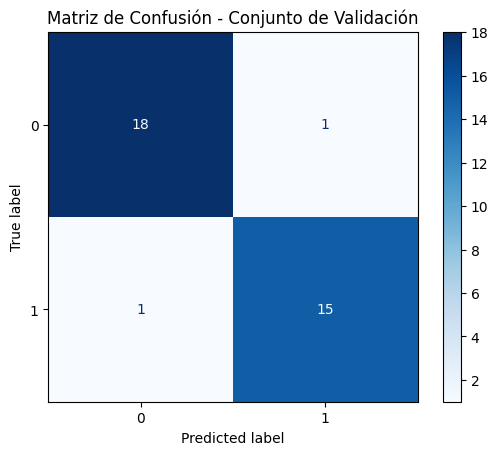

In [ ]:
cm = confusion_matrix(val_labels, val_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title('Matriz de Confusión - Conjunto de Validación')
plt.show()

# Curvas de aprendizaje Berto

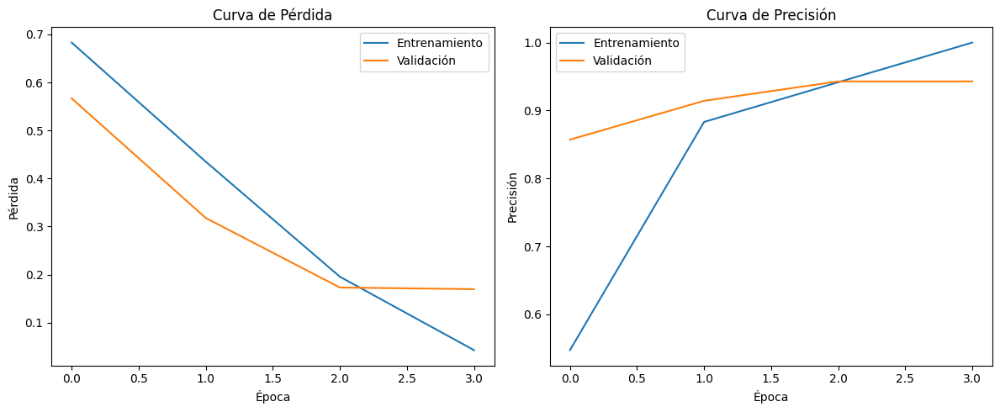

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Entrenamiento')
plt.plot(val_losses, label='Validación')
plt.xlabel('Época')
plt.ylabel('Pérdida')
plt.title('Curva de Pérdida')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Entrenamiento')
plt.plot(val_accuracies, label='Validación')
plt.xlabel('Época')
plt.ylabel('Precisión')
plt.title('Curva de Precisión')
plt.legend()

plt.tight_layout()
plt.show()

# Se guarda el modelo de Berto

In [ ]:
drive.mount('/content/drive')

output_dir = "/content/drive/MyDrive/modelo_beto_final"
os.makedirs(output_dir, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class AudioDataset(Dataset):
    def __init__(self, textos, etiquetas, tokenizer, max_len):
        self.textos = textos
        self.etiquetas = etiquetas
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.textos)

    def __getitem__(self, idx):
        texto = self.textos[idx]
        etiqueta = self.etiquetas[idx]
        inputs = self.tokenizer(
            texto,
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )
        return {
            'input_ids': inputs['input_ids'].squeeze(0),
            'attention_mask': inputs['attention_mask'].squeeze(0),
            'labels': torch.tensor(etiqueta, dtype=torch.long)
        }

model_name = 'dccuchile/bert-base-spanish-wwm-uncased'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2).to(device)

textos = df_audio_final['transcripcion_limpia'].tolist()
etiquetas = df_audio_final['categoria'].tolist()

BATCH_SIZE = 16
MAX_LEN = 128
EPOCHS = 4

dataset_completo = AudioDataset(textos, etiquetas, tokenizer, MAX_LEN)
data_loader_completo = DataLoader(dataset_completo, batch_size=BATCH_SIZE, shuffle=True)

optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5)

def train_epoch(model, data_loader, optimizer, device):
    model.train()
    total_loss = 0
    correct_preds = 0
    total_preds = 0

    for batch in data_loader:
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        logits = outputs.logits

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = torch.argmax(logits, dim=1)
        correct_preds += (preds == labels).sum().item()
        total_preds += labels.size(0)

    avg_loss = total_loss / len(data_loader)
    accuracy = correct_preds / total_preds
    return avg_loss, accuracy

for epoch in range(EPOCHS):
    print(f'Epoch {epoch + 1}/{EPOCHS}')
    train_loss, train_acc = train_epoch(model, data_loader_completo, optimizer, device)

    print(f'loss: {train_loss:.4f}, accuracy: {train_acc:.4f}')


model.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)

print(f'Modelo guardado en {output_dir}')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at dccuchile/bert-base-spanish-wwm-uncased and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/4
loss: 0.6506, accuracy: 0.6279
Epoch 2/4
loss: 0.4007, accuracy: 0.9244
Epoch 3/4
loss: 0.1524, accuracy: 0.9593
Epoch 4/4
loss: 0.0475, accuracy: 0.9942
Modelo guardado en /content/drive/MyDrive/modelo_beto_final


# Produccion

In [ ]:
def convertir_a_mfcc(ruta_audio, n_mfcc=13):

    y, sr = librosa.load(ruta_audio, sr=None)

    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)

    return mfcc

directorio_audio = '/content/drive/MyDrive/DataSet_testeo'
data = []


for root, dirs, files in os.walk(directorio_audio):
    for file in files:
        if file.endswith('.wav') or file.endswith('.opus'):
            ruta_audio = os.path.join(root, file)
            print(f"Transformando {ruta_audio} a MFCC...")


            mfcc = convertir_a_mfcc(ruta_audio)


            mfcc_mean = np.mean(mfcc, axis=1)


            if os.path.basename(root) == 'violento':
                etiqueta = 'Violento'
            elif os.path.basename(root) == 'No violento':
                etiqueta = 'No violento'
            else:
                etiqueta = 'Desconocido'


            data.append(np.append(mfcc_mean, etiqueta))


columnas = [f'mfcc_{i}' for i in range(1, mfcc.shape[0] + 1)] + ['etiqueta']
df_audio_escalado_testeo = pd.DataFrame(data, columns=columnas)

df_audio_escalado_testeo

Transformando /content/drive/MyDrive/DataSet_testeo/violento/Audio de WhatsApp 2024-10-24 a las 22.32.29_99fcf4a5.waptt.opus a MFCC...
Transformando /content/drive/MyDrive/DataSet_testeo/No violento/Audio de WhatsApp 2024-10-24 a las 22.21.21_354e9063.waptt.opus a MFCC...
Transformando /content/drive/MyDrive/DataSet_testeo/No violento/Audio de WhatsApp 2024-10-22 a las 19.36.24_93eac530.waptt.opus a MFCC...


,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,etiqueta
0,-156.80724,42.37091,-49.27401,0.4489629,-25.953398,-18.831978,-18.289604,-10.830105,-17.22086,6.568566,-12.561622,-2.2692943,-9.68414,Violento
1,-217.93893,86.94909,13.083198,36.043453,-19.383894,-20.840324,-29.015821,8.677641,-29.836494,1.9031073,-6.7960086,-12.7777405,-9.587365,No violento
2,-209.4265,133.01935,9.619546,19.521103,-13.266527,2.1048746,-7.451703,0.07572384,-1.737013,0.15063737,-3.977713,2.545835,-4.287397,No violento


In [ ]:
for columna in df_audio_escalado_testeo.columns:
    if columna != 'etiqueta':  # Excluir la columna 'etiqueta' (que contiene texto)
        df_audio_escalado_testeo[columna] = pd.to_numeric(df_audio_escalado_testeo[columna], errors='coerce').astype(float)

df_audio_escalado_testeo

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,etiqueta
0,-156.80724,42.37091,-49.274010,0.448963,-25.953398,-18.831978,-18.289604,-10.830105,-17.220860,6.568566,-12.561622,-2.269294,-9.684140,Violento
1,-217.93893,86.94909,13.083198,36.043453,-19.383894,-20.840324,-29.015821,8.677641,-29.836494,1.903107,-6.796009,-12.777741,-9.587365,No violento
2,-209.42650,133.01935,9.619546,19.521103,-13.266527,2.104875,-7.451703,0.075724,-1.737013,0.150637,-3.977713,2.545835,-4.287397,No violento


In [ ]:
df_audio_escalado_testeo['etiqueta'] = df_audio_escalado_testeo['etiqueta'].map({'Violento': 1, 'No violento': 0})
df_audio_escalado_testeo

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,etiqueta
0,-156.80724,42.37091,-49.274010,0.448963,-25.953398,-18.831978,-18.289604,-10.830105,-17.220860,6.568566,-12.561622,-2.269294,-9.684140,1
1,-217.93893,86.94909,13.083198,36.043453,-19.383894,-20.840324,-29.015821,8.677641,-29.836494,1.903107,-6.796009,-12.777741,-9.587365,0
2,-209.42650,133.01935,9.619546,19.521103,-13.266527,2.104875,-7.451703,0.075724,-1.737013,0.150637,-3.977713,2.545835,-4.287397,0


In [ ]:
y = df_audio_escalado_testeo['etiqueta']
x = df_audio_escalado_testeo.drop(['etiqueta'], axis = 1)

In [ ]:
transformer = Normalizer().fit(x)
x = pd.DataFrame(transformer.transform(x), columns=x.columns)
x

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13
0,-0.892213,0.241085,-0.280363,0.002555,-0.147671,-0.107152,-0.104065,-0.061622,-0.097984,0.037374,-0.071474,-0.012912,-0.055102
1,-0.893836,0.356605,0.053658,0.147825,-0.079499,-0.085473,-0.119003,0.035590,-0.122369,0.007805,-0.027873,-0.052406,-0.039321
2,-0.839003,0.532901,0.038538,0.078205,-0.053148,0.008433,-0.029853,0.000303,-0.006959,0.000603,-0.015935,0.010199,-0.017176


In [ ]:
filename = '/content/drive/My Drive/knn_PLN_entrenado_entrenamiento_finalizado_audio.sav'
loaded_model = joblib.load(filename)

predicciones = loaded_model.predict(x)

predicciones = pd.DataFrame(predicciones, columns=['Predicciones'])
predicciones = pd.concat([x.reset_index(drop=True), predicciones], axis=1)
predicciones

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,Predicciones
0,-0.892213,0.241085,-0.280363,0.002555,-0.147671,-0.107152,-0.104065,-0.061622,-0.097984,0.037374,-0.071474,-0.012912,-0.055102,1
1,-0.893836,0.356605,0.053658,0.147825,-0.079499,-0.085473,-0.119003,0.035590,-0.122369,0.007805,-0.027873,-0.052406,-0.039321,1
2,-0.839003,0.532901,0.038538,0.078205,-0.053148,0.008433,-0.029853,0.000303,-0.006959,0.000603,-0.015935,0.010199,-0.017176,0


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = whisper.load_model("medium", device=device)

100%|█████████████████████████████████████| 1.42G/1.42G [00:19<00:00, 76.9MiB/s]
/usr/local/lib/python3.10/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

In [ ]:
def cargar_audios_en_dataframe(base_path):

    data = []


    categorias = ["No violento", "violento"]


    for categoria in categorias:

        carpeta_path = os.path.join(base_path, categoria)


        if os.path.exists(carpeta_path):

            for archivo in os.listdir(carpeta_path):

                archivo_path = os.path.join(carpeta_path, archivo)


                if os.path.isfile(archivo_path):

                    data.append({"ruta_audio": archivo_path, "categoria": categoria})
        else:
            print(f"La carpeta {categoria} no existe en la ruta especificada.")


    df_audios = pd.DataFrame(data)

    return df_audios


def transcribir_audios(df, model):

    transcripciones = []


    for index, row in df.iterrows():

        ruta_audio = row['ruta_audio']

        try:

            resultado = model.transcribe(ruta_audio)

            transcripciones.append(resultado['text'])

        except Exception as e:

            transcripciones.append(f"Error: {str(e)}")

    df['transcripcion'] = transcripciones

    return df


ruta_base = '/content/drive/MyDrive/DataSet_testeo'


df_audios = cargar_audios_en_dataframe(ruta_base)


df_audios = transcribir_audios(df_audios, model)

df_audios

/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


,ruta_audio,categoria,transcripcion
0,/content/drive/MyDrive/DataSet_testeo/No viole...,No violento,Ese mismo gol que acaba de hacer Messi hizo e...
1,/content/drive/MyDrive/DataSet_testeo/No viole...,No violento,"No, Tomo... a la vuelta hay una verdurería. A..."
2,/content/drive/MyDrive/DataSet_testeo/violento...,violento,"¿Qué onda, amor? ¿Ya llegaste a casa? No qued..."


In [ ]:
df_audios = df_audios.drop(['ruta_audio'], axis = 1)
df_audios['categoria'] = df_audios['categoria'].map({'violento': 1, 'No violento': 0})
df_audios

,categoria,transcripcion
0,0,Ese mismo gol que acaba de hacer Messi hizo e...
1,0,"No, Tomo... a la vuelta hay una verdurería. A..."
2,1,"¿Qué onda, amor? ¿Ya llegaste a casa? No qued..."


In [ ]:
df_audios_testeo_modelo = df_audios.drop(['categoria'], axis = 1)
df_audios_testeo_modelo

,transcripcion
0,Ese mismo gol que acaba de hacer Messi hizo e...
1,"No, Tomo... a la vuelta hay una verdurería. A..."
2,"¿Qué onda, amor? ¿Ya llegaste a casa? No qued..."


In [ ]:
for index, row in df_audios.iterrows():
    print(f"Diálogo en la fila {index} (Categoría: {row['categoria']}): {row['transcripcion']}")

Diálogo en la fila 0 (Categoría: 0):  Ese mismo gol que acaba de hacer Messi hizo exactamente el mismo gol o muy parecido por lo menos en el año o mejor dicho en la edición 2010 de la UEFA Champions League contra el Arsenal partido octavo final partido de vuelta en el Camp Nou que arranca perdiendo el Barça 1-0 y después Messi hace 4 goles, un póquer y el primer gol que hace Messi contra el Arsenal es muy parecido a este gol que le hizo Bolivia
Diálogo en la fila 1 (Categoría: 0):  No, Tomo... a la vuelta hay una verdurería. Ahí estamos.
Diálogo en la fila 2 (Categoría: 1):  ¿Qué onda, amor? ¿Ya llegaste a casa? No quedate, morir pedazo de gira. Llegaste a casa, no venas a casa porque te cago trompado, vírate. Llegaste a casa y se pudre todo, grande. Grande, máglica.


In [ ]:
stop_words = set(stopwords.words('spanish'))

def limpiar_texto(texto):
    if isinstance(texto, list):
        texto = ' '.join(texto)
    if not isinstance(texto, str):
        return ''

    palabras = texto.lower().split()
    palabras_filtradas = [palabra for palabra in palabras if not palabra.isdigit() and palabra not in stop_words]

    return ' '.join(palabras_filtradas)

def aplicar_limpieza(df):
    df['transcripcion'] = df['transcripcion'].apply(limpiar_texto)
    return df

df_final = aplicar_limpieza(df_audios_testeo_modelo)
df_final

,transcripcion
0,mismo gol acaba hacer messi hizo exactamente m...
1,"no, tomo... vuelta verdurería. ahí estamos."
2,"¿qué onda, amor? ¿ya llegaste casa? quedate, m..."


In [ ]:
import os
import torch
from google.colab import drive


drive.mount('/content/drive')


from transformers import AutoModelForSequenceClassification, AutoTokenizer
output_dir = "/content/drive/MyDrive/modelo_beto_final"
model_class = AutoModelForSequenceClassification
model = model_class.from_pretrained(output_dir)
tokenizer = AutoTokenizer.from_pretrained(output_dir)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)


inputs = tokenizer(df_final['transcripcion'].tolist(), padding=True, truncation=True, return_tensors="pt").to(device)


with torch.no_grad():
    outputs = model(**inputs)


predictions = torch.argmax(outputs.logits, dim=1).cpu().numpy()


df_final['predictions'] = predictions

df_final

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,transcripcion,predictions
0,mismo gol acaba hacer messi hizo exactamente m...,0
1,"no, tomo... vuelta verdurería. ahí estamos.",0
2,"¿qué onda, amor? ¿ya llegaste casa? quedate, m...",1


In [ ]:
df_audios

,categoria,transcripcion
0,0,Ese mismo gol que acaba de hacer Messi hizo e...
1,0,"No, Tomo... a la vuelta hay una verdurería. A..."
2,1,"¿Qué onda, amor? ¿Ya llegaste a casa? No qued..."
